<a href="https://colab.research.google.com/github/6FAN/used-car-selling-in-india/blob/main/used_car_selling_in_india.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns

# Importing The Data

from google.clobe import files
files.upload()


In [ ]:
df_1 = pd.read_csv('Car details.csv')
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [ ]:
df_1.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
6,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.3 km/kg,1061 CC,57.5 bhp,"7.8@ 4,500(kgm@ rpm)",5.0
7,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm,4.0
8,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59 kmpl,1364 CC,67.1 bhp,170Nm@ 1800-2400rpm,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.0 kmpl,1399 CC,68.1 bhp,160Nm@ 2000rpm,5.0


In [ ]:
df_1.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0
8127,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [ ]:
df_1.shape

(8128, 13)

In [ ]:
df_1.isnull().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
dtype: int64

# Removing Unwanted Column

In [ ]:
df_1 = df_1.drop(columns=['torque'])
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,5.0


# Changing Column Name

In [ ]:
df_1 = df_1.rename(columns={
    'max_power':'max_power(bhp)'
})
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,5.0


In [ ]:
df_1['max_power(bhp)'] = df_1[
 'max_power(bhp)'].str.replace('bhp','')
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70,5.0


In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            8128 non-null   object 
 1   year            8128 non-null   int64  
 2   selling_price   8128 non-null   int64  
 3   km_driven       8128 non-null   int64  
 4   fuel            8128 non-null   object 
 5   seller_type     8128 non-null   object 
 6   transmission    8128 non-null   object 
 7   owner           8128 non-null   object 
 8   mileage         7907 non-null   object 
 9   engine          7907 non-null   object 
 10  max_power(bhp)  7913 non-null   object 
 11  seats           7907 non-null   float64
dtypes: float64(1), int64(3), object(8)
memory usage: 762.1+ KB


In [ ]:
df_1['max_power(bhp)'] = df_1[
  'max_power(bhp)'].str.replace(" ", '')

# Converting Object to Float

In [ ]:
df_1[
 'max_power(bhp)'] = pd.to_numeric(df_1[
    'max_power(bhp)'])


In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            8128 non-null   object 
 1   year            8128 non-null   int64  
 2   selling_price   8128 non-null   int64  
 3   km_driven       8128 non-null   int64  
 4   fuel            8128 non-null   object 
 5   seller_type     8128 non-null   object 
 6   transmission    8128 non-null   object 
 7   owner           8128 non-null   object 
 8   mileage         7907 non-null   object 
 9   engine          7907 non-null   object 
 10  max_power(bhp)  7912 non-null   float64
 11  seats           7907 non-null   float64
dtypes: float64(2), int64(3), object(7)
memory usage: 762.1+ KB


In [ ]:
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70.00,5.0


In [ ]:
df_1 = df_1.rename(columns={
    'engine':'engine(CC)'
})
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70.00,5.0


In [ ]:
df_1['engine(CC)'] = df_1[
   'engine(CC)'].str.replace('CC','')
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396,70.00,5.0


In [ ]:
df_1[
 'engine(CC)'] = pd.to_numeric(df_1[
    'engine(CC)'])

In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            8128 non-null   object 
 1   year            8128 non-null   int64  
 2   selling_price   8128 non-null   int64  
 3   km_driven       8128 non-null   int64  
 4   fuel            8128 non-null   object 
 5   seller_type     8128 non-null   object 
 6   transmission    8128 non-null   object 
 7   owner           8128 non-null   object 
 8   mileage         7907 non-null   object 
 9   engine(CC)      7907 non-null   float64
 10  max_power(bhp)  7912 non-null   float64
 11  seats           7907 non-null   float64
dtypes: float64(3), int64(3), object(6)
memory usage: 762.1+ KB


In [ ]:
df_1 = df_1.rename(columns={
    'mileage' : 'mileage(kmpl)'
})
df_1

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396.0,70.00,5.0


In [ ]:
df_1['mileage(kmpl)'] = df_1[
  'mileage(kmpl)'].str.replace('kmpl','')
df_1


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [ ]:
df_1['mileage(kmpl)'] = df_1[
 'mileage(kmpl)'].str.replace('km/kg','')

In [ ]:
df_1[
 'mileage(kmpl)'] = pd.to_numeric(df_1[
    'mileage(kmpl)'])

In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            8128 non-null   object 
 1   year            8128 non-null   int64  
 2   selling_price   8128 non-null   int64  
 3   km_driven       8128 non-null   int64  
 4   fuel            8128 non-null   object 
 5   seller_type     8128 non-null   object 
 6   transmission    8128 non-null   object 
 7   owner           8128 non-null   object 
 8   mileage(kmpl)   7907 non-null   float64
 9   engine(CC)      7907 non-null   float64
 10  max_power(bhp)  7912 non-null   float64
 11  seats           7907 non-null   float64
dtypes: float64(4), int64(3), object(5)
memory usage: 762.1+ KB


# Pre-processing Data

In [ ]:
df_1.isnull().sum()

name                0
year                0
selling_price       0
km_driven           0
fuel                0
seller_type         0
transmission        0
owner               0
mileage(kmpl)     221
engine(CC)        221
max_power(bhp)    216
seats             221
dtype: int64

In [ ]:
Avg = df_1['mileage(kmpl)'].mean()
Avg

19.41878335651954

In [ ]:
df_1['mileage(kmpl)'] = df_1[
    'mileage(kmpl)'].fillna(Avg)

In [ ]:
df_1.isnull().sum()

name                0
year                0
selling_price       0
km_driven           0
fuel                0
seller_type         0
transmission        0
owner               0
mileage(kmpl)       0
engine(CC)        221
max_power(bhp)    216
seats             221
dtype: int64

In [ ]:
df_1.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

In [ ]:
Midel = df_1['engine(CC)'].median()
Midel

1248.0

In [ ]:
df_1['engine(CC)'] = df_1[
    'engine(CC)'].fillna(Midel)

In [ ]:
df_1.isnull().sum()

name                0
year                0
selling_price       0
km_driven           0
fuel                0
seller_type         0
transmission        0
owner               0
mileage(kmpl)       0
engine(CC)          0
max_power(bhp)    216
seats             221
dtype: int64

In [ ]:
mid = df_1['max_power(bhp)'].median()
mid

82.0

In [ ]:
df_1['max_power(bhp)'] = df_1[
    'max_power(bhp)'].fillna(mid)


In [ ]:
df_1.isnull().sum()

name                0
year                0
selling_price       0
km_driven           0
fuel                0
seller_type         0
transmission        0
owner               0
mileage(kmpl)       0
engine(CC)          0
max_power(bhp)      0
seats             221
dtype: int64

In [ ]:
a = df_1['seats'].median()
a

5.0

In [ ]:
df_1['seats'] = df_1['seats'].fillna(a)
df_1.isnull().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage(kmpl)     0
engine(CC)        0
max_power(bhp)    0
seats             0
dtype: int64

# Anova Test

In [ ]:
df = df_1.copy()
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [ ]:
df_anov = df[[
    'selling_price','fuel'
]]
df_anov

,selling_price,fuel
0,450000,Diesel
1,370000,Diesel
2,158000,Petrol
3,225000,Diesel
4,130000,Petrol
...,...,...
8123,320000,Petrol
8124,135000,Diesel
8125,382000,Diesel
8126,290000,Diesel


In [ ]:
grop = pd.unique(df_anov.fuel.values)
grop

array(['Diesel', 'Petrol', 'LPG', 'CNG'], dtype=object)

In [ ]:
d_data = {
    grp: df_anov['selling_price'][
  df_anov.fuel==grp ] for grp in grop
}
d_data

{'Diesel': 0       450000
 1       370000
 3       225000
 8       350000
 9       200000
          ...  
 8122    475000
 8124    135000
 8125    382000
 8126    290000
 8127    290000
 Name: selling_price, Length: 4402, dtype: int64,
 'Petrol': 2       158000
 4       130000
 5       440000
 7        45000
 11       92000
          ...  
 8118    380000
 8119    360000
 8120    120000
 8121    260000
 8123    320000
 Name: selling_price, Length: 3631, dtype: int64,
 'LPG': 6        96000
 90      225000
 870     231000
 1511    300000
 1658    105000
 1907    250000
 2108    170000
 2166    200000
 2466    110000
 2484    150000
 2518    275000
 2579    300000
 2588    160000
 3010    200000
 3042    375000
 3050    200000
 3216    175000
 3466    120000
 3492    150000
 3751    185000
 3796    110000
 3823    350000
 4045    222000
 4542     70000
 4545    300000
 5322     55000
 5436    149000
 5437    100000
 5578    148000
 5768    275000
 6007     54000
 6253    275000
 6338    

In [ ]:
import scipy.stats as st

In [ ]:
f, p = st.f_oneway(d_data['Diesel'],
                  d_data['Petrol'],
                  d_data['LPG'],
                  d_data['CNG'])

print(f)
print(p)

122.88062883888716
7.768067697277526e-78


In [ ]:
nset_df = df.drop(columns=['seats'])
nset_df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp)
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20
...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00


# Line Chart

In [ ]:
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


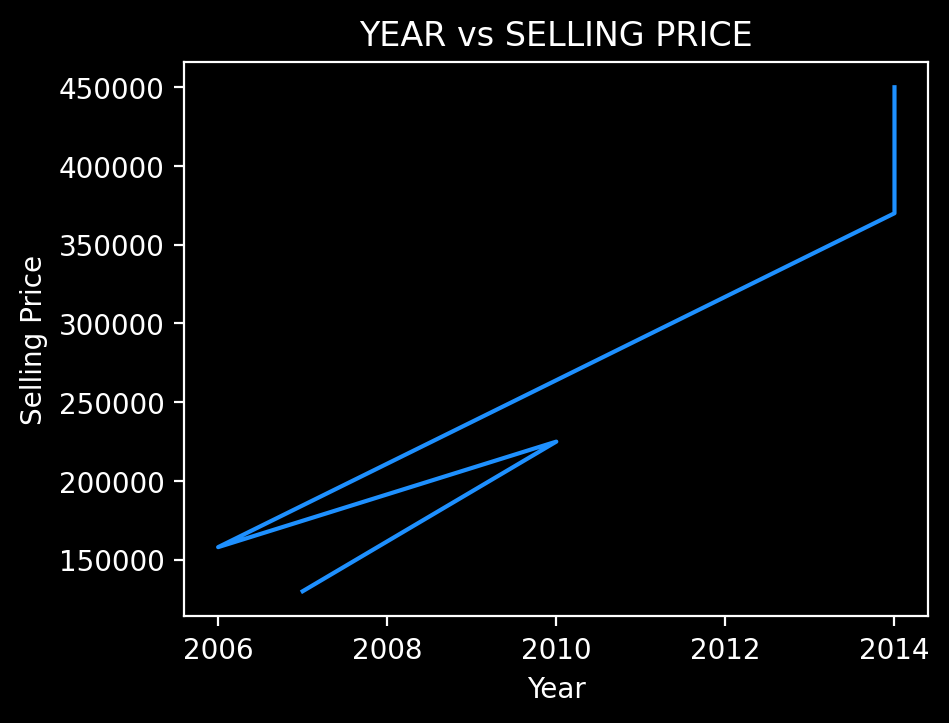

In [ ]:
x = df['selling_price'].head()
y = df['year'].head()
plt.plot(y, x, color='dodgerblue')
plt.xlabel('Year')
plt.ylabel('Selling Price')
plt.title('YEAR vs SELLING PRICE')
plt.show()

# BarChart

In [ ]:
bar_df = df[[
    'year', 'selling_price'
]]
bar_df

,year,selling_price
0,2014,450000
1,2014,370000
2,2006,158000
3,2010,225000
4,2007,130000
...,...,...
8123,2013,320000
8124,2007,135000
8125,2009,382000
8126,2013,290000


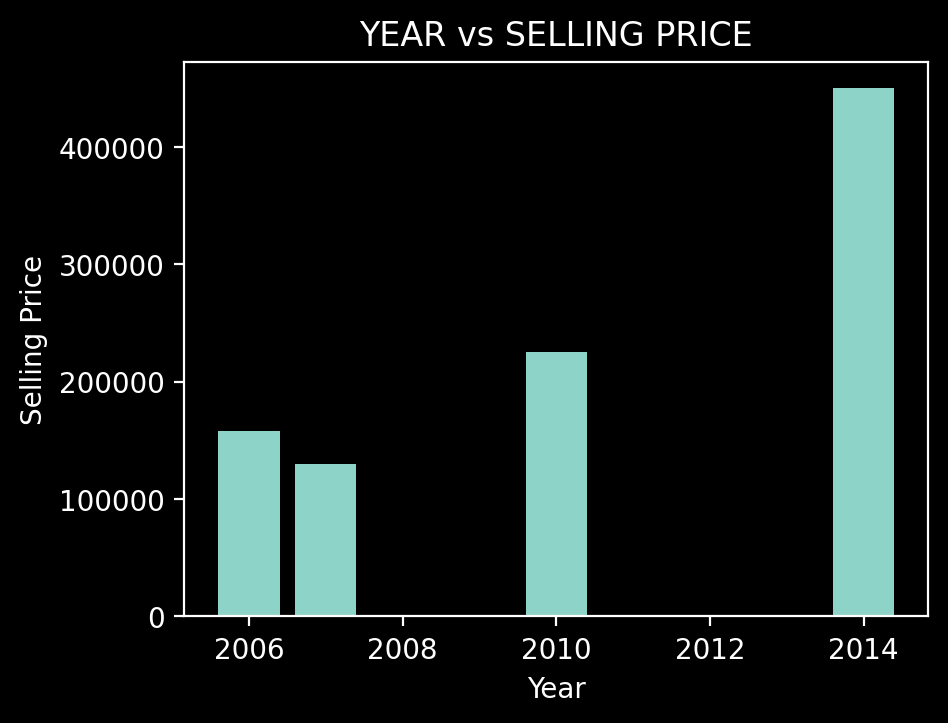

In [ ]:
plt.bar(y, x)
plt.xlabel('Year')
plt.ylabel('Selling Price')
plt.title('YEAR vs SELLING PRICE')
plt.show()

# HistoGram

In [ ]:
hist_df = df[[
    'year','mileage(kmpl)'
]]
hist_df.head(10)

,year,mileage(kmpl)
0,2014,23.40
1,2014,21.14
2,2006,17.70
3,2010,23.00
4,2007,16.10
5,2017,20.14
6,2007,17.30
7,2001,16.10
8,2011,23.59
9,2013,20.00


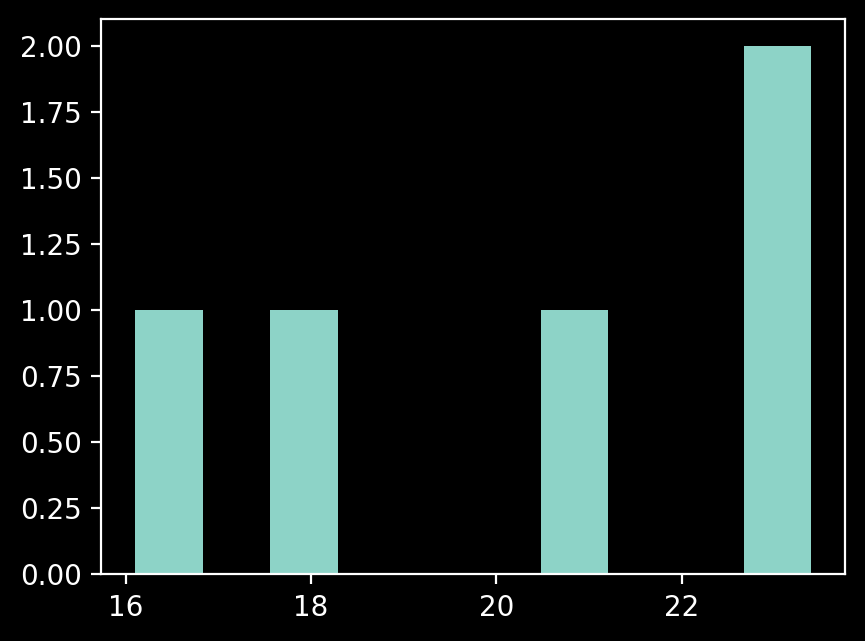

In [ ]:
z = df['mileage(kmpl)'].head()
plt.hist(z)
plt.show()

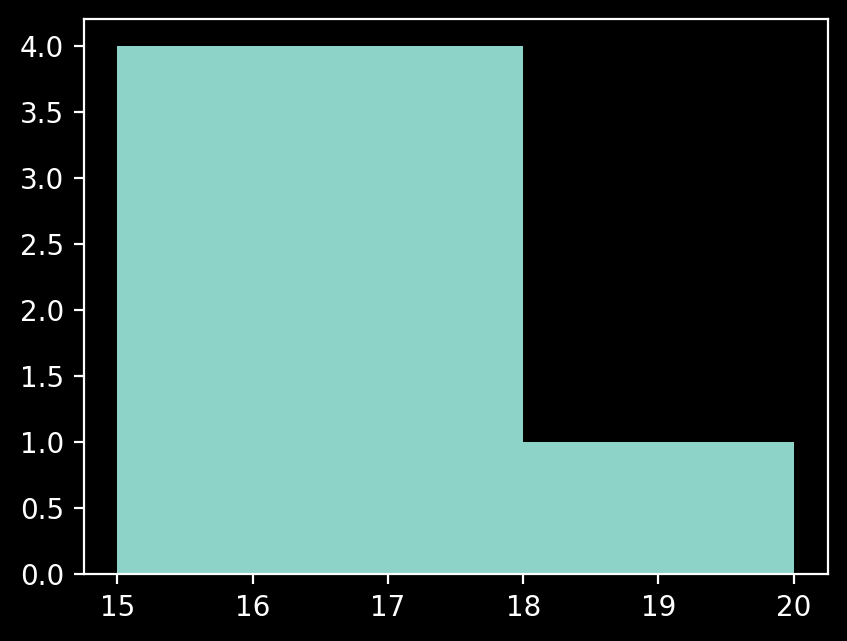

In [ ]:
z = df['mileage(kmpl)'].head(10)
plt.hist(z, bins=[15, 18, 20])
plt.show()

In [ ]:
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

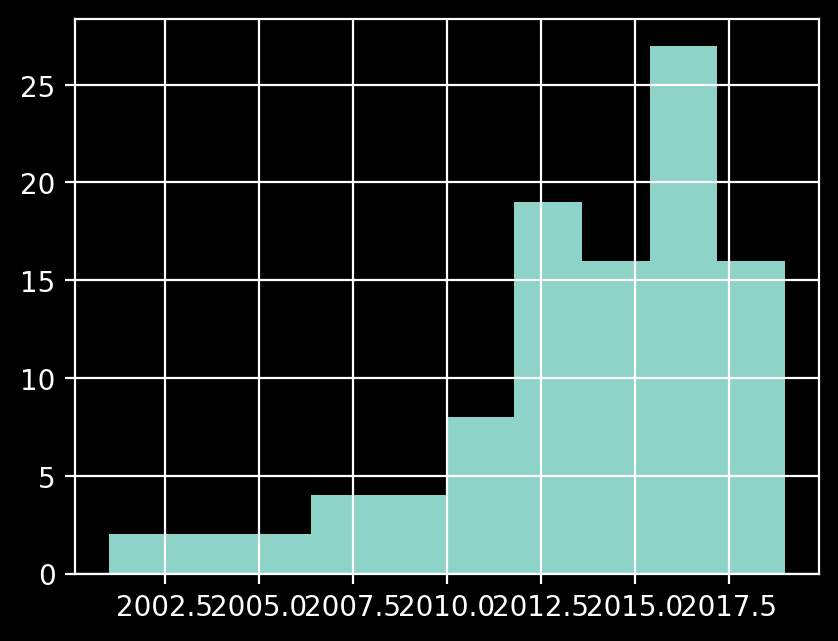

In [ ]:
df['year'].head(100).hist()
plt.show()

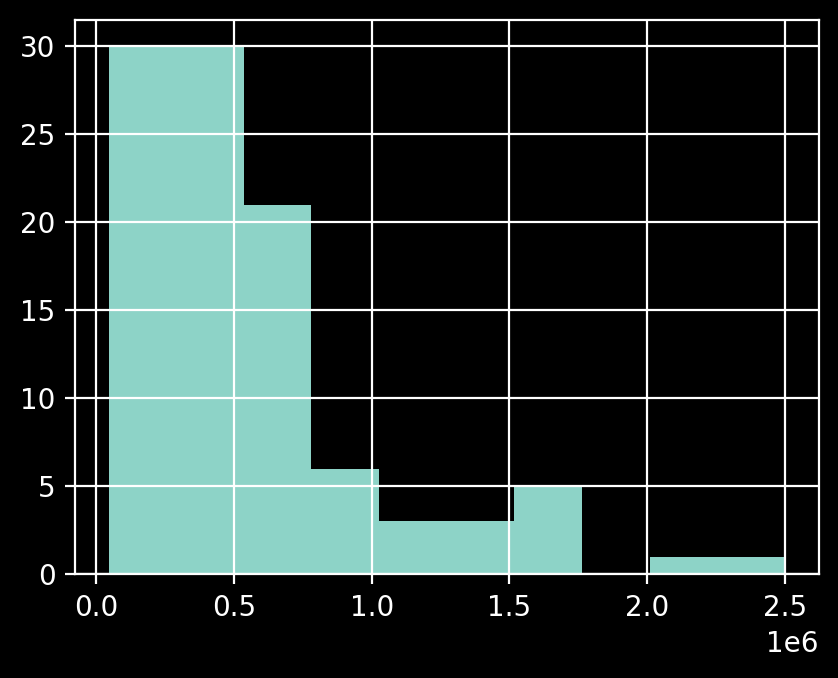

In [ ]:
df['selling_price'].head(100).hist()
plt.show()

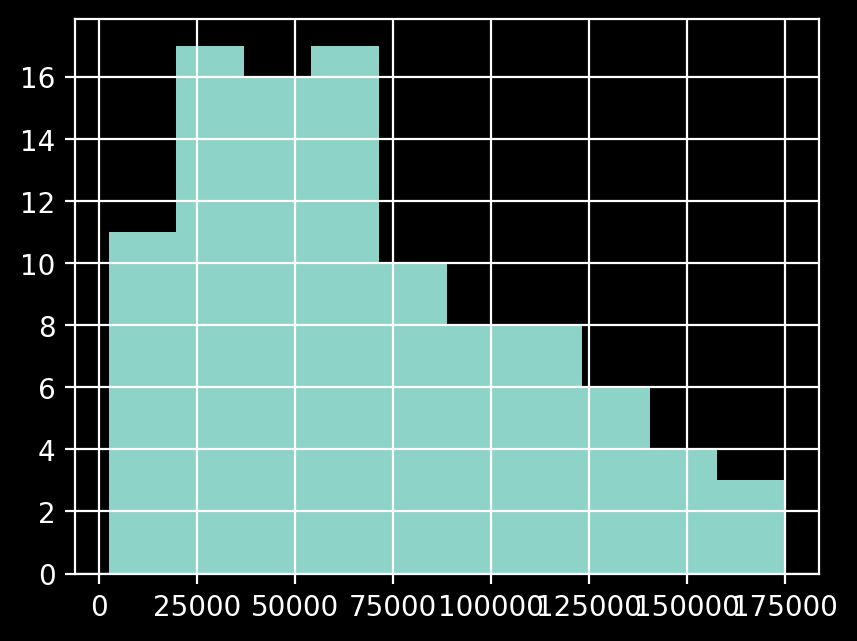

In [ ]:
df['km_driven'].head(100).hist()
plt.show()

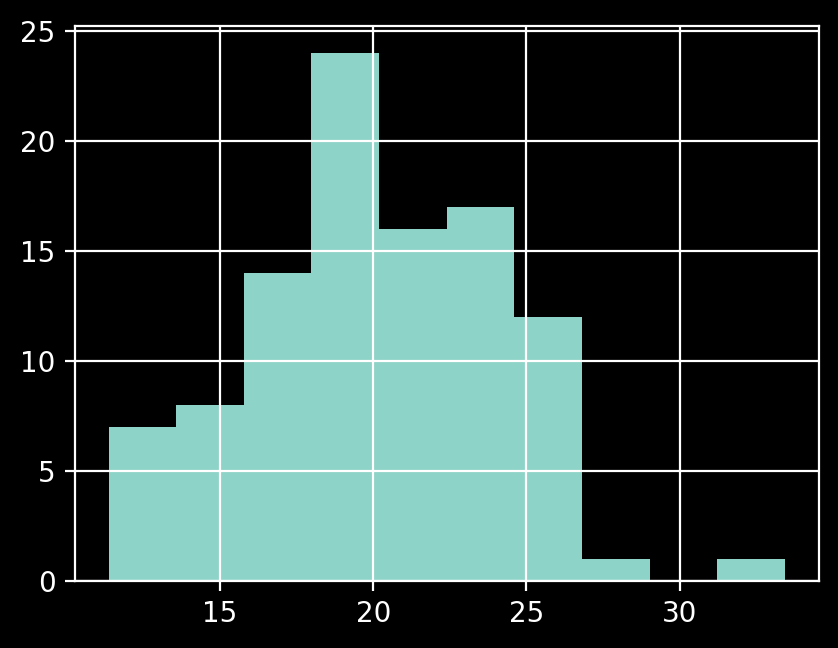

In [ ]:
df['mileage(kmpl)'].head(100).hist()
plt.show()

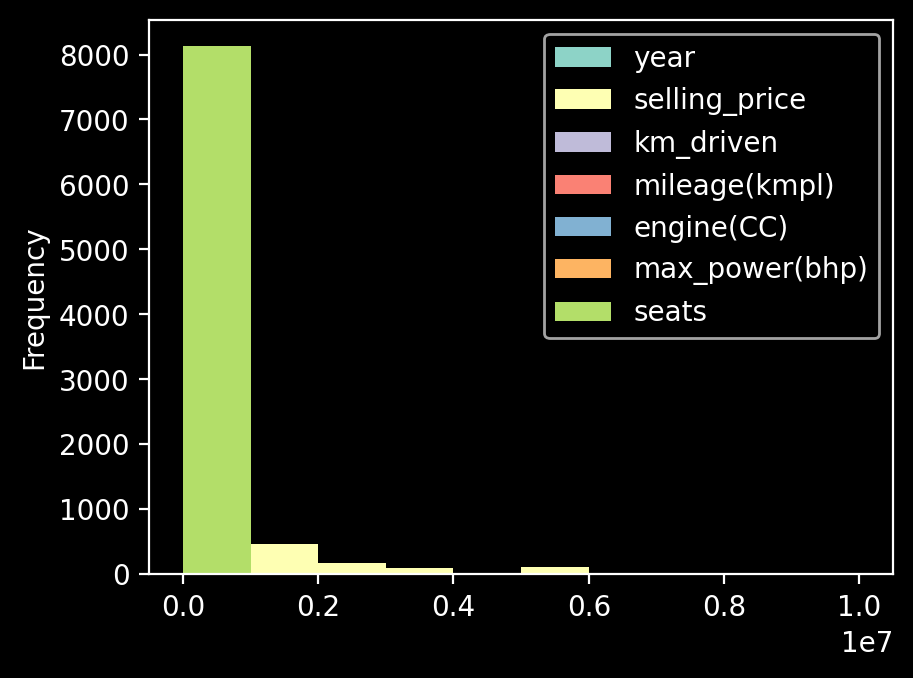

In [ ]:
df.plot.hist()
plt.show()

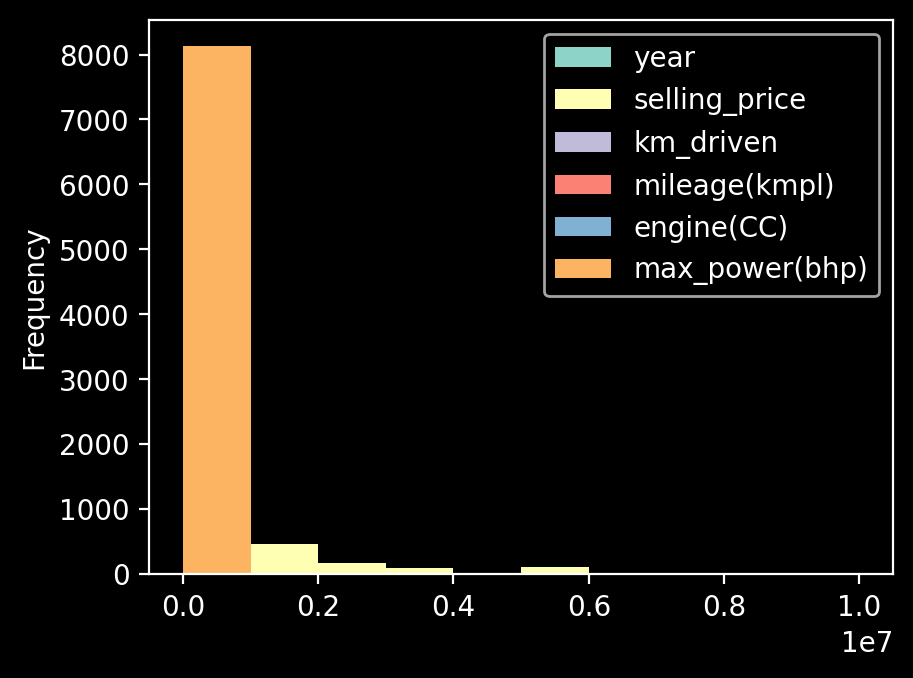

In [ ]:
nset_df.plot.hist()
plt.show()

# scatterplot

In [ ]:
df['fuel'].value_counts()

Diesel    4402
Petrol    3631
CNG         57
LPG         38
Name: fuel, dtype: int64

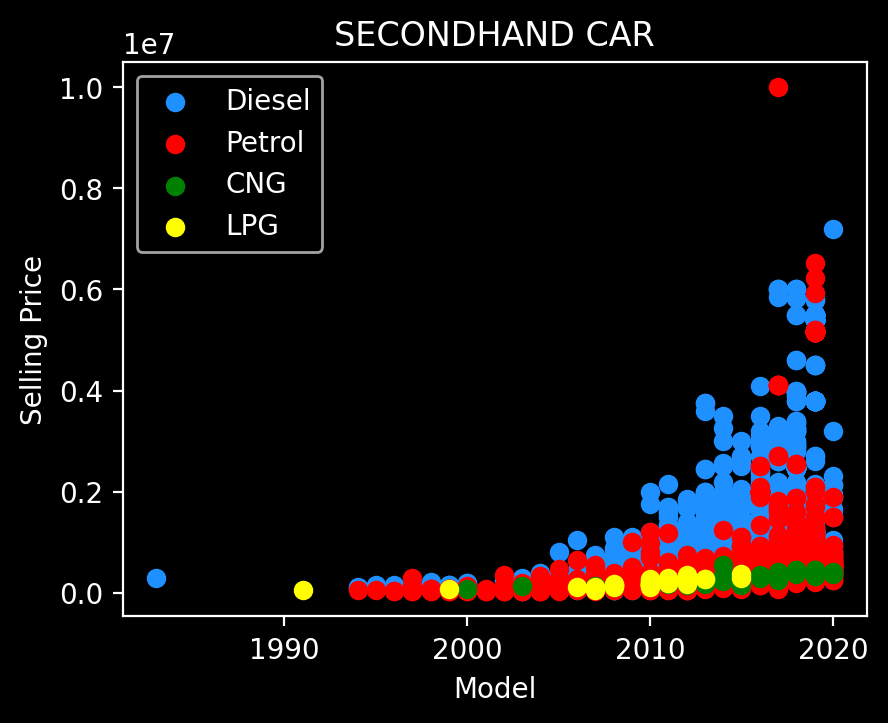

In [ ]:
colors = [
    'dodgerblue',
    'red',
    'green',
    'yellow']
fu = ['Diesel','Petrol','CNG','LPG']

for i in range(4):
    x = df[df['fuel']==fu[i]]
    plt.scatter(x['year'],
               x['selling_price'],
               c = colors[i],
               label=fu[i])

plt.xlabel('Model')
plt.ylabel('Selling Price')
plt.title('SECONDHAND CAR')
plt.legend()
plt.show()

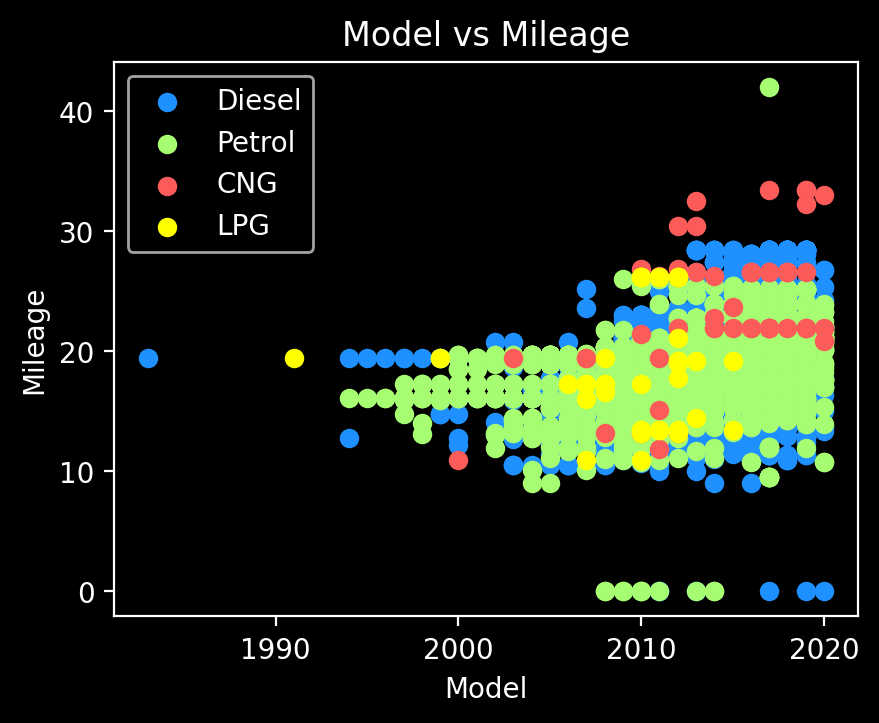

In [ ]:
c = ['dodgerblue',
     '#A6FD71',
     '#FB5C59',
      'yellow']

fu = ['Diesel','Petrol','CNG','LPG']

for i in range(4):
    x = df[df['fuel']==fu[i]]
    plt.scatter(x['year'],
               x['mileage(kmpl)'],
               c = c[i],
               label=fu[i])

plt.xlabel('Model')
plt.ylabel('Mileage')
plt.title('Model vs Mileage')
plt.legend()
plt.show()

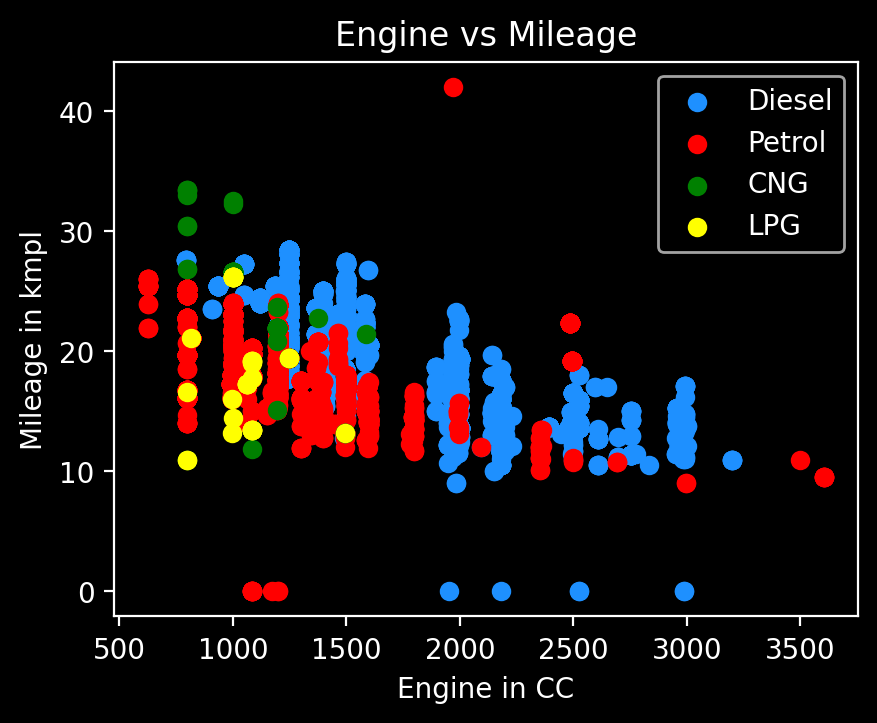

In [ ]:
colors = [
    'dodgerblue',
    'red',
    'green',
    'yellow']

fu = ['Diesel','Petrol','CNG','LPG']

for i in range(4):
    x = df[df['fuel'] == fu[i]]
    plt.scatter(x['engine(CC)'],
               x['mileage(kmpl)'],
               c = colors[i],
               label=fu[i])

plt.xlabel('Engine in CC')
plt.ylabel('Mileage in kmpl')
plt.title('Engine vs Mileage')
plt.legend()
plt.show()

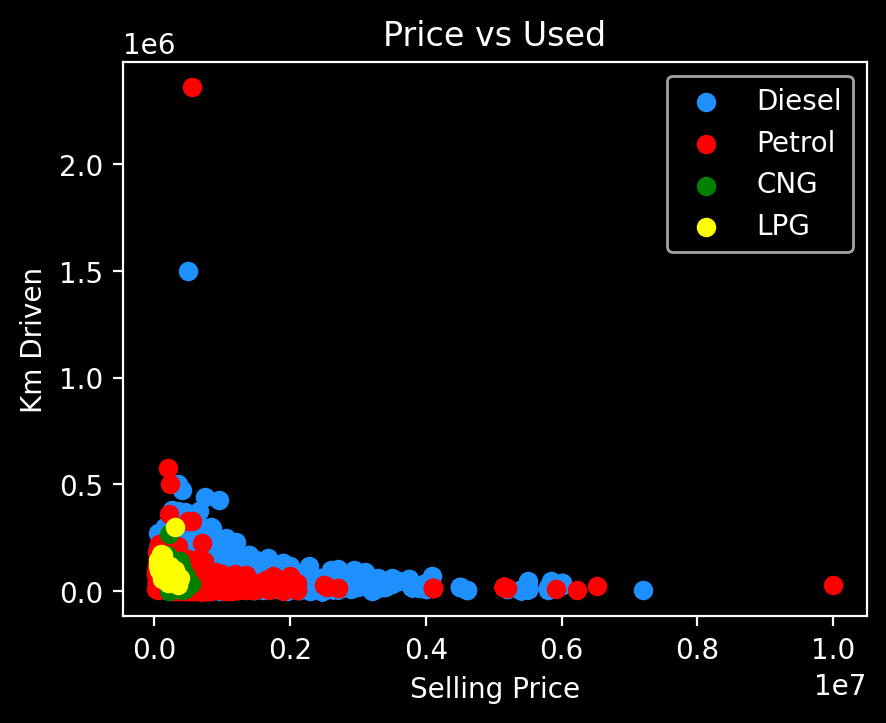

In [ ]:
colors = [
    'dodgerblue',
    'red',
    'green',
    'yellow']
fu = ['Diesel','Petrol','CNG','LPG']

for i in range(4):
    d = df[df['fuel']==fu[i]]
    plt.scatter(d['selling_price'],
               d['km_driven'],
               color=colors[i],
               label=fu[i])

plt.xlabel('Selling Price')
plt.ylabel('Km Driven')
plt.title('Price vs Used')
plt.legend()
plt.show()

# Pie Chart

In [ ]:
df.tail(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
8118,Hyundai i20 Magna,2013,380000,25000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8119,Maruti Wagon R LXI Optional,2017,360000,80000,Petrol,Individual,Manual,First Owner,20.51,998.0,67.04,5.0
8120,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,5.0
8121,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
8122,Hyundai i20 Magna 1.4 CRDi,2014,475000,80000,Diesel,Individual,Manual,Second Owner,22.54,1396.0,88.73,5.0
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0
8127,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


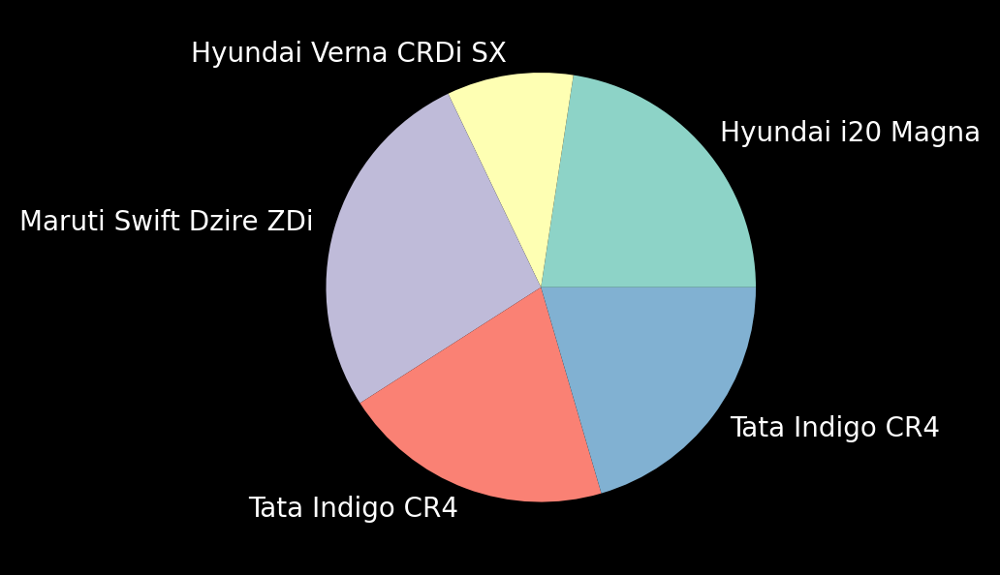

In [ ]:
data = df['name'].tail()
c = df['selling_price'].tail()

plt.pie(c, labels=data)
plt.show()

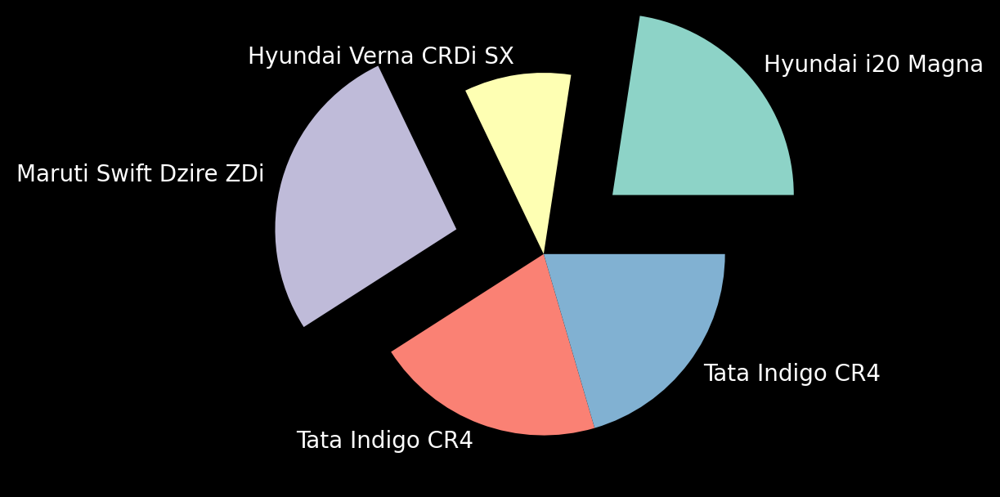

In [ ]:
data = df['name'].tail()
c = df['selling_price'].tail()
e = [0.5, 0, 0.5, 0, 0]

plt.pie(c, explode=e, labels=data)
plt.show()

# 3D Chart

In [ ]:
df.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
6,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061.0,57.50,5.0
7,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796.0,37.00,4.0
8,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364.0,67.10,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,5.0


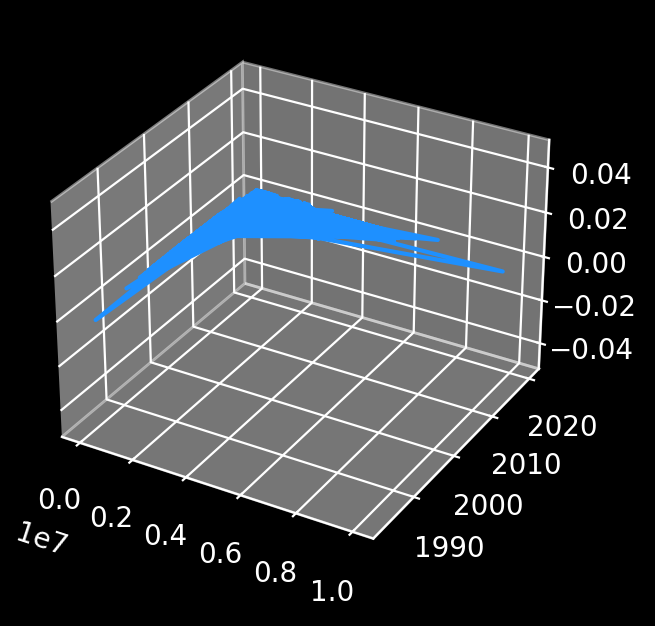

In [ ]:
x = df['selling_price']
y = df['year']

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

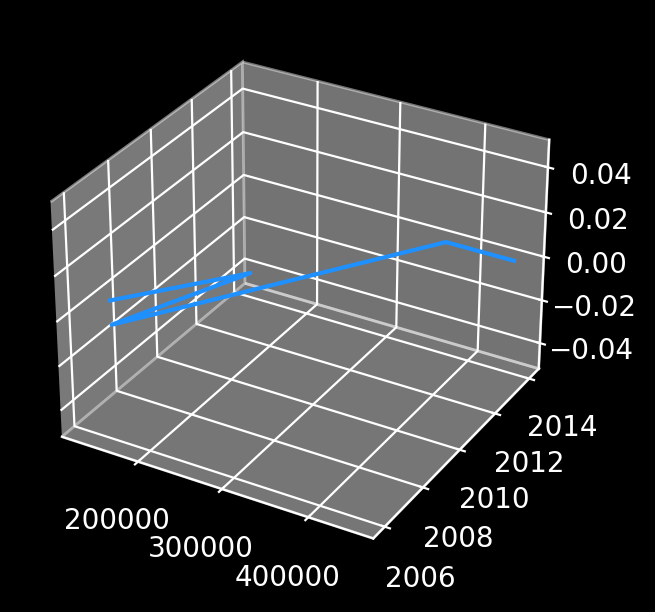

In [ ]:
x = df['selling_price'].head()
y = df['year'].head()

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

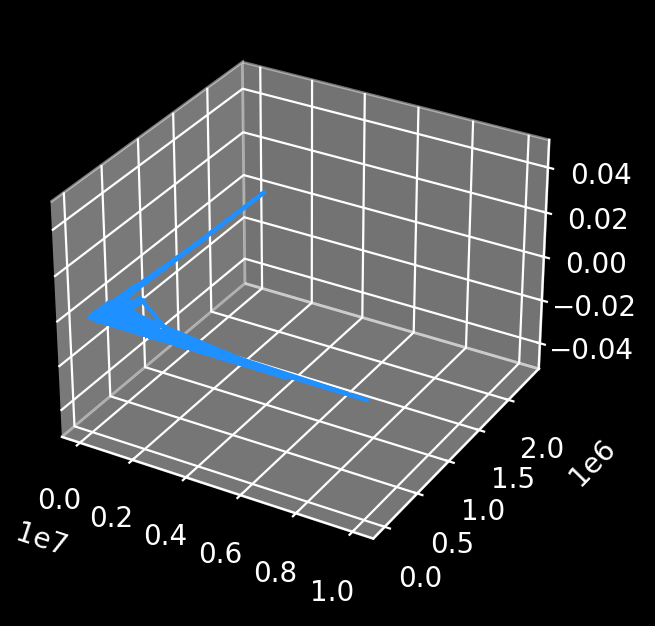

In [ ]:
x = df['selling_price']
y = df['km_driven']

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

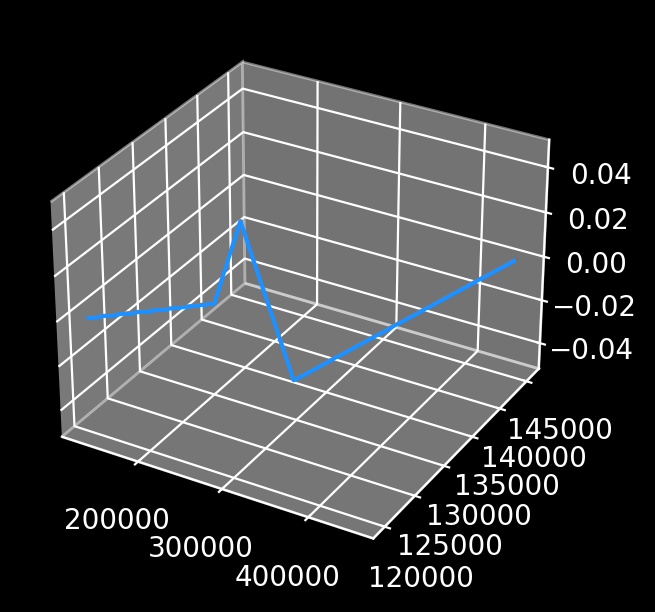

In [ ]:
x = df['selling_price'].head()
y = df['km_driven'].head()

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

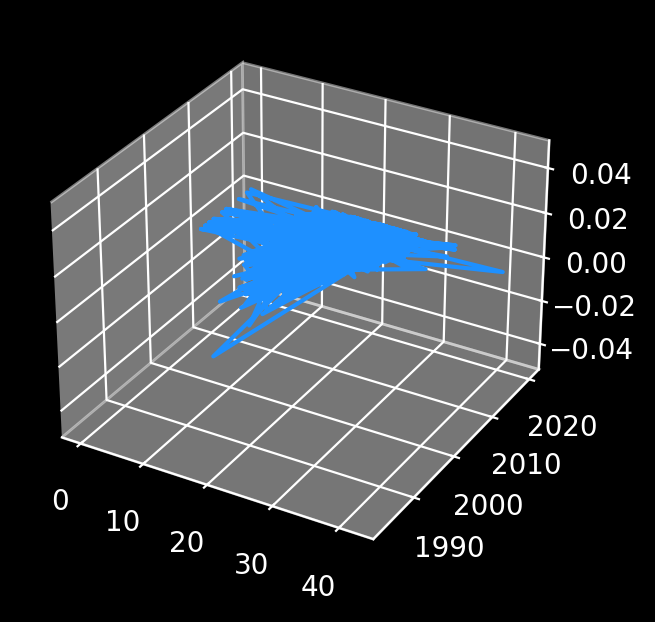

In [ ]:
x = df['mileage(kmpl)']
y = df['year']

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

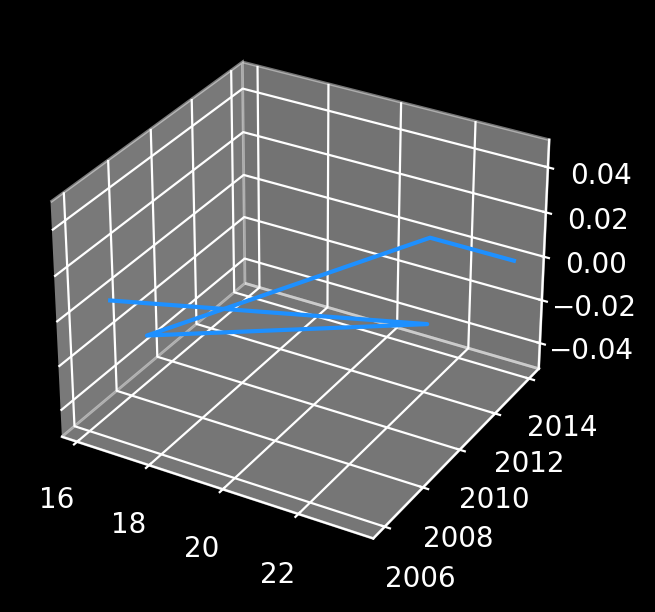

In [ ]:
x = df['mileage(kmpl)'].head()
y = df['year'].head()

z = plt.axes(projection = "3d")
z.plot(x, y, color='dodgerblue')
plt.show()

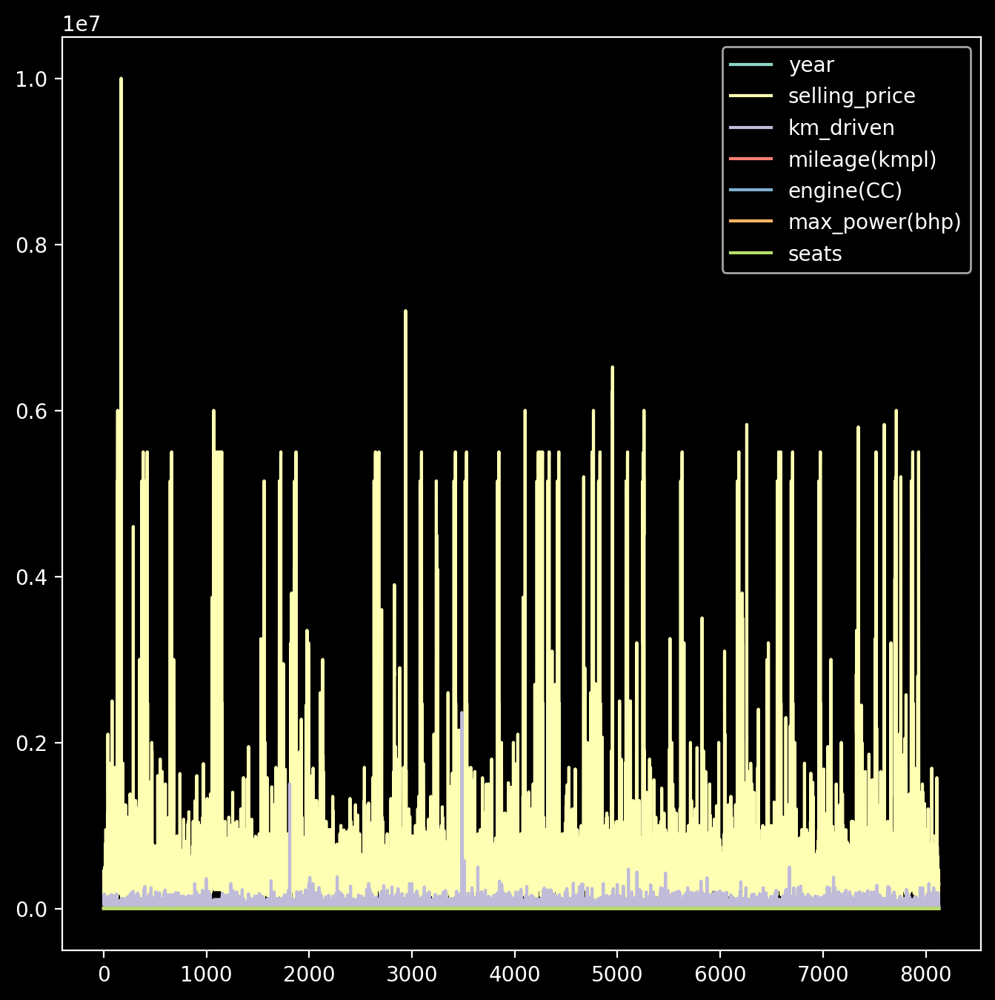

In [ ]:
df.plot(figsize=(8, 8))
plt.show()

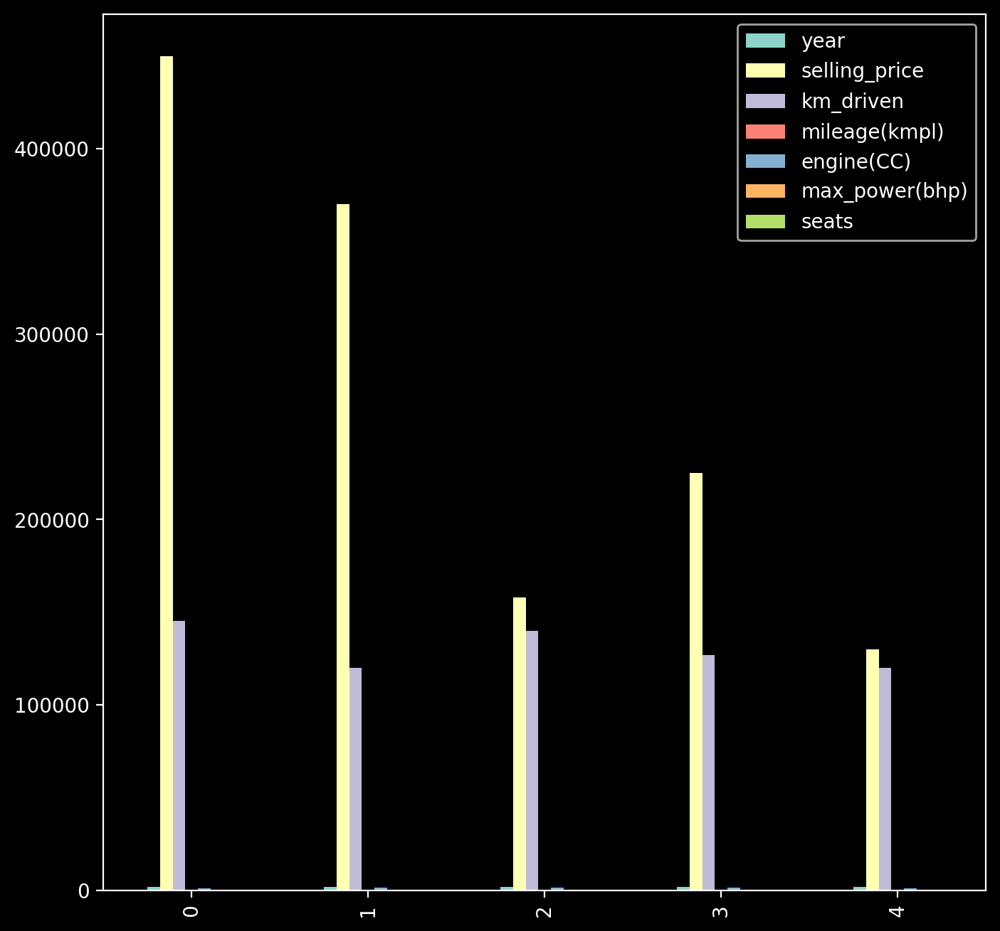

In [ ]:
df.head().plot(figsize=(8,8), kind='bar')
plt.show()

# Box Plot

In [ ]:
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.30,1248.0,73.90,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [ ]:
num_df = df[[
    'year',
    'selling_price',
    'km_driven',
    'mileage(kmpl)',
    'engine(CC)',
    'max_power(bhp)',
    'seats'
]]
num_df

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
0,2014,450000,145500,23.40,1248.0,74.00,5.0
1,2014,370000,120000,21.14,1498.0,103.52,5.0
2,2006,158000,140000,17.70,1497.0,78.00,5.0
3,2010,225000,127000,23.00,1396.0,90.00,5.0
4,2007,130000,120000,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...
8123,2013,320000,110000,18.50,1197.0,82.85,5.0
8124,2007,135000,119000,16.80,1493.0,110.00,5.0
8125,2009,382000,120000,19.30,1248.0,73.90,5.0
8126,2013,290000,25000,23.57,1396.0,70.00,5.0


In [ ]:
df.describe()

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
count,8128.000000,8.128000e+03,8.128000e+03,8128.000000,8128.00000,8128.000000,8128.000000
mean,2013.804011,6.382718e+05,6.981951e+04,19.418783,1452.89813,91.264982,5.405389
std,4.044249,8.062534e+05,5.655055e+04,3.981875,498.19672,35.376388,0.948874
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.00000,0.000000,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,16.800000,1197.00000,68.100000,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,19.418783,1248.00000,82.000000,5.000000
75%,2017.000000,6.750000e+05,9.800000e+04,22.277500,1582.00000,101.250000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.00000,400.000000,14.000000


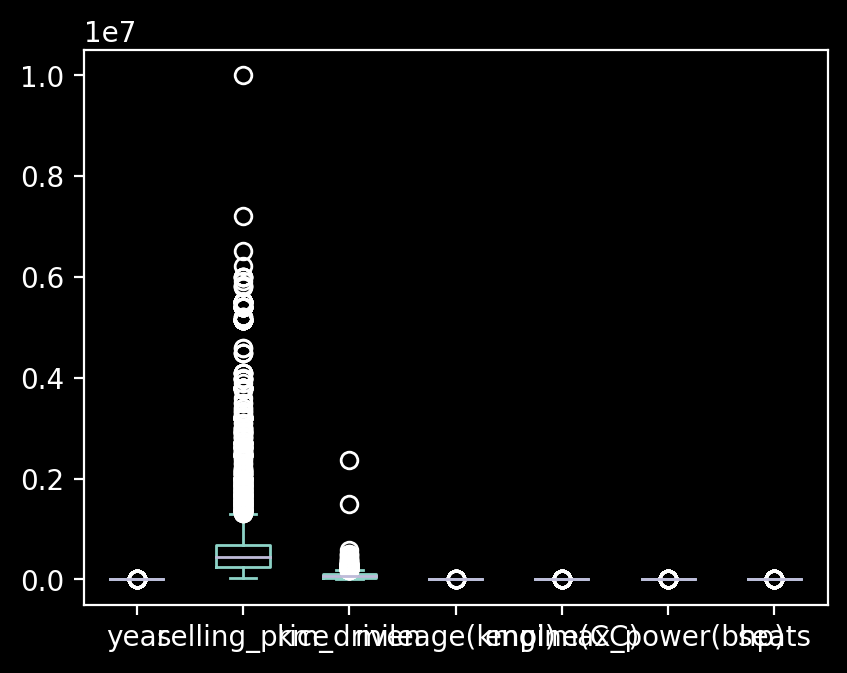

In [ ]:
df.plot.box()
plt.show()

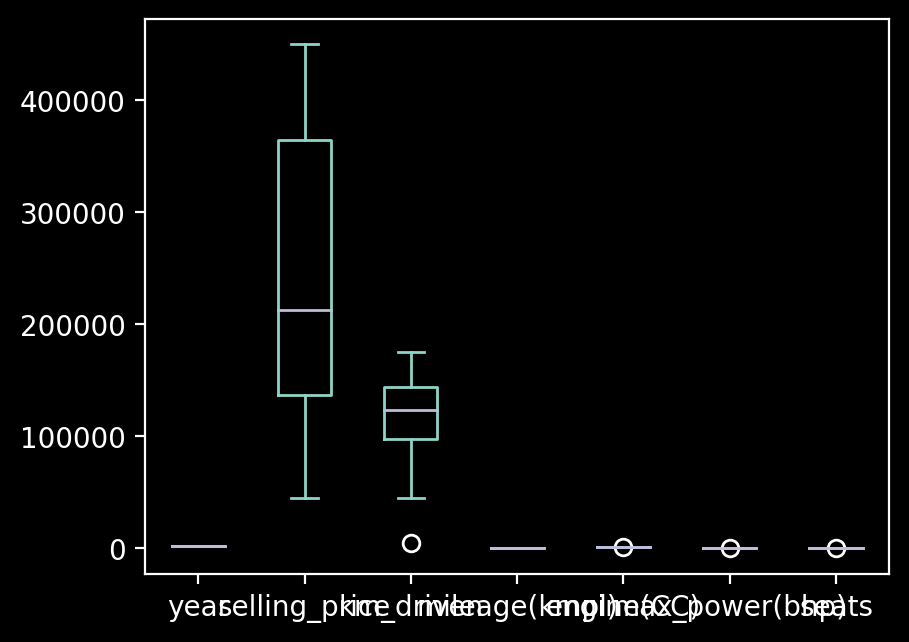

In [ ]:
df.head(10).plot.box()
plt.show()

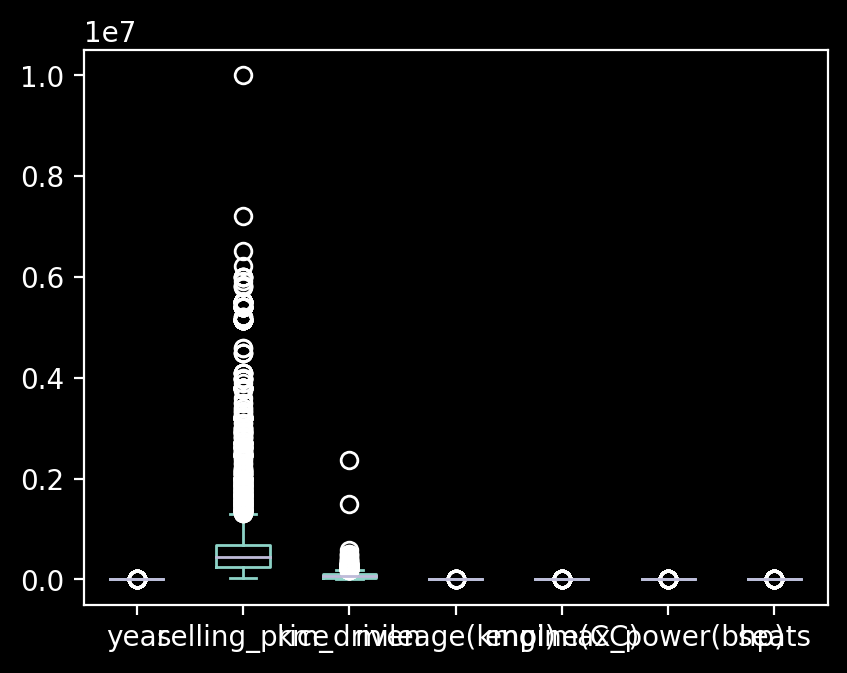

In [ ]:
num_df.plot.box()
plt.show()

In [ ]:
main_df = df[[
    'year',
    'selling_price',
    'km_driven',
    'mileage(kmpl)'
]]
main_df

,year,selling_price,km_driven,mileage(kmpl)
0,2014,450000,145500,23.40
1,2014,370000,120000,21.14
2,2006,158000,140000,17.70
3,2010,225000,127000,23.00
4,2007,130000,120000,16.10
...,...,...,...,...
8123,2013,320000,110000,18.50
8124,2007,135000,119000,16.80
8125,2009,382000,120000,19.30
8126,2013,290000,25000,23.57


In [ ]:
v_df = num_df = df[[
    'year',
    'mileage(kmpl)',
    'max_power(bhp)',
    'seats'
]]
v_df

,year,mileage(kmpl),max_power(bhp),seats
0,2014,23.40,74.00,5.0
1,2014,21.14,103.52,5.0
2,2006,17.70,78.00,5.0
3,2010,23.00,90.00,5.0
4,2007,16.10,88.20,5.0
...,...,...,...,...
8123,2013,18.50,82.85,5.0
8124,2007,16.80,110.00,5.0
8125,2009,19.30,73.90,5.0
8126,2013,23.57,70.00,5.0


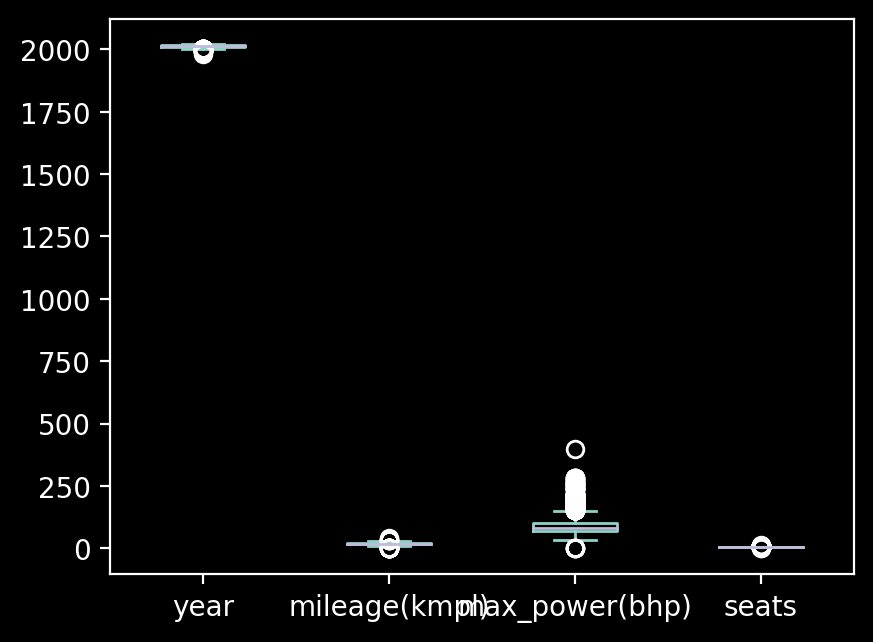

In [ ]:
v_df.plot.box()
plt.show()

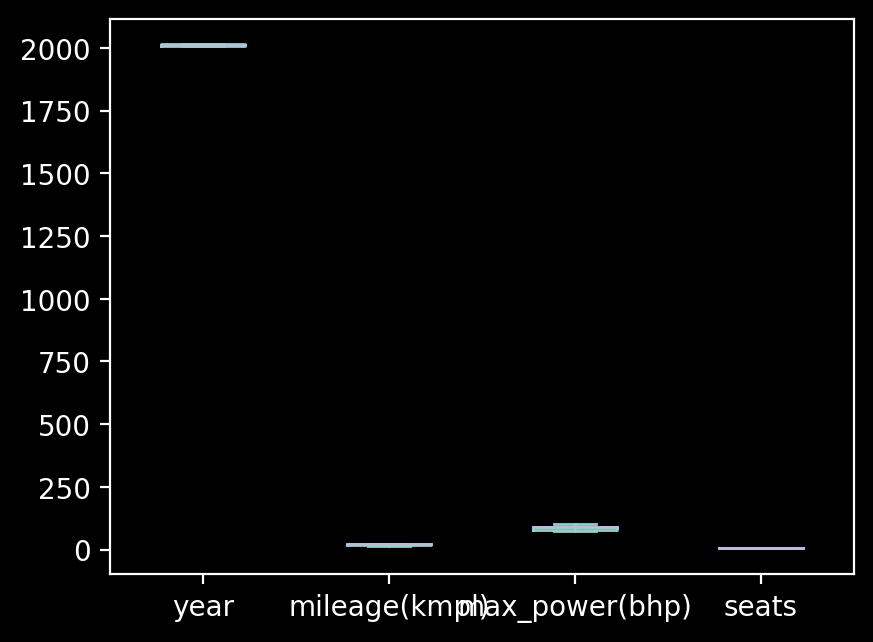

In [ ]:
v_df.head().plot.box()
plt.show()

In [ ]:
b_df = num_df = df[[
    'selling_price',
    'km_driven',
    'engine(CC)'
]]
b_df

,selling_price,km_driven,engine(CC)
0,450000,145500,1248.0
1,370000,120000,1498.0
2,158000,140000,1497.0
3,225000,127000,1396.0
4,130000,120000,1298.0
...,...,...,...
8123,320000,110000,1197.0
8124,135000,119000,1493.0
8125,382000,120000,1248.0
8126,290000,25000,1396.0


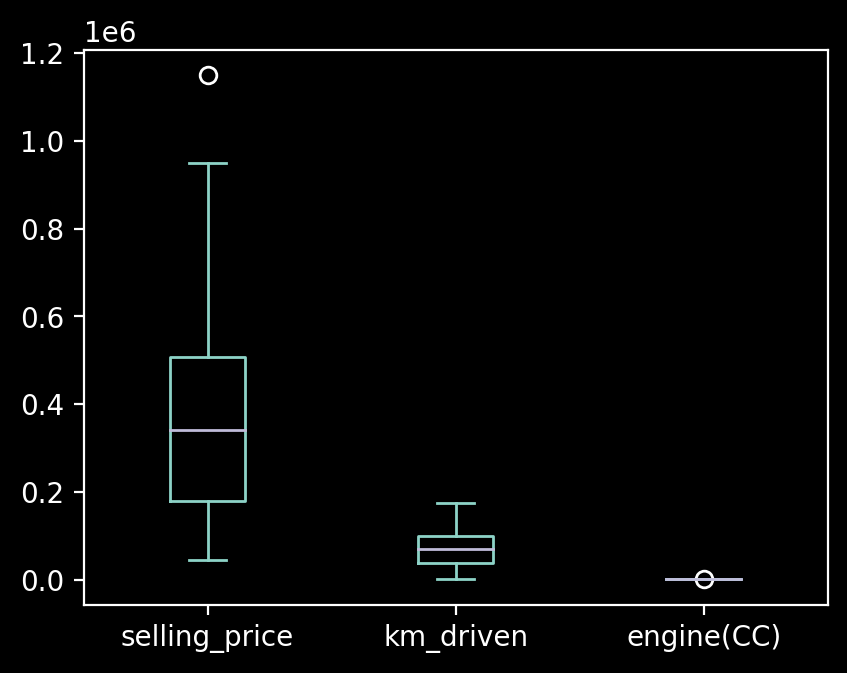

In [ ]:

b_df.head(40).plot.box()
plt.show()

In [ ]:
df.max()

name              Volvo XC90 T8 Excellence BSIV
year                                       2020
selling_price                          10000000
km_driven                               2360457
fuel                                     Petrol
seller_type                    Trustmark Dealer
transmission                             Manual
owner                               Third Owner
mileage(kmpl)                              42.0
engine(CC)                               3604.0
max_power(bhp)                            400.0
seats                                      14.0
dtype: object

# Heat Map

In [ ]:
num_df

,selling_price,km_driven,engine(CC)
0,450000,145500,1248.0
1,370000,120000,1498.0
2,158000,140000,1497.0
3,225000,127000,1396.0
4,130000,120000,1298.0
...,...,...,...
8123,320000,110000,1197.0
8124,135000,119000,1493.0
8125,382000,120000,1248.0
8126,290000,25000,1396.0


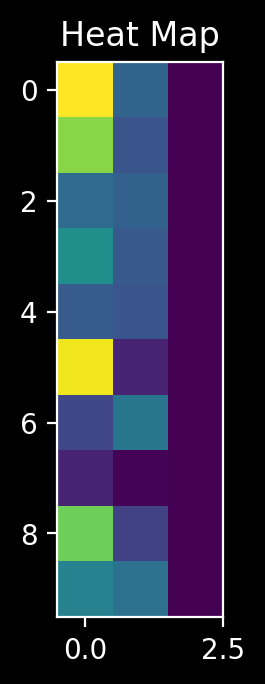

In [ ]:
plt.imshow(num_df.head(10))
plt.title('Heat Map')
plt.show()

In [ ]:
df.corr()

<ipython-input-91-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
year,1.000000,0.414092,-0.418006,0.310383,0.035851,0.224704,0.010222
selling_price,0.414092,1.000000,-0.225534,-0.125454,0.458345,0.747935,0.047135
km_driven,-0.418006,-0.225534,1.000000,-0.171426,0.198911,-0.040599,0.219860
mileage(kmpl),0.310383,-0.125454,-0.171426,1.000000,-0.574469,-0.373165,-0.450930
engine(CC),0.035851,0.458345,0.198911,-0.574469,1.000000,0.703612,0.612220
max_power(bhp),0.224704,0.747935,-0.040599,-0.373165,0.703612,1.000000,0.194556
seats,0.010222,0.047135,0.219860,-0.450930,0.612220,0.194556,1.000000


# cmap colors

**cmap(Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r')**

<ipython-input-92-88c7c8193ffd>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.imshow(df.corr(),cmap='gnuplot_r')


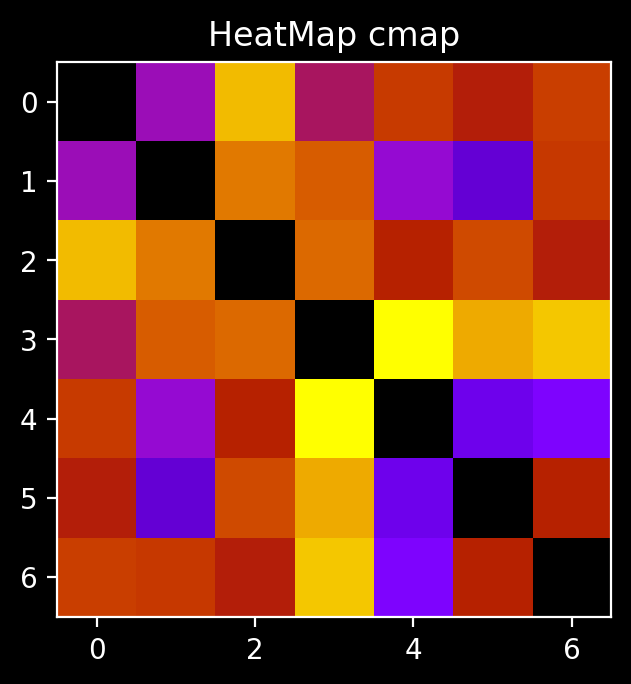

In [ ]:
plt.imshow(df.corr(),cmap='gnuplot_r')
plt.title('HeatMap cmap')
plt.show()

# Interpolation

**interpolation=antialiased', 'none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric', 'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos', 'blackman'**

<ipython-input-93-d3aacfc5c1b6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.imshow(df.corr(),


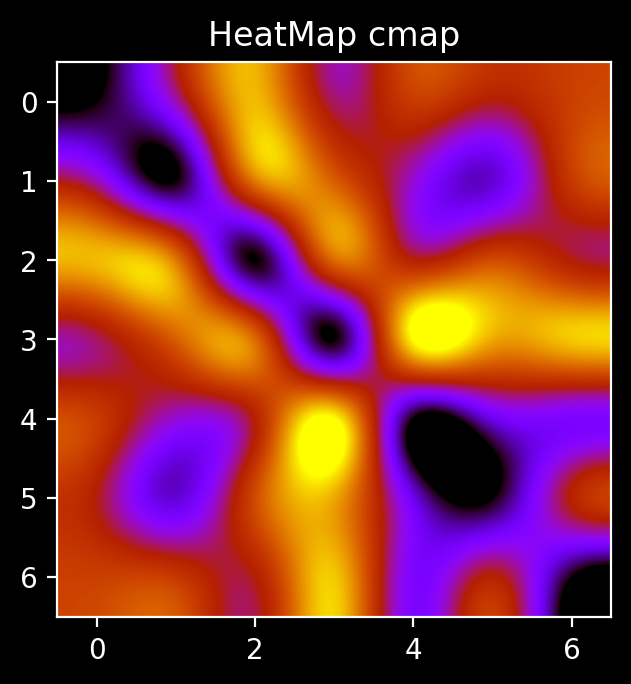

In [ ]:
plt.imshow(df.corr(),
        cmap='gnuplot_r',
        interpolation='blackman')
plt.title('HeatMap cmap')
plt.show()

# ColorBar

<ipython-input-94-557d32e91aa5>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.imshow(df.corr(),


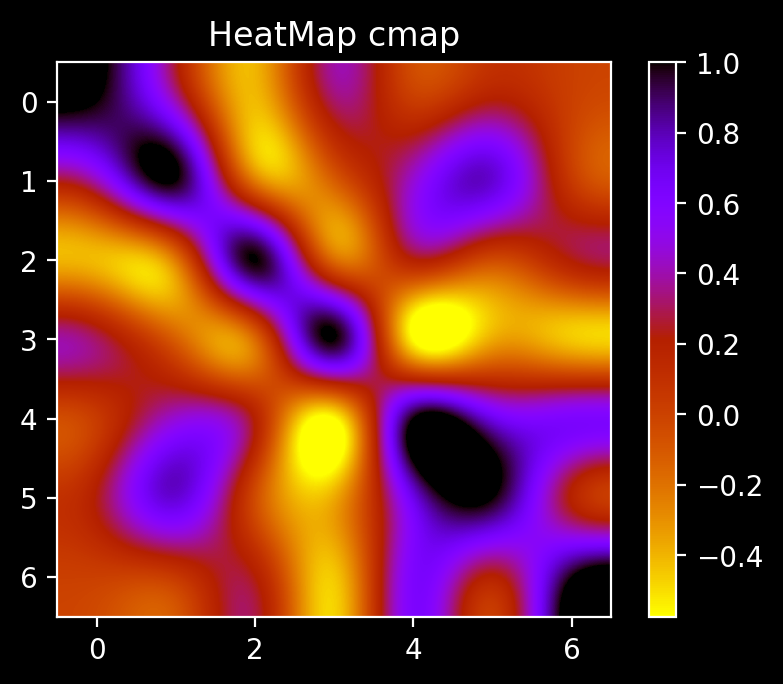

In [ ]:
plt.imshow(df.corr(),
        cmap='gnuplot_r',
        interpolation='blackman')
plt.colorbar()
plt.title('HeatMap cmap')
plt.show()

<ipython-input-95-29280ce6dc0d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.imshow(df.corr(),


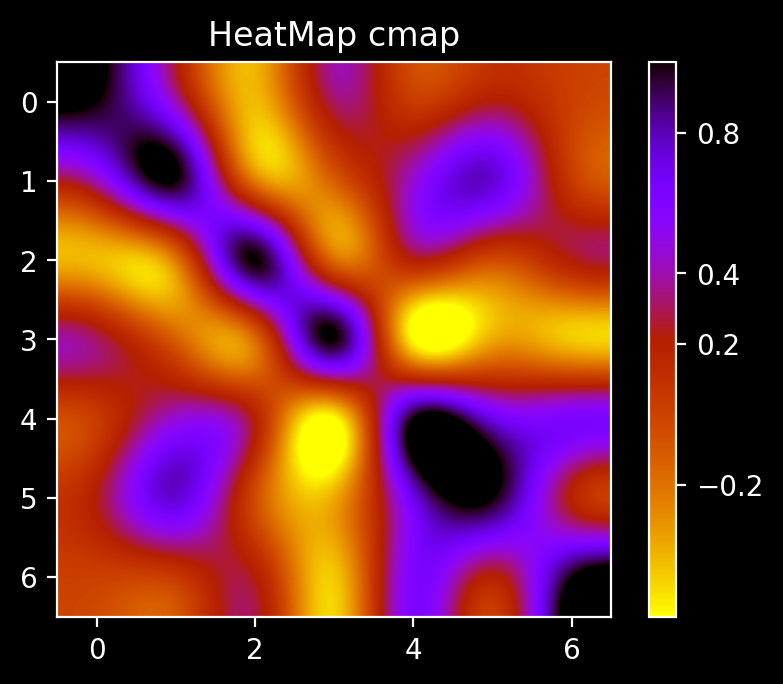

In [ ]:
plt.imshow(df.corr(),
        cmap='gnuplot_r',
        interpolation='blackman')
plt.colorbar(ticks=[-0.2,0.2,0.4,0.8])
plt.title('HeatMap cmap')
plt.show()

# Violinpolt

In [ ]:
b_df

,selling_price,km_driven,engine(CC)
0,450000,145500,1248.0
1,370000,120000,1498.0
2,158000,140000,1497.0
3,225000,127000,1396.0
4,130000,120000,1298.0
...,...,...,...
8123,320000,110000,1197.0
8124,135000,119000,1493.0
8125,382000,120000,1248.0
8126,290000,25000,1396.0


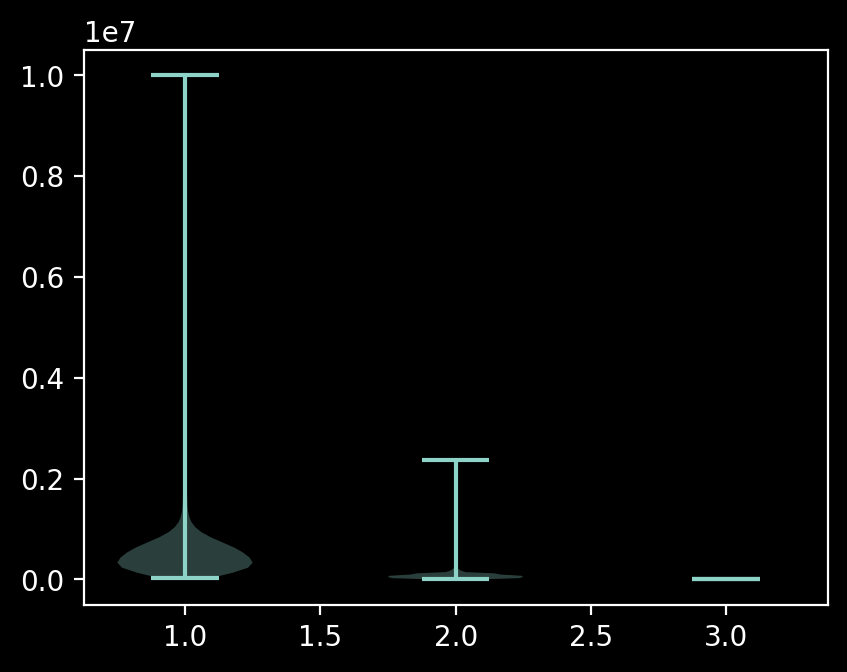

In [ ]:
plt.violinplot(b_df)
plt.show()

<ipython-input-98-38af900292f0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr().plot()


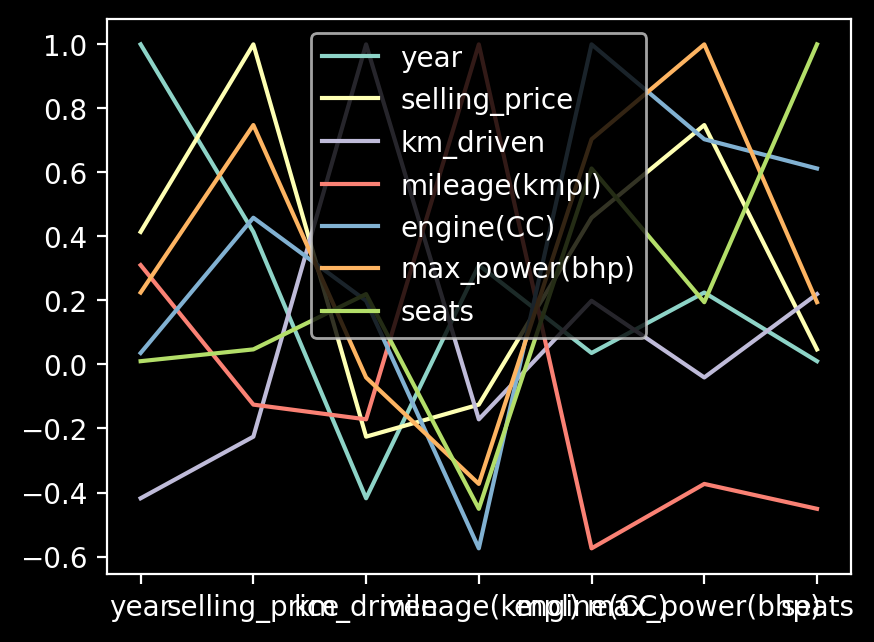

In [ ]:
df.corr().plot()
plt.show()

In [ ]:
df.describe()

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
count,8128.000000,8.128000e+03,8.128000e+03,8128.000000,8128.00000,8128.000000,8128.000000
mean,2013.804011,6.382718e+05,6.981951e+04,19.418783,1452.89813,91.264982,5.405389
std,4.044249,8.062534e+05,5.655055e+04,3.981875,498.19672,35.376388,0.948874
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.00000,0.000000,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,16.800000,1197.00000,68.100000,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,19.418783,1248.00000,82.000000,5.000000
75%,2017.000000,6.750000e+05,9.800000e+04,22.277500,1582.00000,101.250000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.00000,400.000000,14.000000


In [ ]:
df = df[df['year'] >= 2013]
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,5.0
10,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8121,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
8122,Hyundai i20 Magna 1.4 CRDi,2014,475000,80000,Diesel,Individual,Manual,Second Owner,22.54,1396.0,88.73,5.0
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


<AxesSubplot:xlabel='year', ylabel='selling_price'>

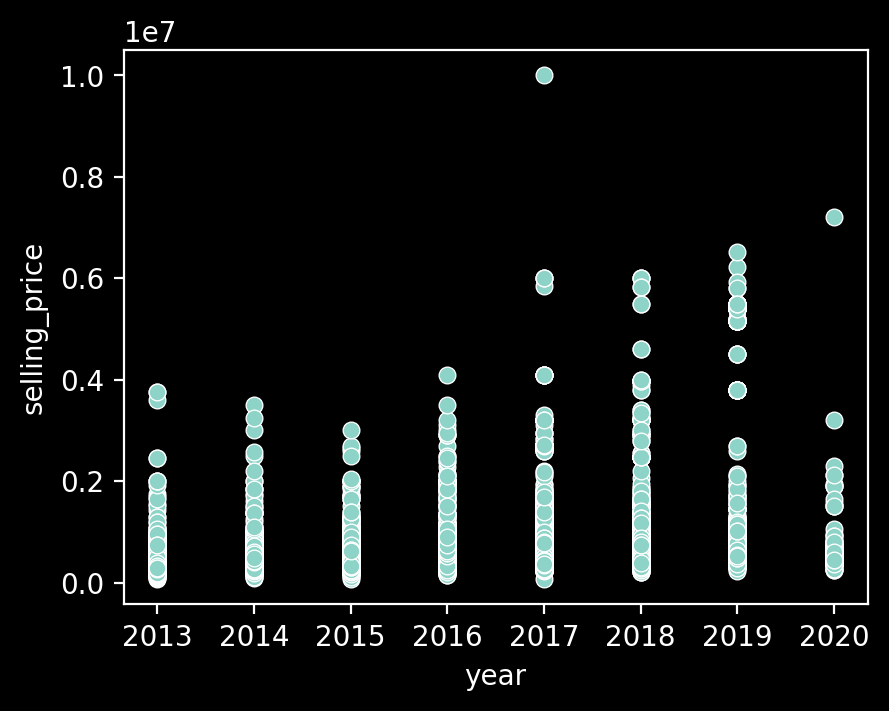

In [ ]:
sns.scatterplot(data=df,
                x='year',
                y='selling_price')

In [ ]:
df = df[df['selling_price'] <= 8000000]
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,5.0
10,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8121,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
8122,Hyundai i20 Magna 1.4 CRDi,2014,475000,80000,Diesel,Individual,Manual,Second Owner,22.54,1396.0,88.73,5.0
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [ ]:
df.describe()

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
count,5407.000000,5.407000e+03,5407.000000,5407.000000,5407.000000,5407.000000,5407.000000
mean,2016.119845,8.253366e+05,55188.360644,20.244611,1461.508970,95.400221,5.427779
std,1.918056,9.136440e+05,39480.460419,3.986360,490.317166,36.616964,0.917776
min,2013.000000,6.600000e+04,1000.000000,0.000000,624.000000,0.000000,2.000000
25%,2015.000000,4.000000e+05,25000.000000,17.400000,1197.000000,73.970000,5.000000
50%,2016.000000,5.800000e+05,50000.000000,20.450000,1248.000000,84.000000,5.000000
75%,2018.000000,7.800000e+05,77662.000000,23.020000,1499.000000,103.500000,5.000000
max,2020.000000,7.200000e+06,440000.000000,33.440000,3604.000000,282.000000,10.000000


<AxesSubplot:xlabel='year', ylabel='selling_price'>

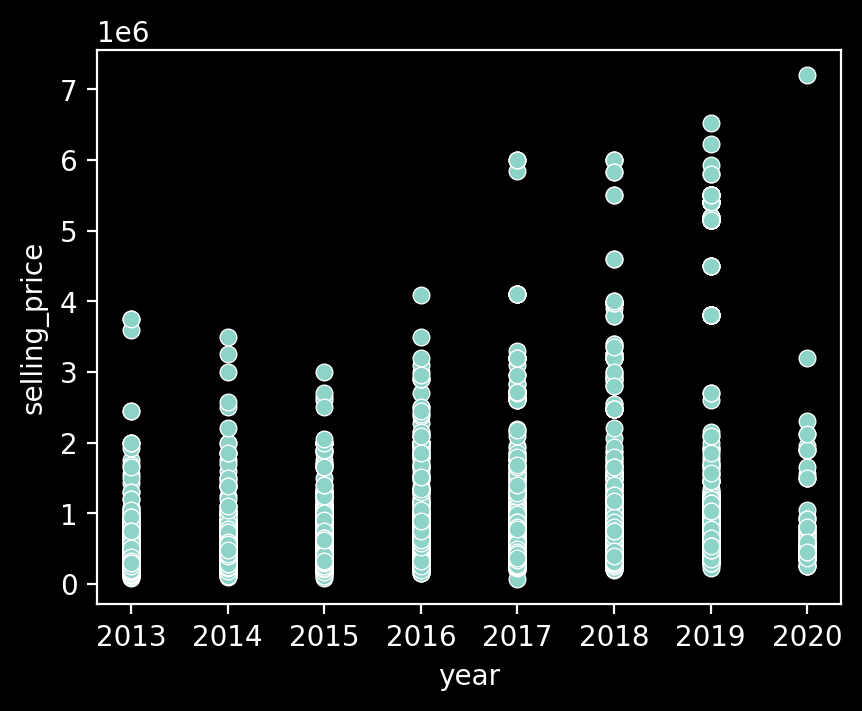

In [ ]:
sns.scatterplot(data=df,
                x='year',
                y='selling_price')

# SeaBorn

In [ ]:
from seaborn import axes_style
import seaborn.objects as so

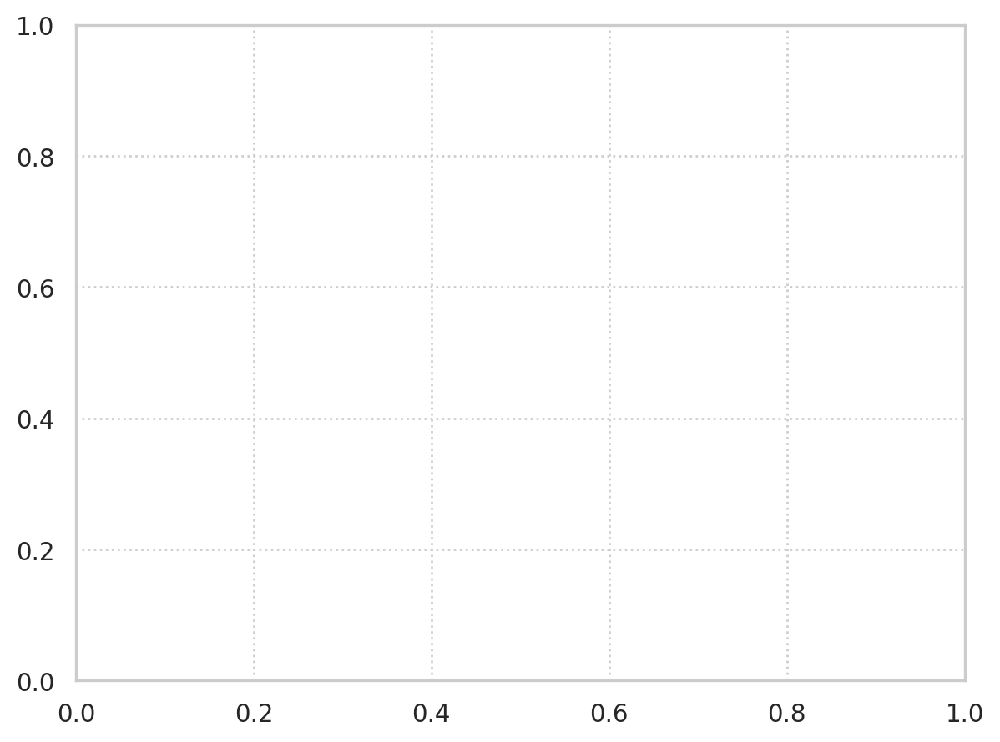

In [ ]:
theme_dict = {
       **axes_style('whitegrid'),
    "grid.linestyle": ":"
}
so.Plot().theme(theme_dict)

# ScatterPlot

In [ ]:
#white, dark, whitegrid, darkgrid, ticks
#sns.set_style(style='ticks')

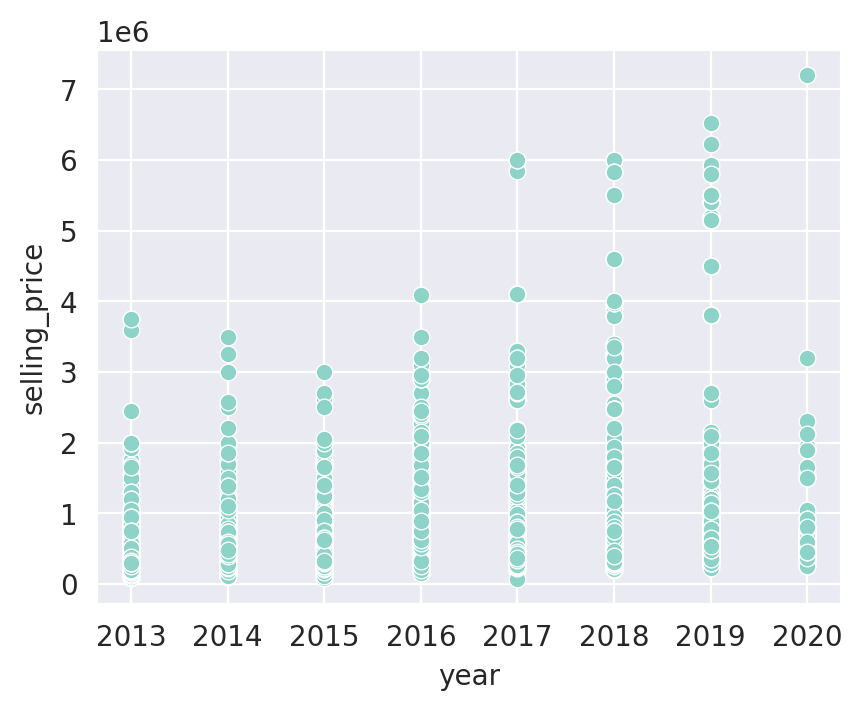

In [ ]:
sns.set_style(style='darkgrid')
sns.scatterplot(data=df,
                x='year',
                y='selling_price')
plt.show()

In [ ]:
df.describe()

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
count,5407.000000,5.407000e+03,5407.000000,5407.000000,5407.000000,5407.000000,5407.000000
mean,2016.119845,8.253366e+05,55188.360644,20.244611,1461.508970,95.400221,5.427779
std,1.918056,9.136440e+05,39480.460419,3.986360,490.317166,36.616964,0.917776
min,2013.000000,6.600000e+04,1000.000000,0.000000,624.000000,0.000000,2.000000
25%,2015.000000,4.000000e+05,25000.000000,17.400000,1197.000000,73.970000,5.000000
50%,2016.000000,5.800000e+05,50000.000000,20.450000,1248.000000,84.000000,5.000000
75%,2018.000000,7.800000e+05,77662.000000,23.020000,1499.000000,103.500000,5.000000
max,2020.000000,7.200000e+06,440000.000000,33.440000,3604.000000,282.000000,10.000000


<AxesSubplot:xlabel='year', ylabel='selling_price'>

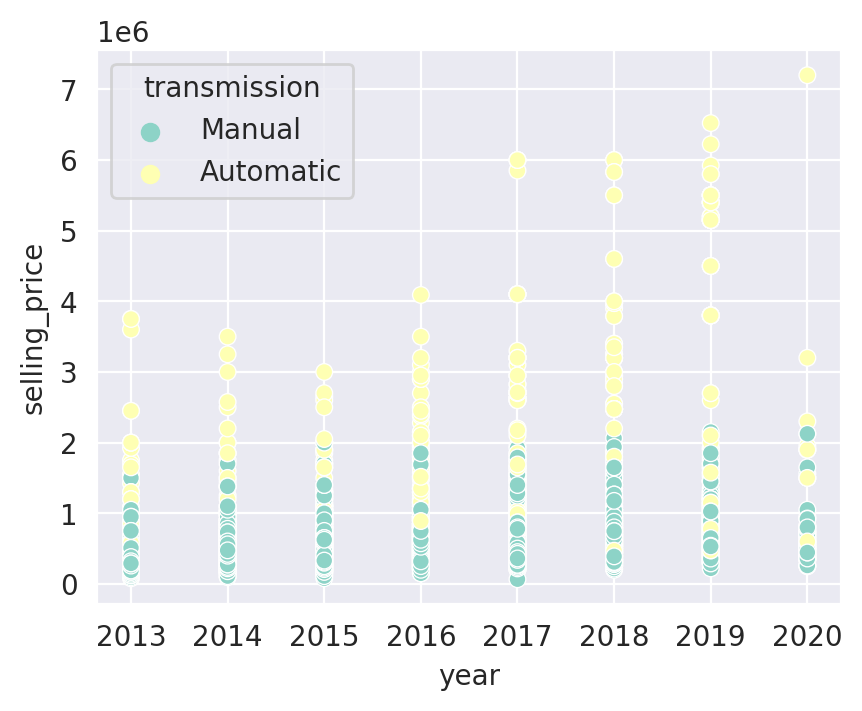

In [ ]:
sns.scatterplot(data=df,
                x='year',
                y='selling_price',
                hue='transmission')

<AxesSubplot:xlabel='selling_price', ylabel='mileage(kmpl)'>

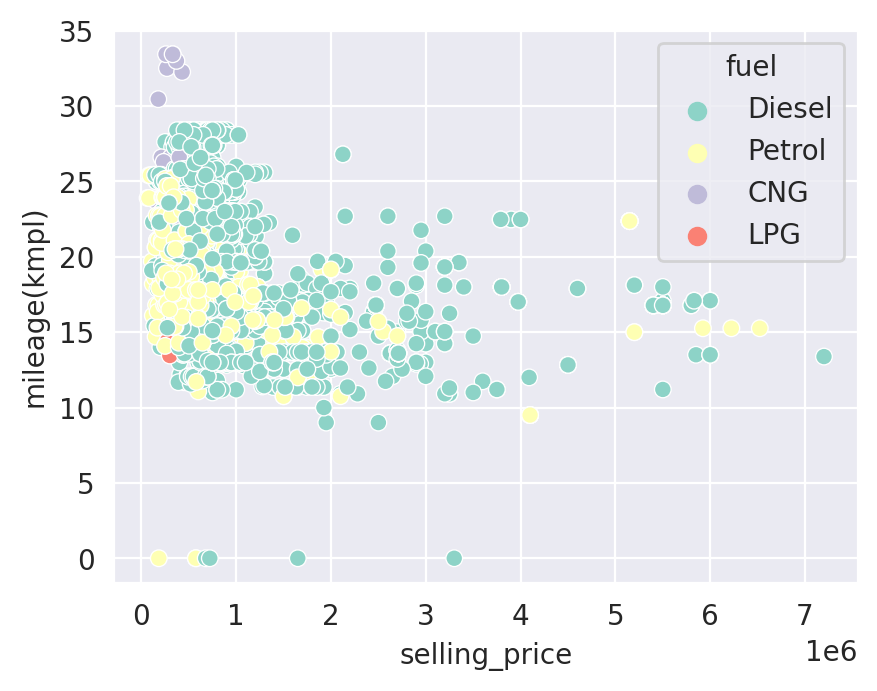

In [ ]:
sns.scatterplot(data=df,
                x="selling_price",
                y='mileage(kmpl)',
                hue='fuel')

<AxesSubplot:xlabel='km_driven', ylabel='selling_price'>

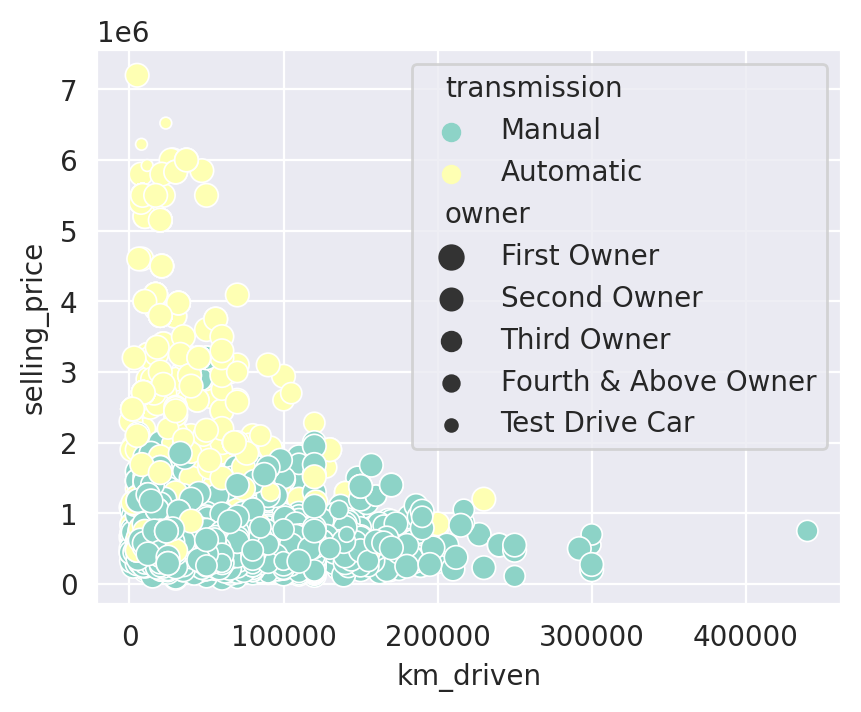

In [ ]:
sns.scatterplot(data=df,
                x='km_driven',
                y='selling_price',
                hue='transmission',
                size='owner')

<AxesSubplot:xlabel='selling_price', ylabel='mileage(kmpl)'>

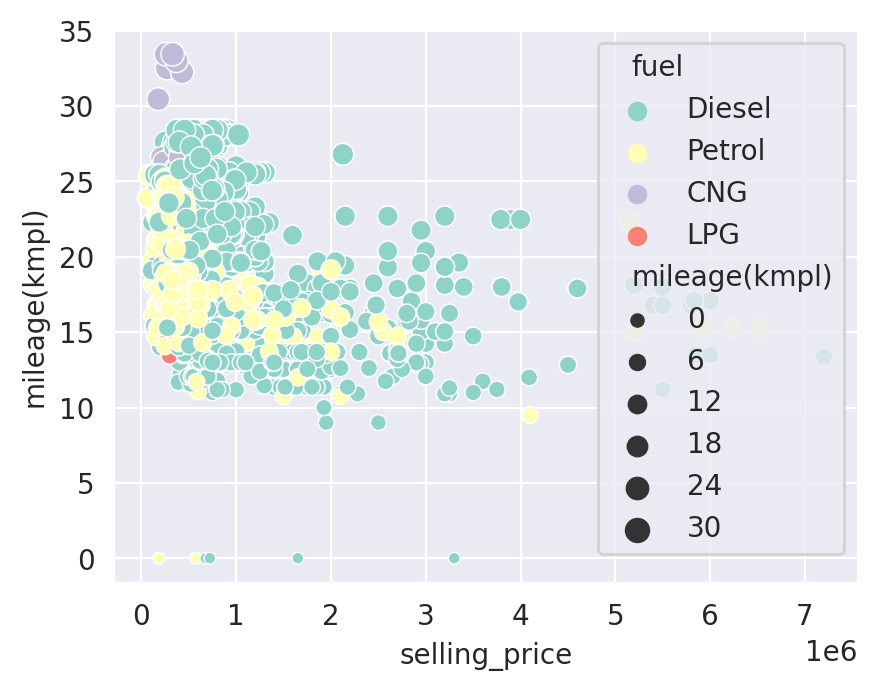

In [ ]:
sns.scatterplot(data=df,
                x="selling_price",
                y='mileage(kmpl)',
                hue='fuel',
                size='mileage(kmpl)')

<AxesSubplot:xlabel='mileage(kmpl)', ylabel='selling_price'>

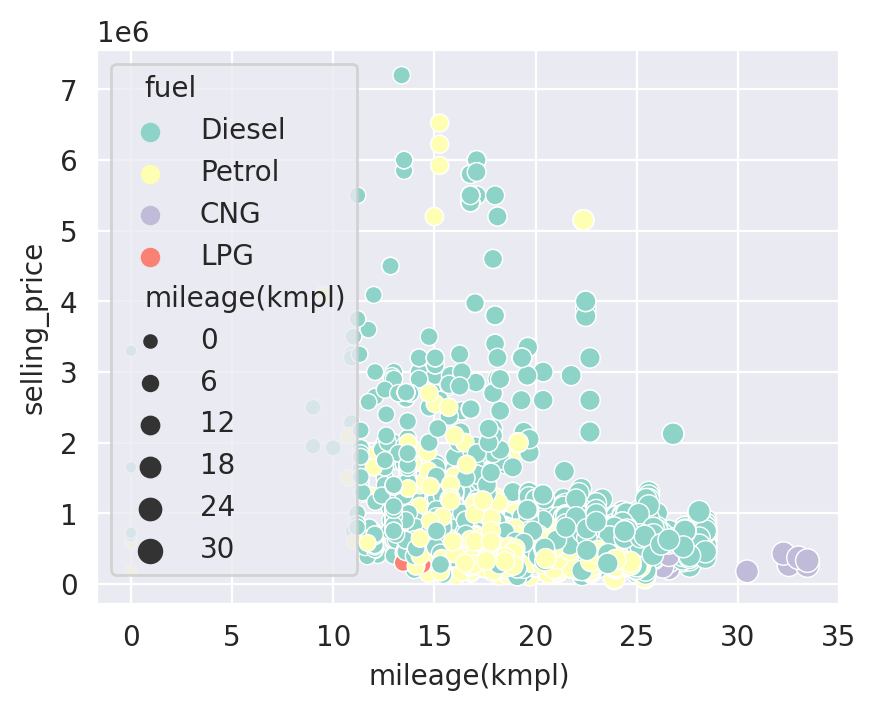

In [ ]:
sns.scatterplot(data=df,
                y="selling_price",
                x='mileage(kmpl)',
                hue='fuel',
                size='mileage(kmpl)')

<AxesSubplot:xlabel='engine(CC)', ylabel='max_power(bhp)'>

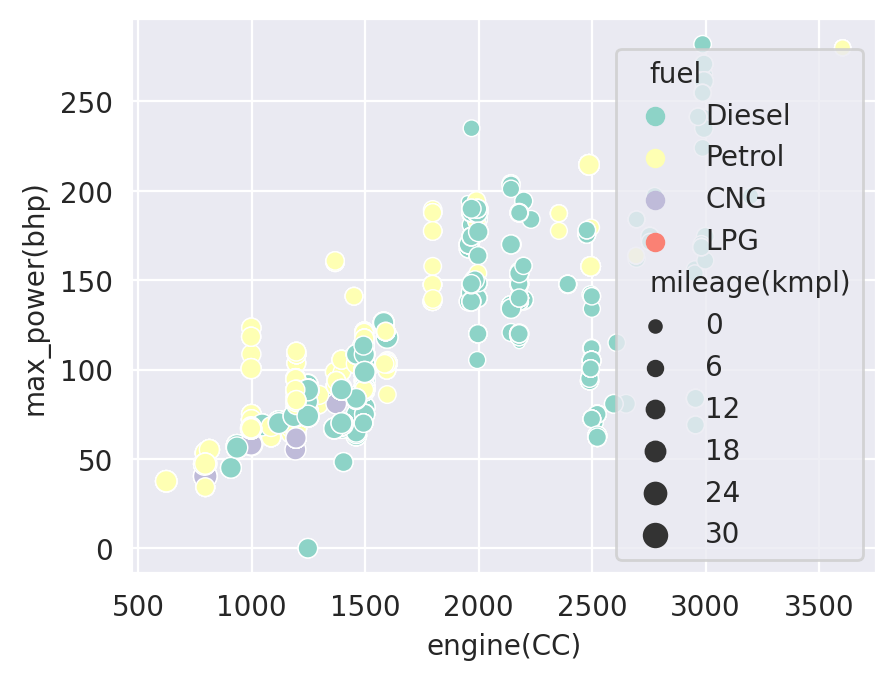

In [ ]:
sns.scatterplot(data=df,
                x='engine(CC)',
                y='max_power(bhp)',
                hue='fuel',
                size='mileage(kmpl)')

# BarPlot

barplot(data=None, *, x=None, y=None, hue=None, order=None, hue_order=None, estimator='mean', errorbar=('ci', 95), n_boot=1000, units=None, seed=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, errcolor='.26', errwidth=None, capsize=None, dodge=True, ci='deprecated', ax=None, **kwargs)

In [ ]:
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

<AxesSubplot:xlabel='fuel', ylabel='selling_price'>

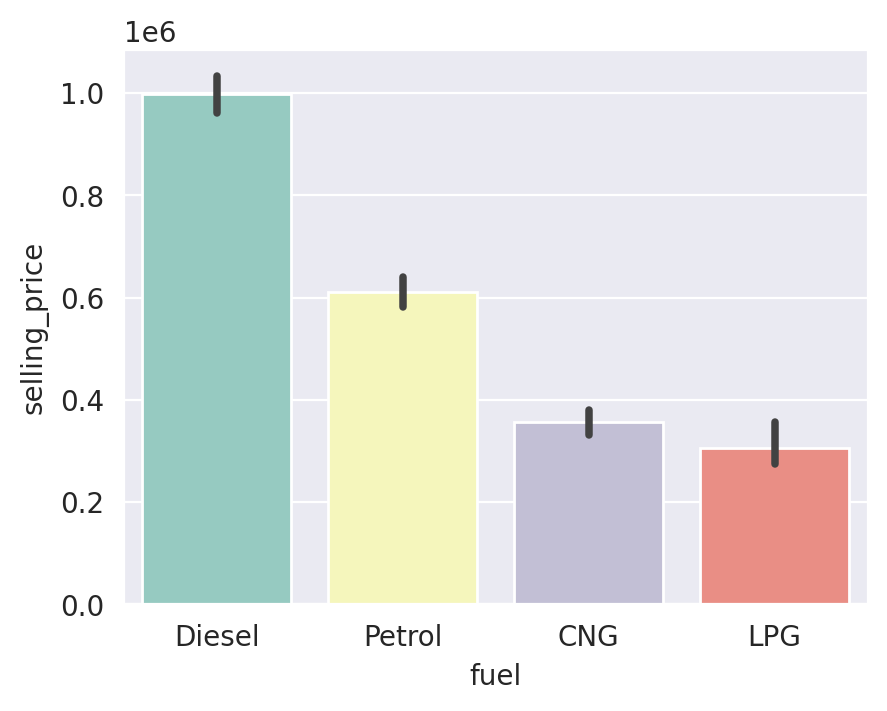

In [ ]:
sns.barplot(data=df,
            x='fuel',
            y='selling_price',)

<AxesSubplot:xlabel='fuel', ylabel='selling_price'>

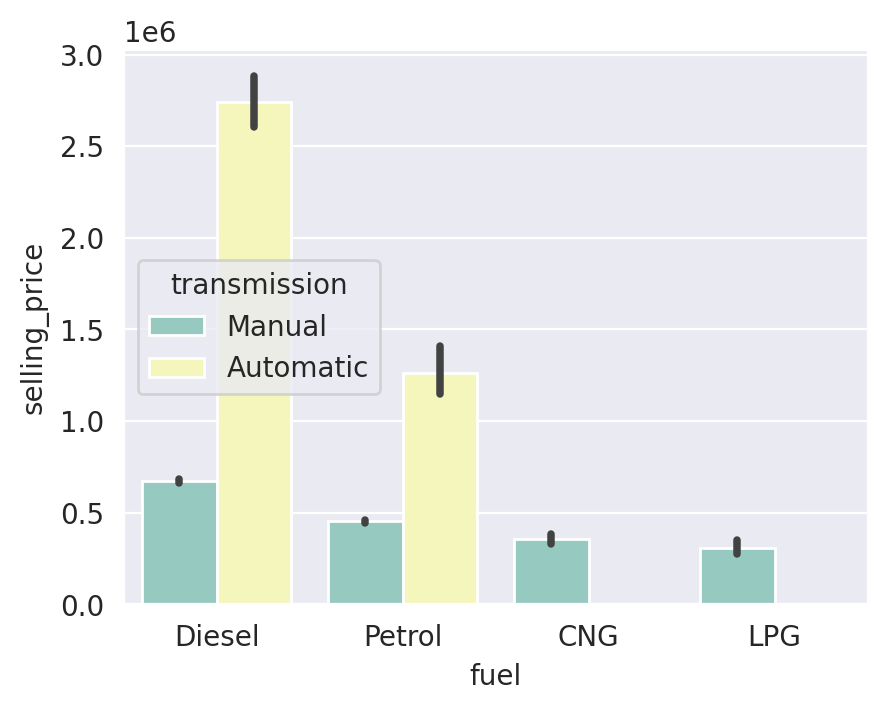

In [ ]:
sns.barplot(data=df,
            x='fuel',
            y='selling_price',
            hue='transmission')

<AxesSubplot:xlabel='fuel', ylabel='selling_price'>

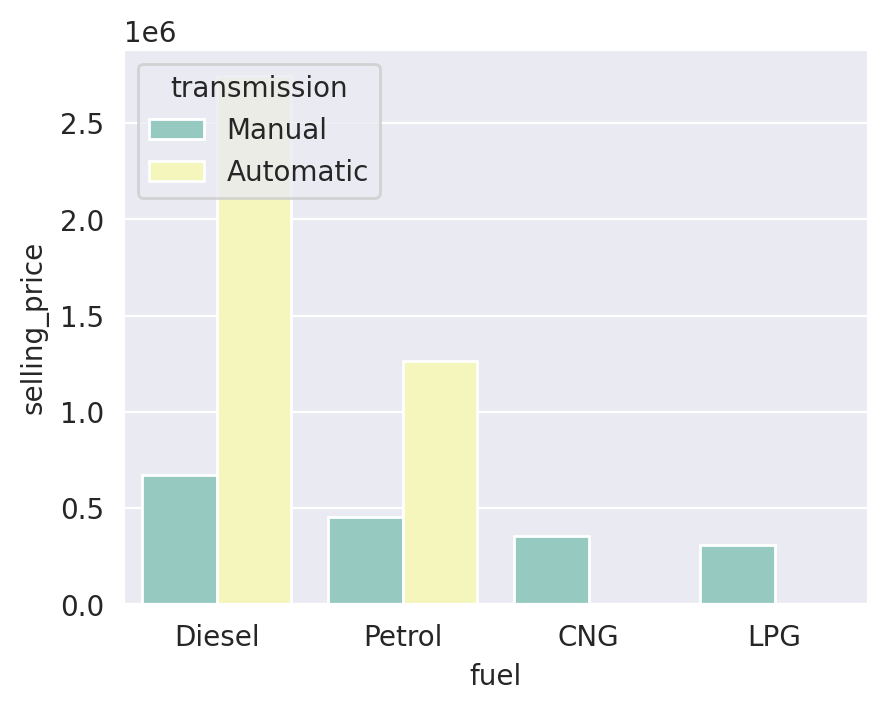

In [ ]:
sns.barplot(data=df,
            x='fuel',
            y='selling_price',
            hue='transmission',
            errorbar=None,)

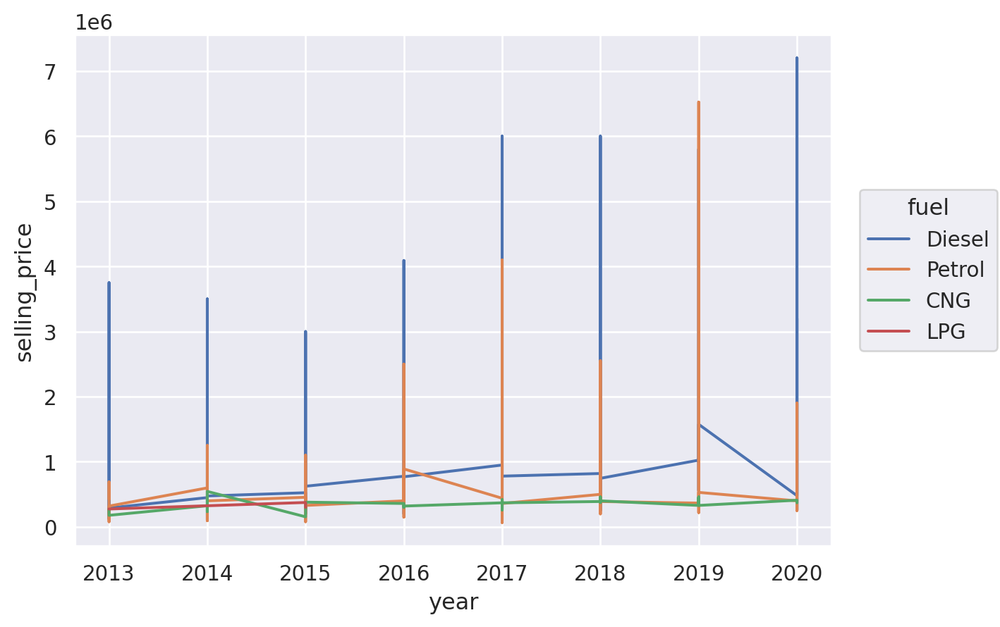

In [ ]:
so.Plot(data=df,
        x='year',
        y='selling_price',
        color='fuel').add(so.Line())

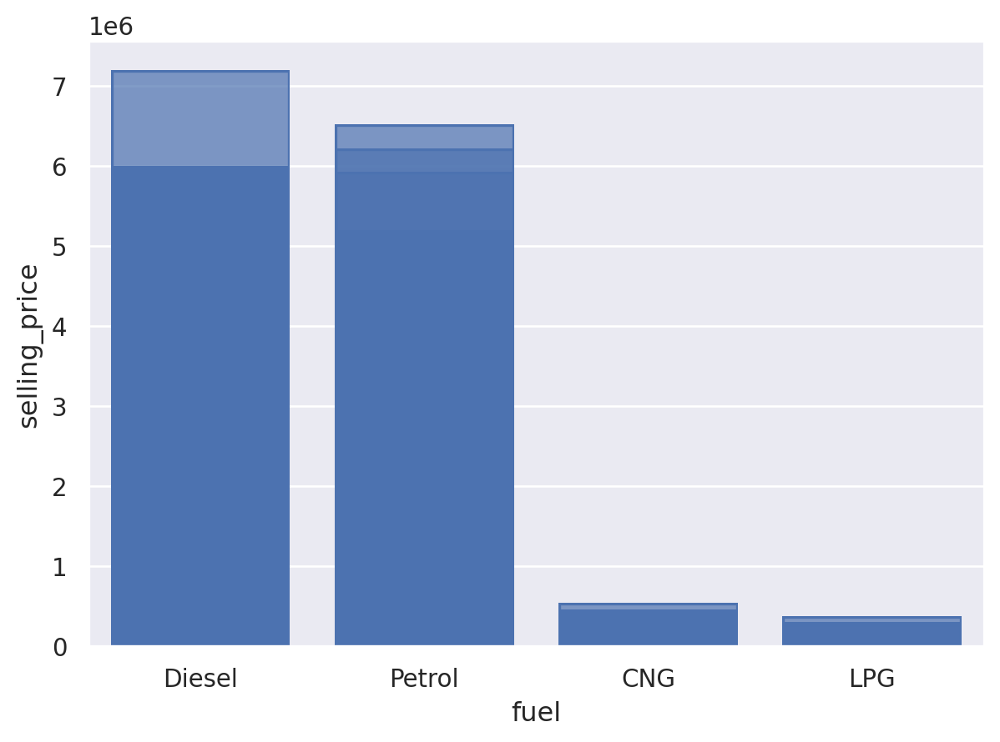

In [ ]:
so.Plot(df,
        x='fuel',
        y='selling_price').add(so.Bar())

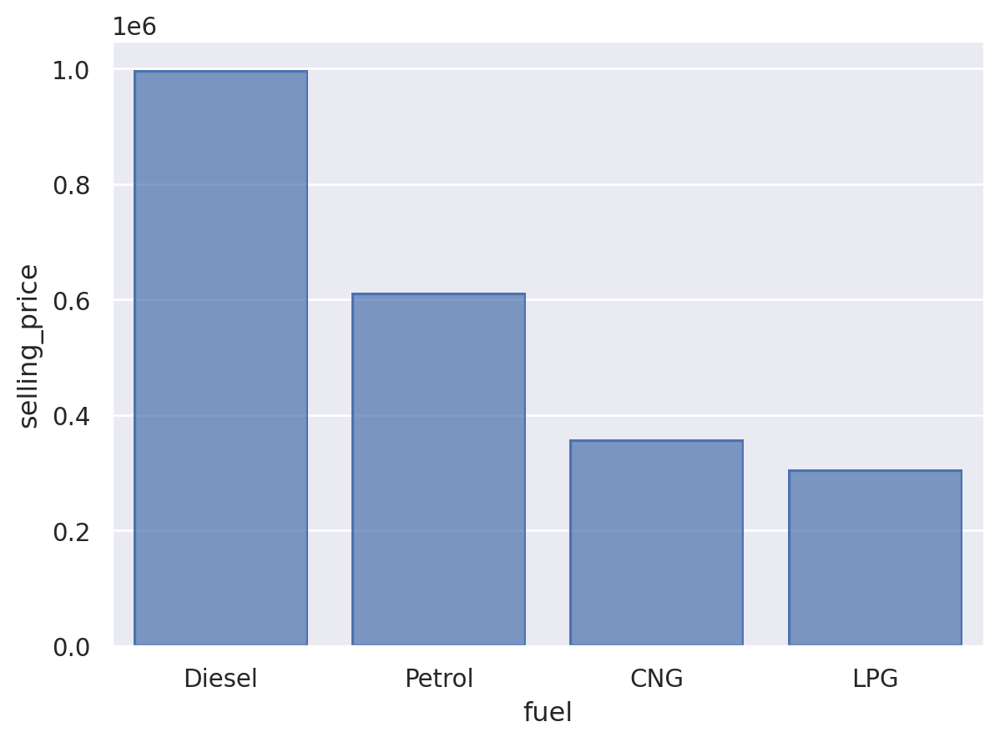

In [ ]:
so.Plot(df,
   x='fuel',
   y='selling_price',).add(so.Bar(),
                           so.Agg())

# HistPlot

<AxesSubplot:xlabel='fuel', ylabel='Count'>

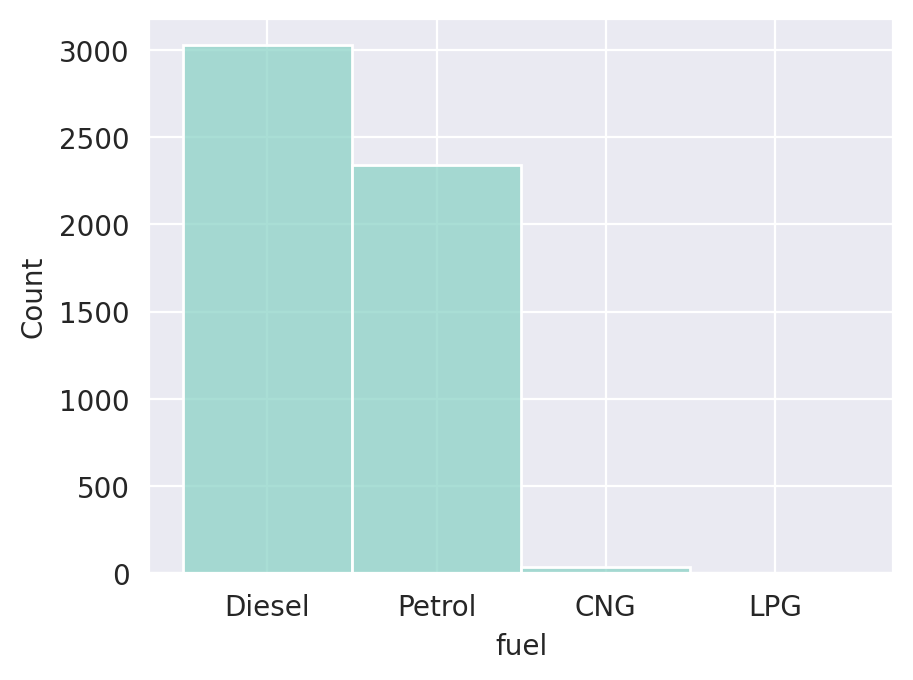

In [ ]:
sns.histplot(data=df, x='fuel')

In [ ]:
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

<AxesSubplot:xlabel='seller_type', ylabel='Count'>

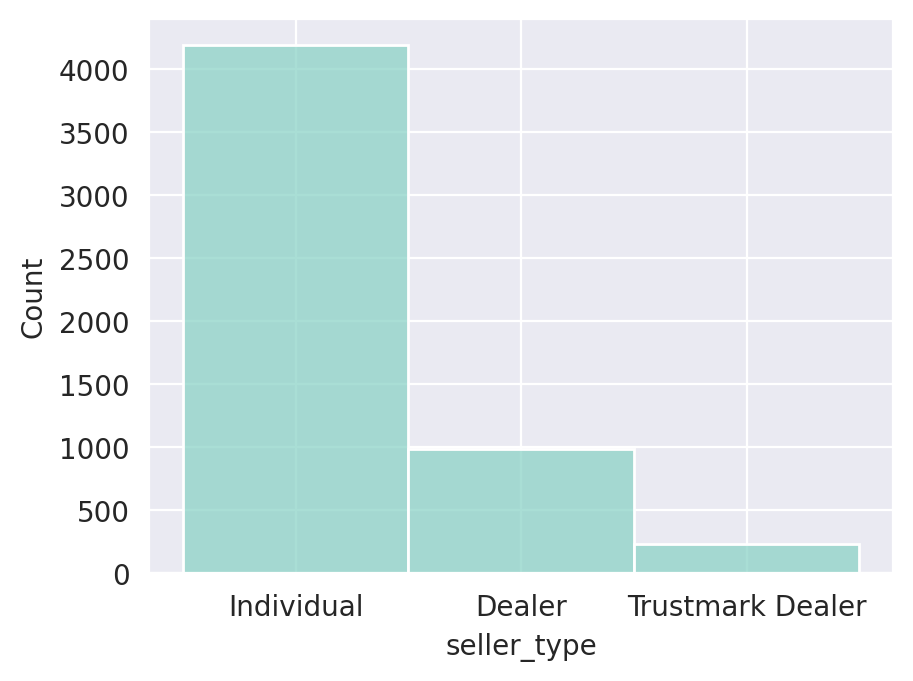

In [ ]:
sns.histplot(data=df, x='seller_type')

<AxesSubplot:xlabel='transmission', ylabel='Count'>

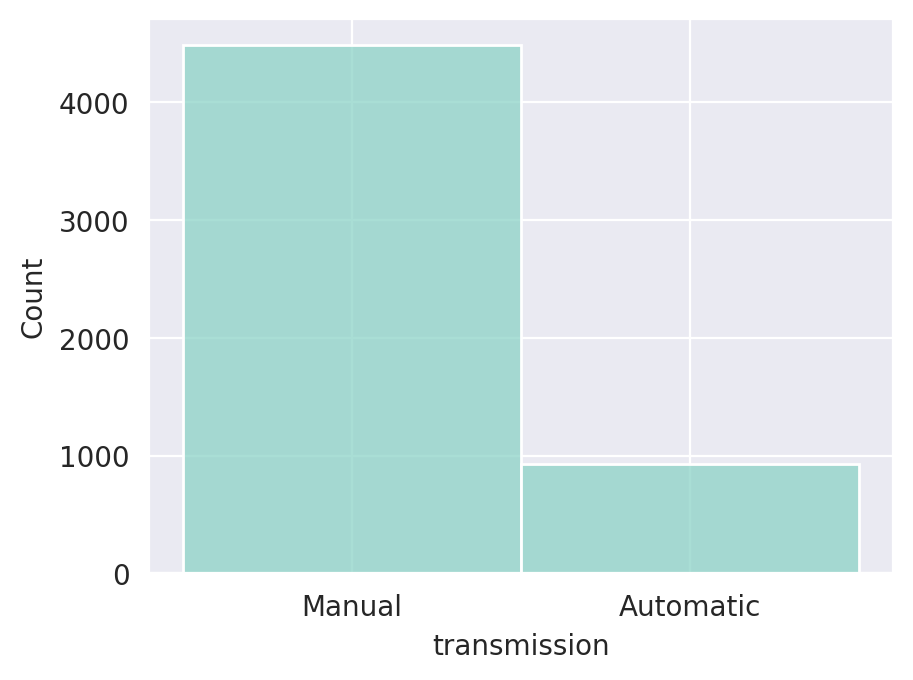

In [ ]:
sns.histplot(data=df, x='transmission')

<AxesSubplot:xlabel='owner', ylabel='Count'>

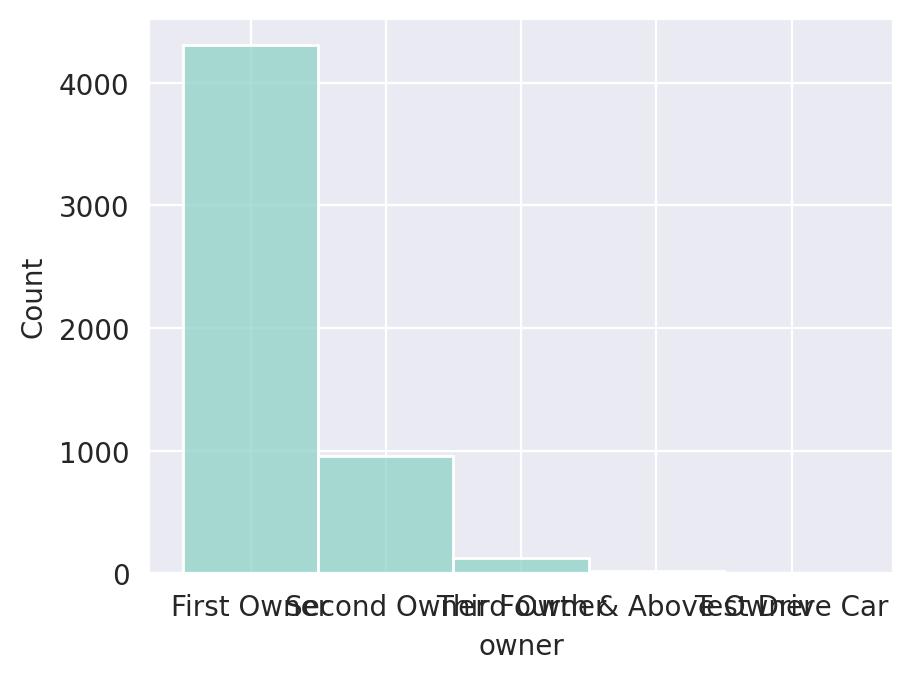

In [ ]:
sns.histplot(data=df, x="owner")

<Figure size 800x800 with 0 Axes>

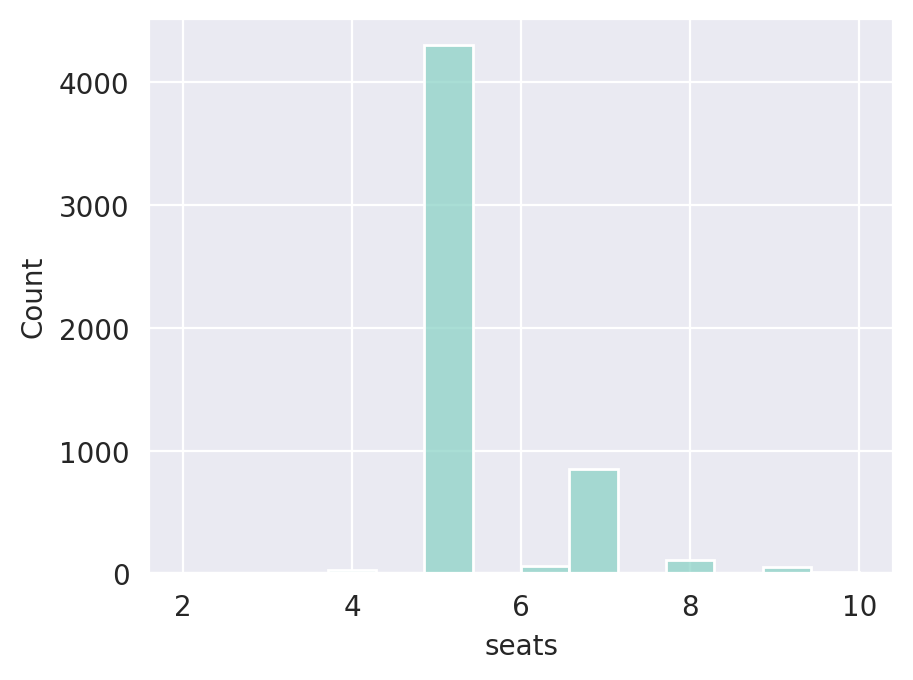

<Figure size 800x800 with 0 Axes>

In [ ]:
sns.histplot(data=df, x='seats')
plt.figure(figsize=(8, 8))

# CountPlot

<AxesSubplot:xlabel='year', ylabel='count'>

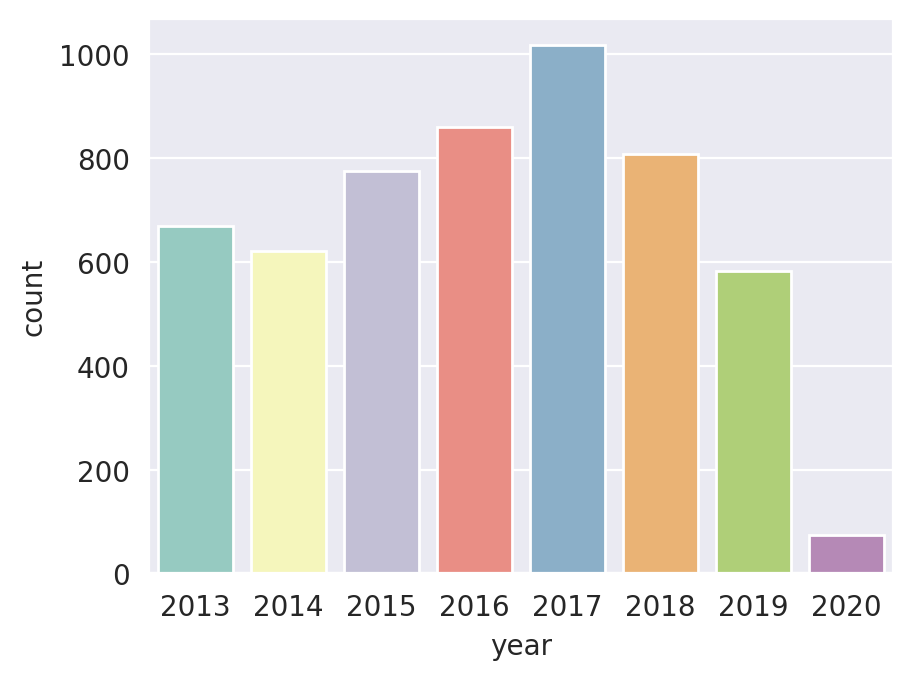

In [ ]:
sns.countplot(data=df, x='year')

<AxesSubplot:xlabel='fuel', ylabel='count'>

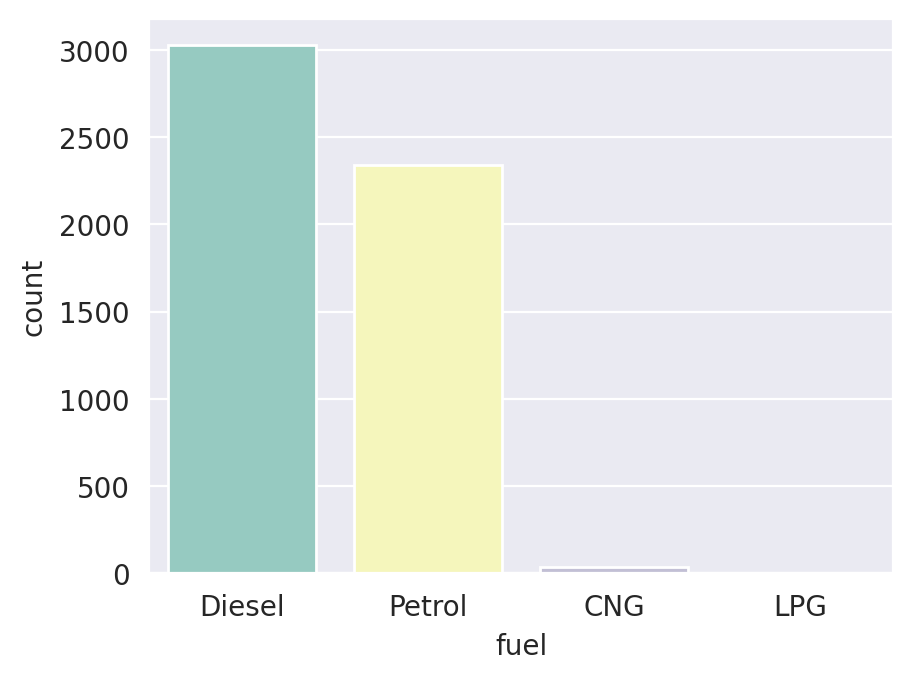

In [ ]:
sns.countplot(data=df, x='fuel')

# RelPlot

**relplot(data=None, x=None, y=None, hue=None, size=None, style=None, units=None, row=None, col=None, col_wrap=None, row_order=None, col_order=None, palette=None, hue_order=None, hue_norm=None, sizes=None, size_order=None, size_norm=None, markers=None, dashes=None, style_order=None, legend='auto', kind='scatter', height=5, aspect=1, facet_kws=None, kwargs)**
    
    This function provides access to several different axes-level functions
    that show the relationship between two variables with semantic mappings
    of subsets. The `kind` parameter selects the underlying axes-level

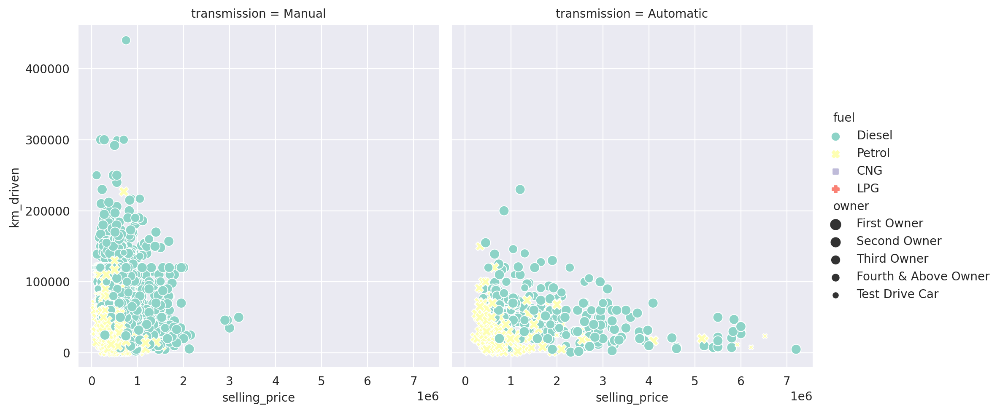

In [ ]:
sns.relplot(data=df,
            x='selling_price',
            y='km_driven',
            col='transmission',
            hue='fuel',
            style='fuel',
            size='owner')

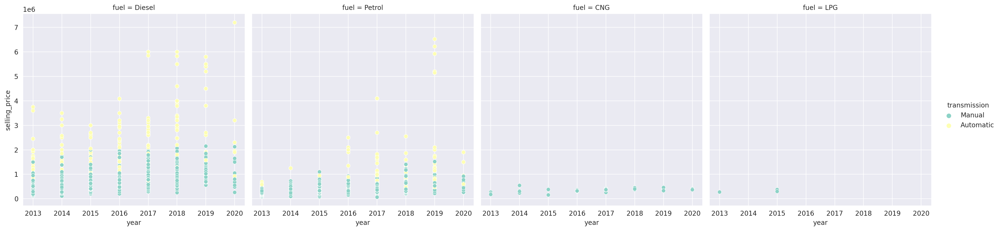

In [ ]:
sns.relplot(data=df,
            x='year',
            y='selling_price',
            hue='transmission',
            col='fuel',)

In [ ]:
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

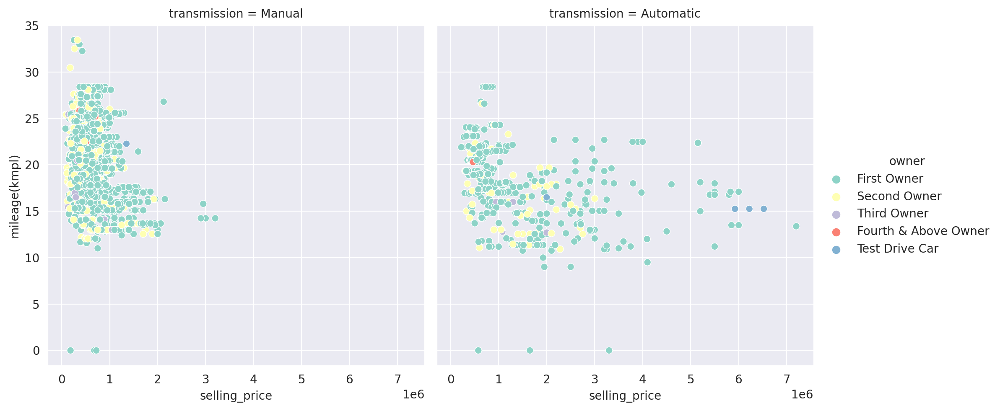

In [ ]:
sns.relplot(data=df,
            x='selling_price',
            y='mileage(kmpl)',
            hue='owner',
            col='transmission')

# BoxPlot

**boxplot(data=None, x=None, y=None, hue=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, dodge=True, fliersize=5, linewidth=None, whis=1.5, ax=None, kwargs)**
    
    
   
    Draw a box plot to show distributions with respect to categories. A box plot (or box-and-whisker plot) shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable. The box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution, except for points that are determined to be "outliers" using a method that is a function of the inter-quartile range.

In [ ]:
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage(kmpl)', 'engine(CC)',
       'max_power(bhp)', 'seats'],
      dtype='object')

In [ ]:
df.describe()

,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
count,5407.000000,5.407000e+03,5407.000000,5407.000000,5407.000000,5407.000000,5407.000000
mean,2016.119845,8.253366e+05,55188.360644,20.244611,1461.508970,95.400221,5.427779
std,1.918056,9.136440e+05,39480.460419,3.986360,490.317166,36.616964,0.917776
min,2013.000000,6.600000e+04,1000.000000,0.000000,624.000000,0.000000,2.000000
25%,2015.000000,4.000000e+05,25000.000000,17.400000,1197.000000,73.970000,5.000000
50%,2016.000000,5.800000e+05,50000.000000,20.450000,1248.000000,84.000000,5.000000
75%,2018.000000,7.800000e+05,77662.000000,23.020000,1499.000000,103.500000,5.000000
max,2020.000000,7.200000e+06,440000.000000,33.440000,3604.000000,282.000000,10.000000


<AxesSubplot:xlabel='fuel', ylabel='mileage(kmpl)'>

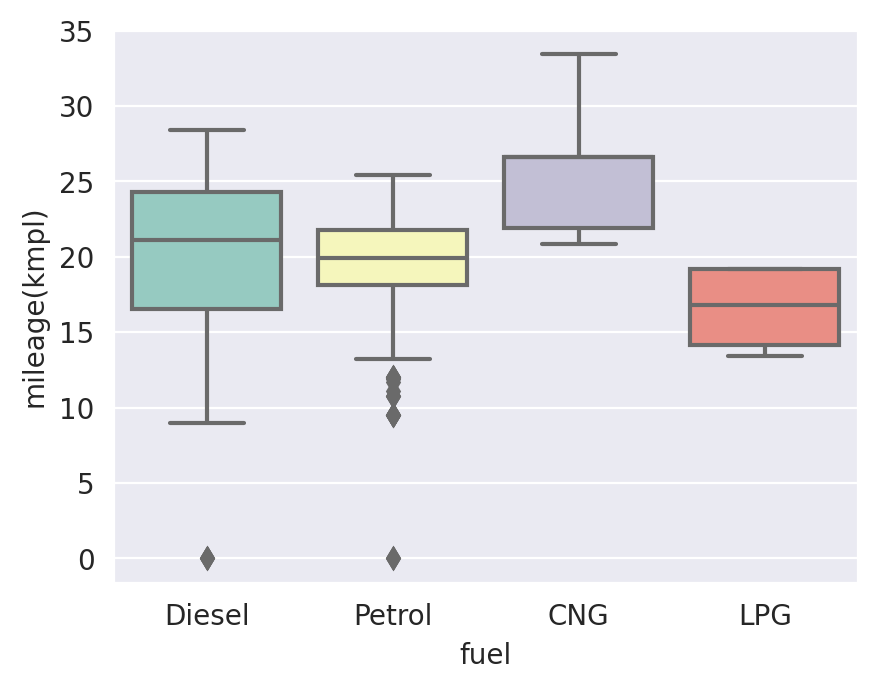

In [ ]:
sns.boxplot(data=df,
            x='fuel',
            y='mileage(kmpl)', )

<AxesSubplot:xlabel='fuel', ylabel='selling_price'>

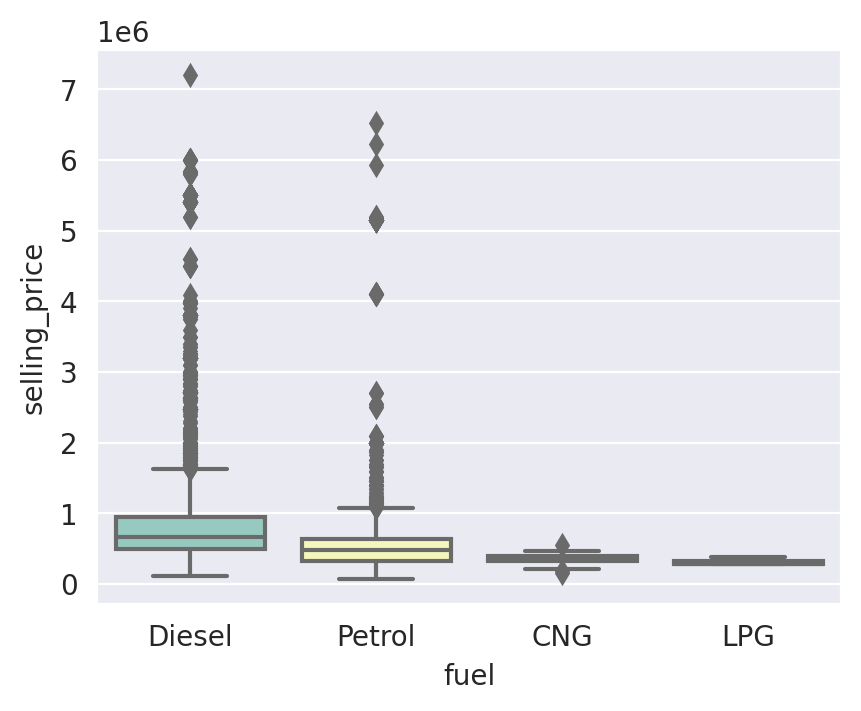

In [ ]:
sns.boxplot(data=df,
            x='fuel',
            y='selling_price',)

<AxesSubplot:xlabel='seller_type', ylabel='selling_price'>

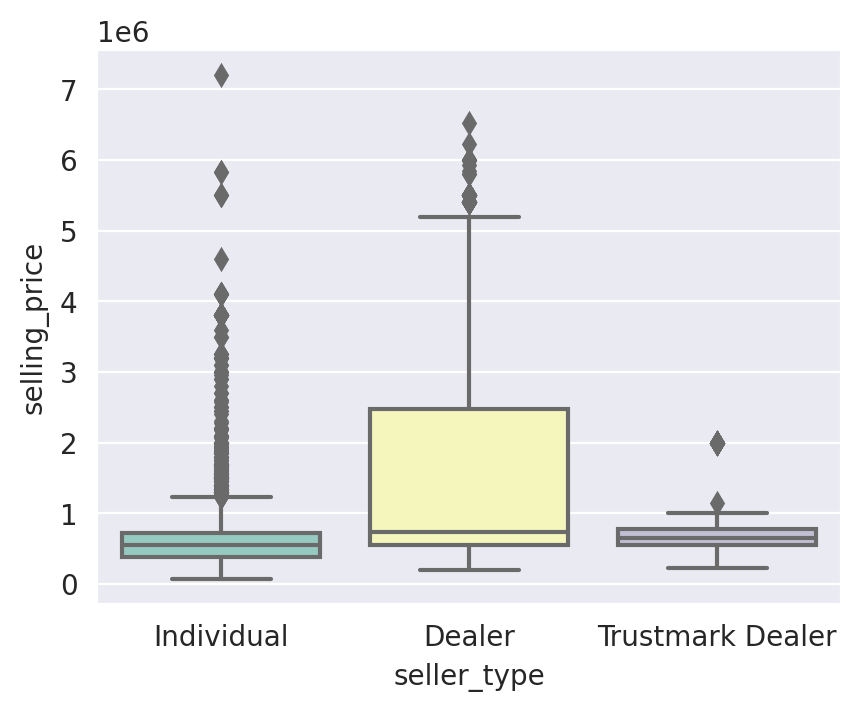

In [ ]:
sns.boxplot(data=df,
            x='seller_type',
            y='selling_price', )

<AxesSubplot:xlabel='seller_type', ylabel='selling_price'>

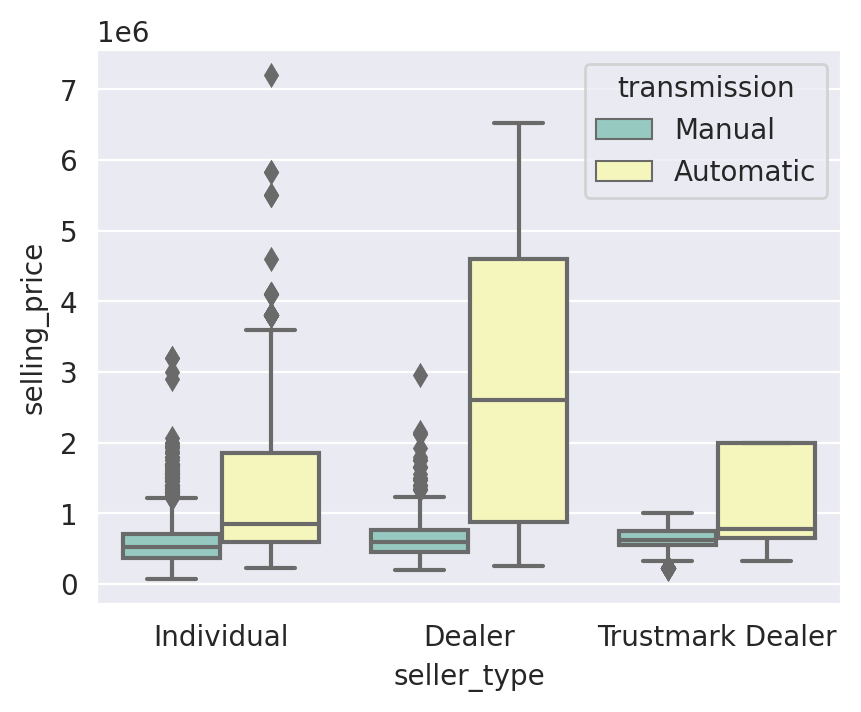

In [ ]:
sns.boxplot(data=df,
            x='seller_type',
            y='selling_price',
            hue='transmission')

# ViolinPlot

**violinplot(data=None, x=None, y=None, hue=None, order=None, hue_order=None, bw='scott', cut=2, scale='area', scale_hue=True, gridsize=100, width=0.8, inner='box', split=False, dodge=True, orient=None, linewidth=None, color=None, palette=None, saturation=0.75, ax=None, kwargs)**
    
    
    
    
    Draw a combination of boxplot and kernel density estimate.  
    A violin plot plays a similar role as a box and whisker plot. It shows the distribution of quantitative data across several levels of one (or more) categorical variables such that those distributions can be compared. Unlike a box plot, in which all of the plot components correspond to actual datapoints, the violin plot features a kernel density estimation of the underlying distribution.
    This can be an effective and attractive way to show multiple distributions of data at once, but keep in mind that the estimation procedure is influenced by the sample size, and violins for relatively small samples might look misleadingly smooth.
    
    Note: This function always treats one of the variables as categorical and draws data at ordinal positions (0, 1, ... n) on the relevant axis, even when the data has a numeric or date type.

<AxesSubplot:xlabel='fuel', ylabel='mileage(kmpl)'>

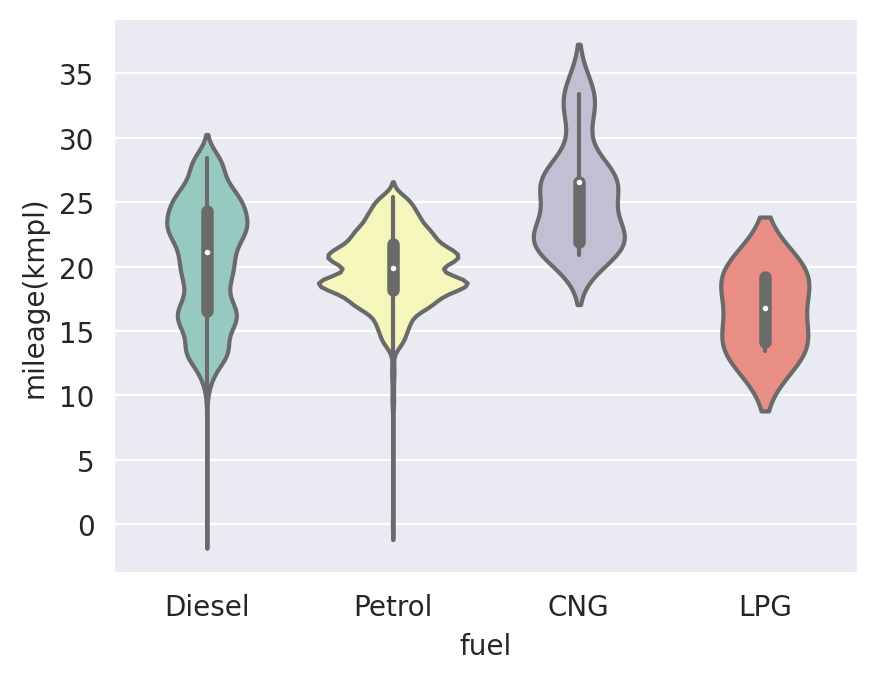

In [ ]:
sns.violinplot(data=df,
               x='fuel',
               y='mileage(kmpl)',)

<AxesSubplot:xlabel='fuel', ylabel='mileage(kmpl)'>

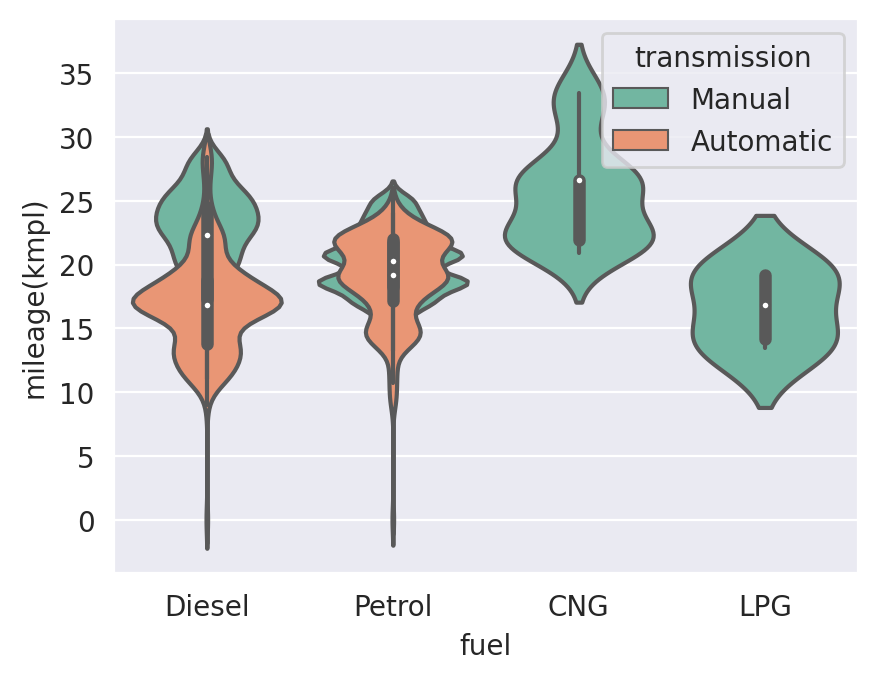

In [ ]:
sns.violinplot(data=df,
               x='fuel',
               y='mileage(kmpl)',
               hue='transmission',
               palette='Set2',
               dodge=False)

<AxesSubplot:xlabel='fuel', ylabel='mileage(kmpl)'>

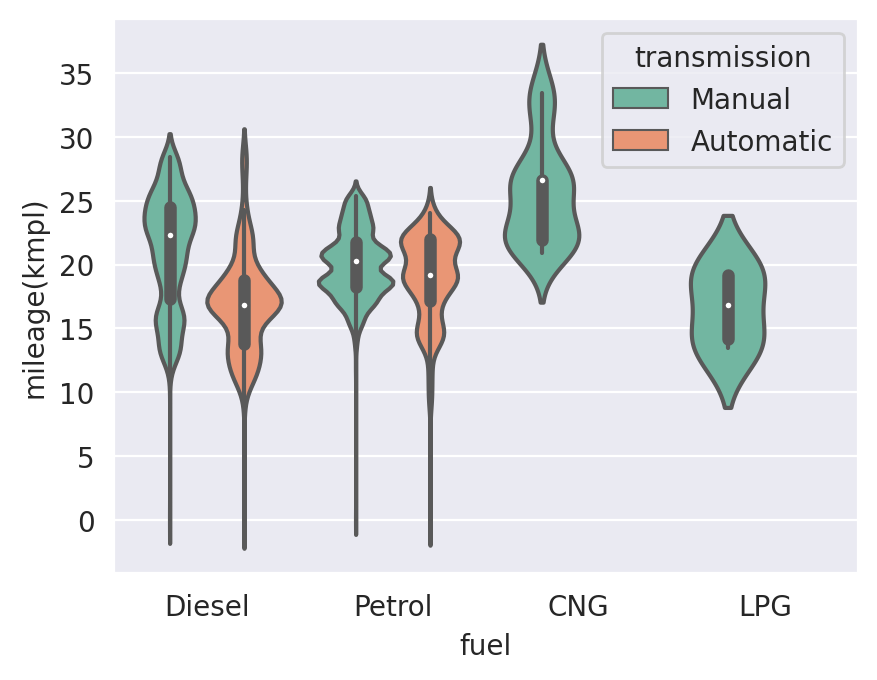

In [ ]:
sns.violinplot(data=df,
               x='fuel',
               y='mileage(kmpl)',
               hue='transmission',
               palette='Set2',
               dodge=True)

# RegPlot

**regplot(data=None, x=None, y=None, x_estimator=None, x_bins=None, x_ci='ci', scatter=True, fit_reg=True, ci=95, n_boot=1000, units=None, seed=None, order=1, logistic=False, lowess=False, robust=False, logx=False, x_partial=None, y_partial=None, truncate=True, dropna=True, x_jitter=None, y_jitter=None, label=None, color=None, marker='o', scatter_kws=None, line_kws=None, ax=None)**
    
    Plot data and a linear regression model fit. There are a number of mutually exclusive options for estimating the regression model.

<AxesSubplot:xlabel='selling_price', ylabel='km_driven'>

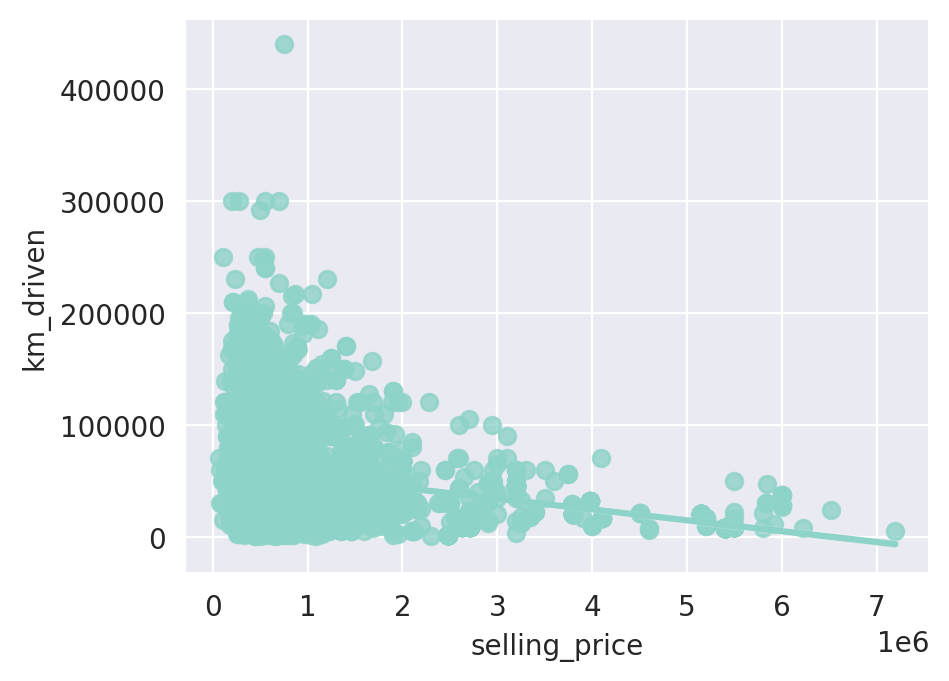

In [ ]:
sns.regplot(data=df,
            x='selling_price',
            y='km_driven', )

<AxesSubplot:xlabel='engine(CC)', ylabel='selling_price'>

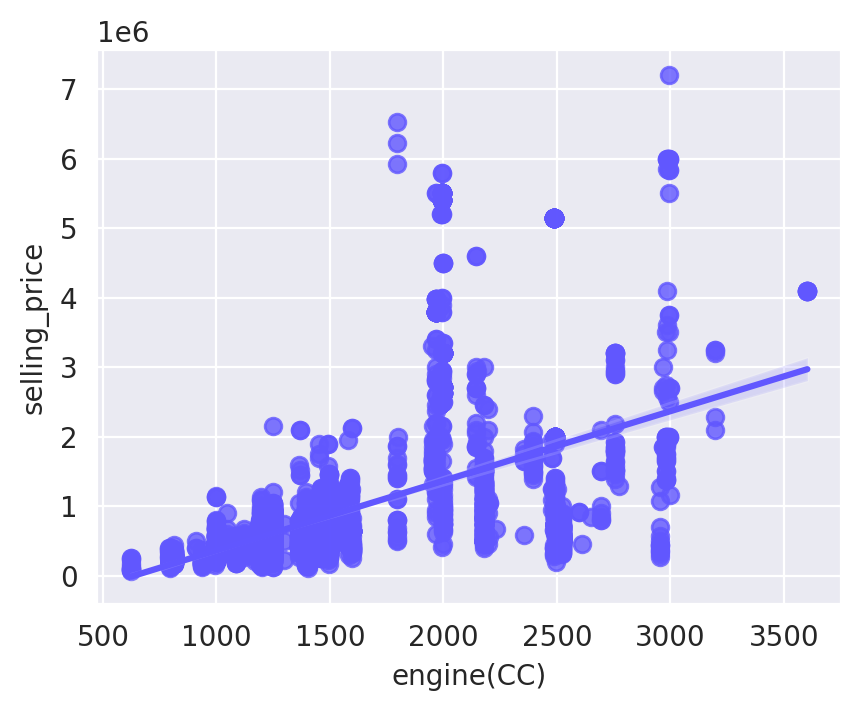

In [ ]:
sns.regplot(data=df,
            x='engine(CC)',
            y='selling_price',
            color='#6157FF')

<AxesSubplot:xlabel='engine(CC)', ylabel='max_power(bhp)'>

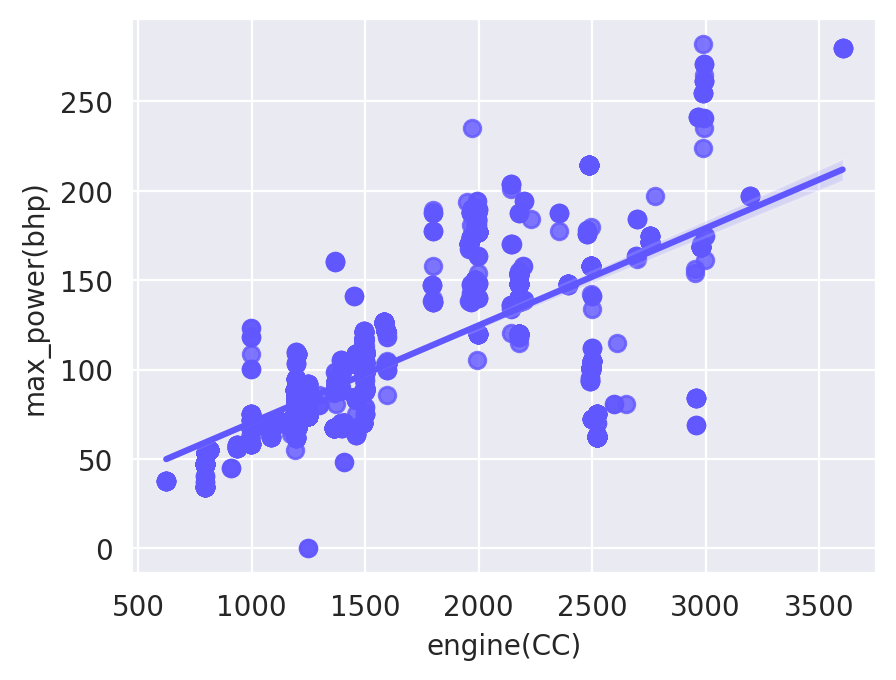

In [ ]:
sns.regplot(data=df,
            x='engine(CC)',
            y='max_power(bhp)',
            color='#6157FF', )

<AxesSubplot:xlabel='engine(CC)', ylabel='mileage(kmpl)'>

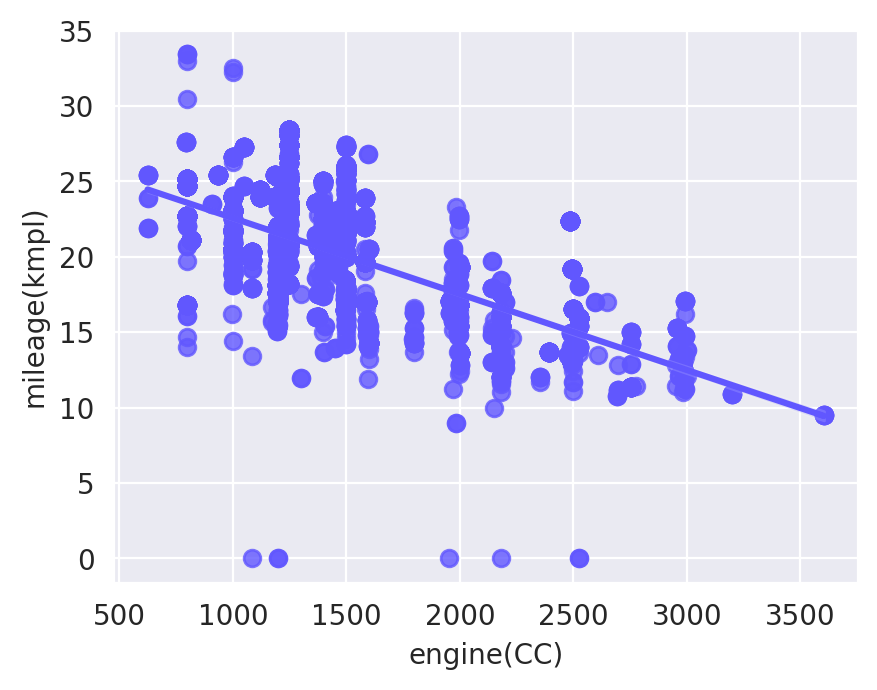

In [ ]:
sns.regplot(data=df,
            x='engine(CC)',
            y='mileage(kmpl)',
            color='#6157FF',)

# LmPlot

**lmplot(data=None, x=None, y=None, hue=None, col=None, row=None, palette=None, col_wrap=None, height=5, aspect=1, markers='o', sharex=None, sharey=None, hue_order=None, col_order=None, row_order=None, legend=True, legend_out=None, x_estimator=None, x_bins=None, x_ci='ci', scatter=True, fit_reg=True, ci=95, n_boot=1000, units=None, seed=None, order=1, logistic=False, lowess=False, robust=False, logx=False, x_partial=None, y_partial=None, truncate=True, x_jitter=None, y_jitter=None, scatter_kws=None, line_kws=None, facet_kws=None)**
    
    
        Plot data and regression model fits across a FacetGrid.
    This function combines :func:`regplot` and :class:`FacetGrid`. It is intended as a convenient interface to fit regression models across conditional subsets of a dataset.
    When thinking about how to assign variables to different facets, a general rule is that it makes sense to use ``hue`` for the most important comparison, followed by ``col`` and ``row``. However, always think about your particular dataset and the goals of the visualization you are creating.

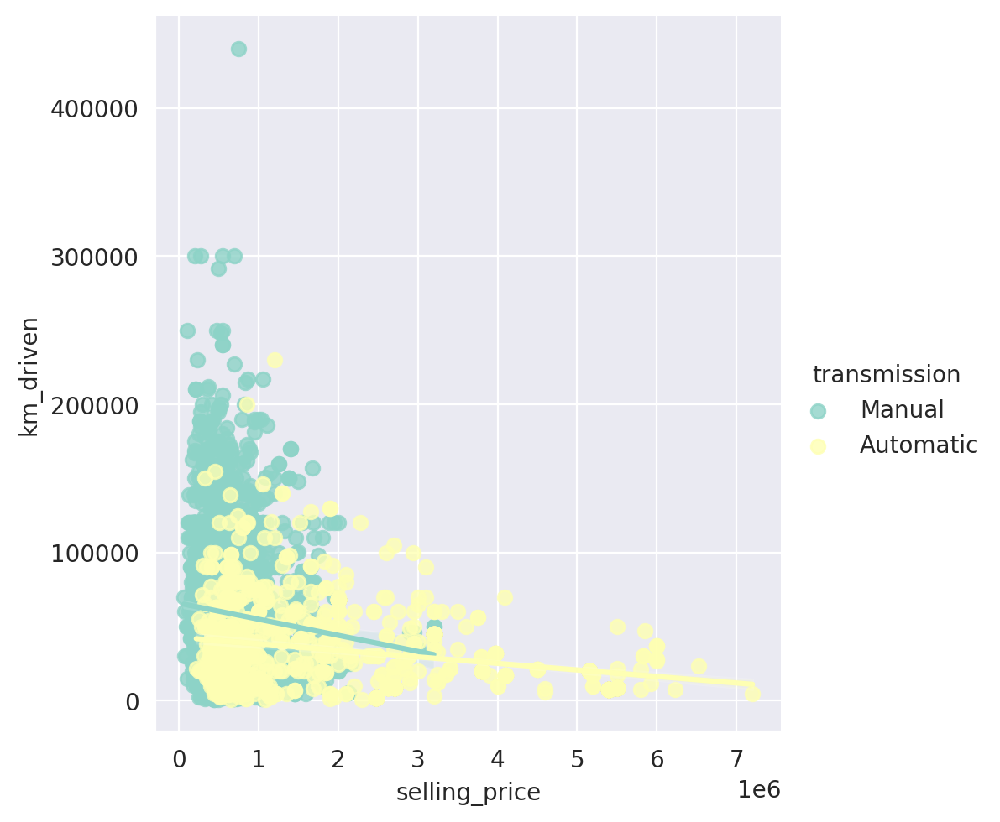

In [ ]:
sns.lmplot(data=df,
           x='selling_price',
           y='km_driven',
           hue='transmission',)

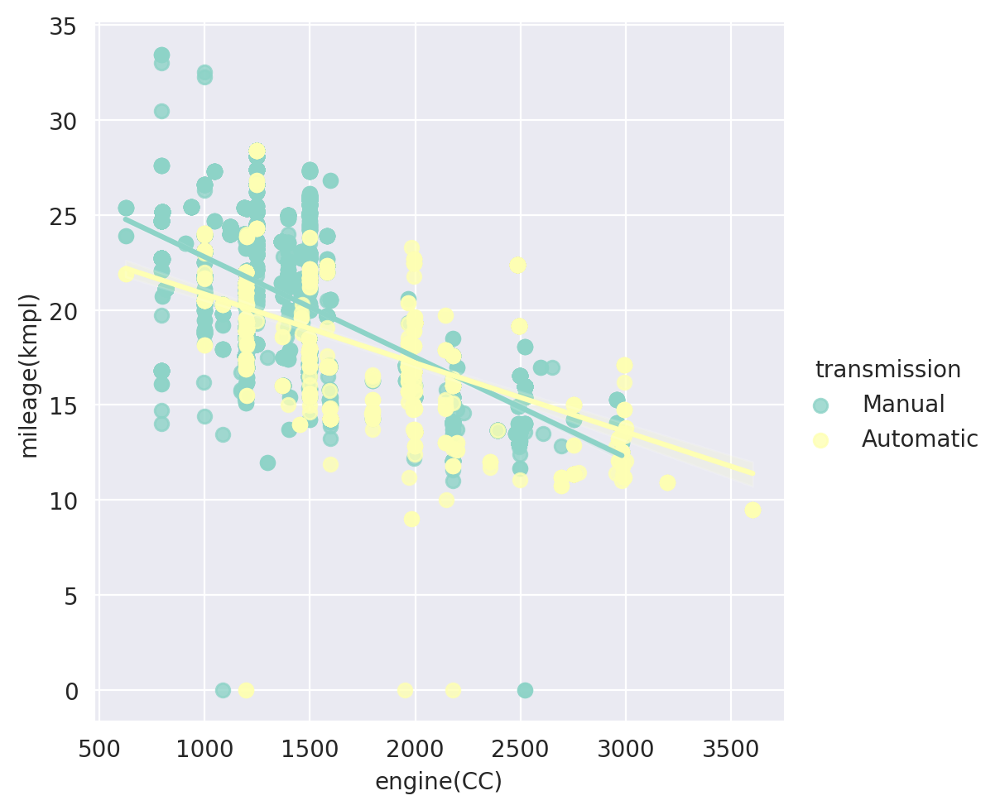

In [ ]:
sns.lmplot(data=df,
           x='engine(CC)',
           y='mileage(kmpl)',
           hue='transmission')

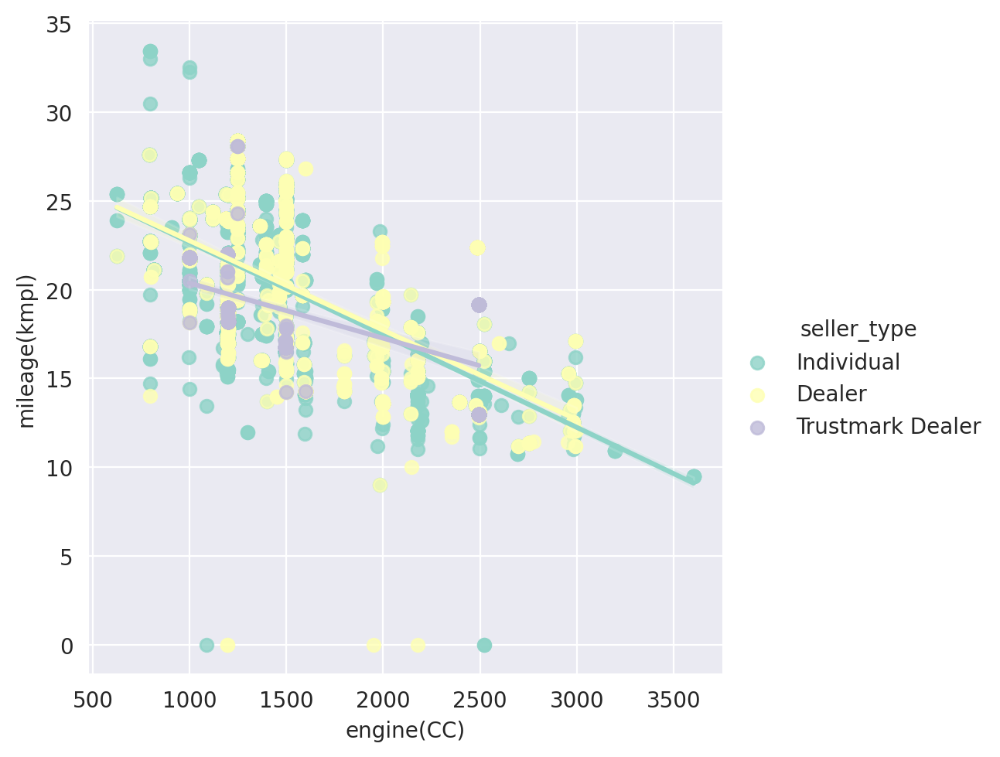

In [ ]:
sns.lmplot(data=df,
           x='engine(CC)',
           y='mileage(kmpl)',
           hue='seller_type')

# HistPlot

**histplot(data=None, x=None, y=None, hue=None, weights=None, stat='count', bins='auto', binwidth=None, binrange=None, discrete=None, cumulative=False, common_bins=True, common_norm=True, multiple='layer', element='bars', fill=True, shrink=1, kde=False, kde_kws=None, line_kws=None, thresh=0, pthresh=None, pmax=None, cbar=False, cbar_ax=None, cbar_kws=None, palette=None, hue_order=None, hue_norm=None, color=None, log_scale=None, legend=True, ax=None, kwargs)**
    
    Plot univariate or bivariate histograms to show distributions of datasets.
    
    A histogram is a classic visualization tool that represents the distribution of one or more variables by counting the number of observations that fall within discrete bins.
    
    This function can normalize the statistic computed within each bin to estimate frequency, density or probability mass, and it can add a smooth curve obtained using a kernel density estimate, similar to :func:`kdeplot`.

<AxesSubplot:xlabel='mileage(kmpl)', ylabel='Count'>

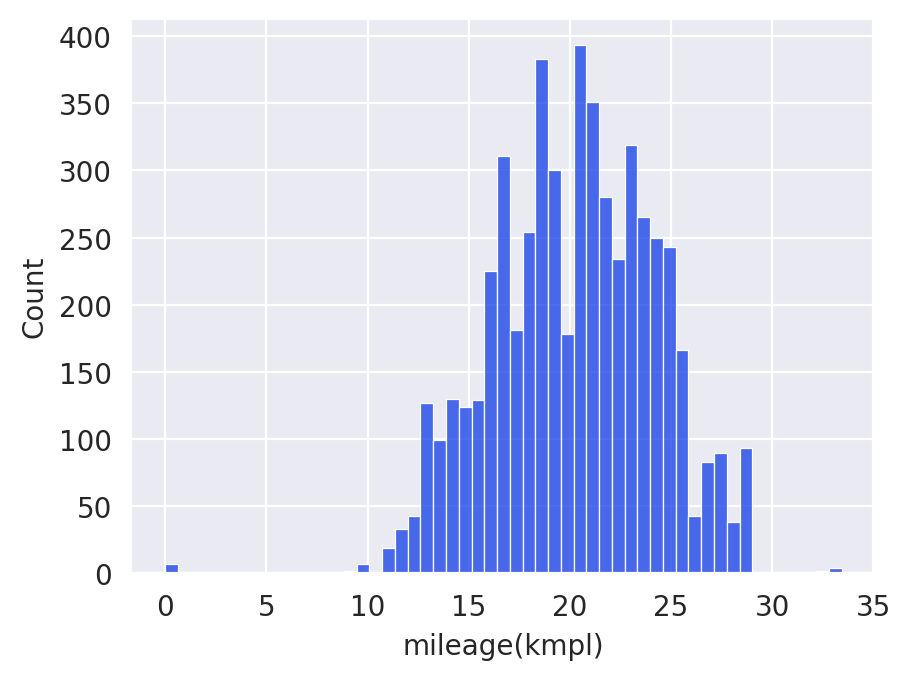

In [ ]:
sns.histplot(data=df,
             x='mileage(kmpl)',
             color='#103CE7')

* kde : bool
  * If True, compute a kernel density estimate to smooth the distribution and show on the plot as (one or more) line(s). Only relevant with univariate data.

<AxesSubplot:xlabel='mileage(kmpl)', ylabel='Count'>

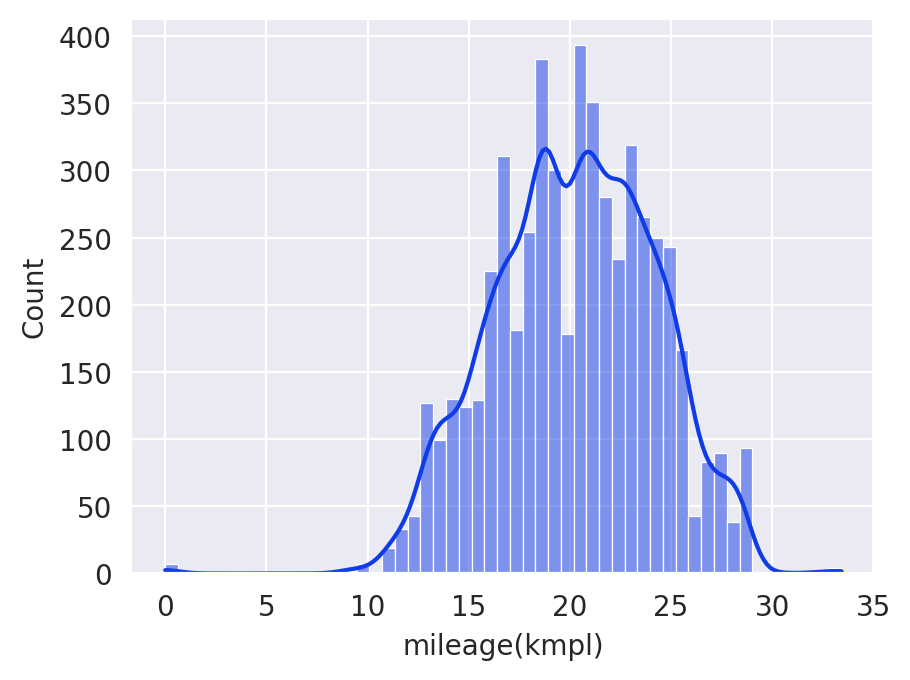

In [ ]:
sns.histplot(data=df,
             x='mileage(kmpl)',
             kde=True,
             color='#103CE7')

<AxesSubplot:xlabel='selling_price', ylabel='Count'>

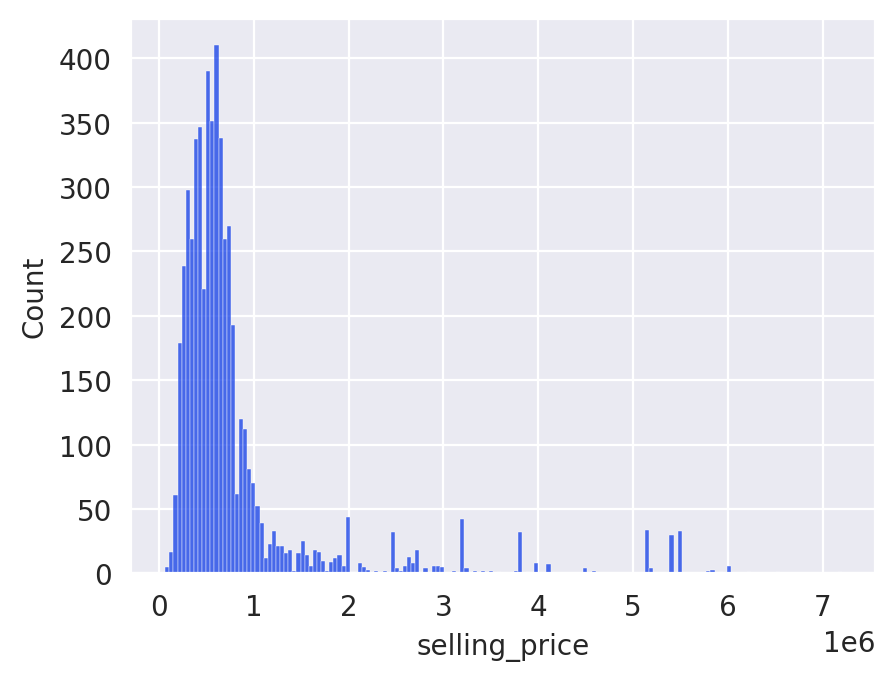

In [ ]:
sns.histplot(data=df,
             x='selling_price',
             color='#103CE7')

<AxesSubplot:xlabel='selling_price', ylabel='Count'>

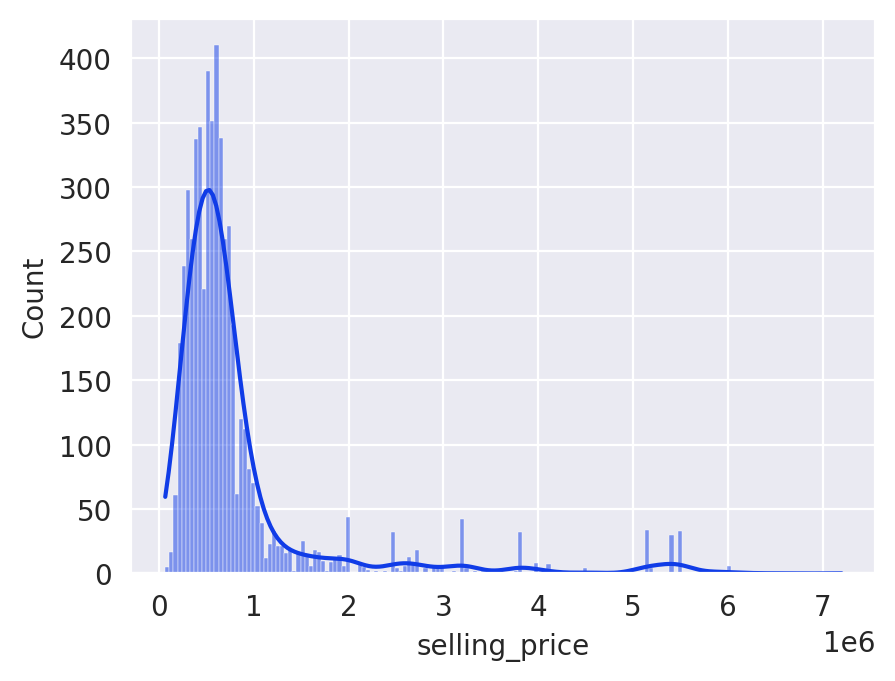

In [ ]:
sns.histplot(data=df,
             x='selling_price',
             kde=True,
             color='#103CE7')

<AxesSubplot:xlabel='year', ylabel='Count'>

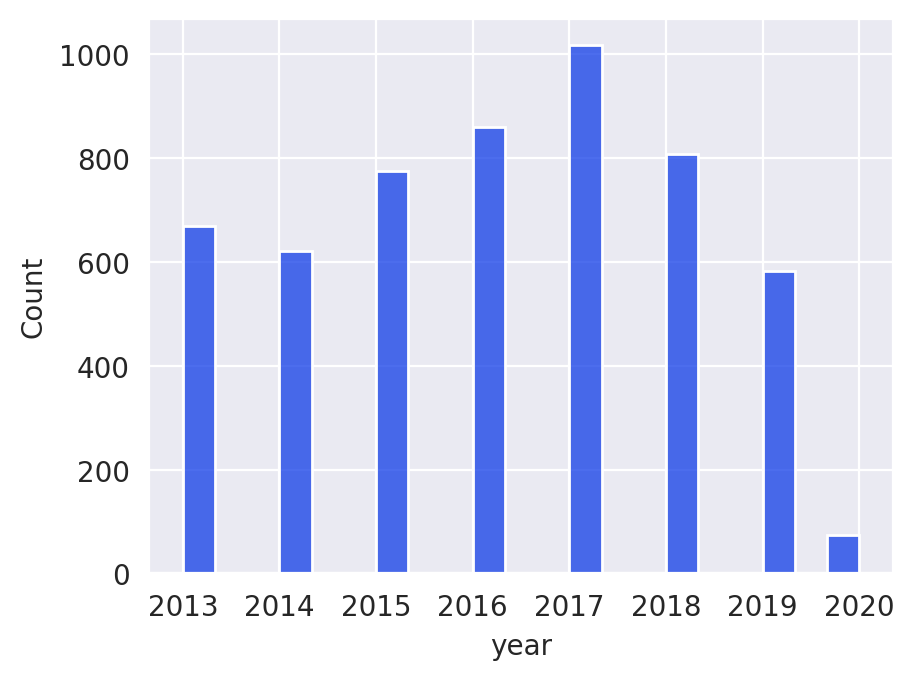

In [ ]:
sns.histplot(data=df,
             x='year',
             color='#103CE7')

<AxesSubplot:xlabel='year', ylabel='Count'>

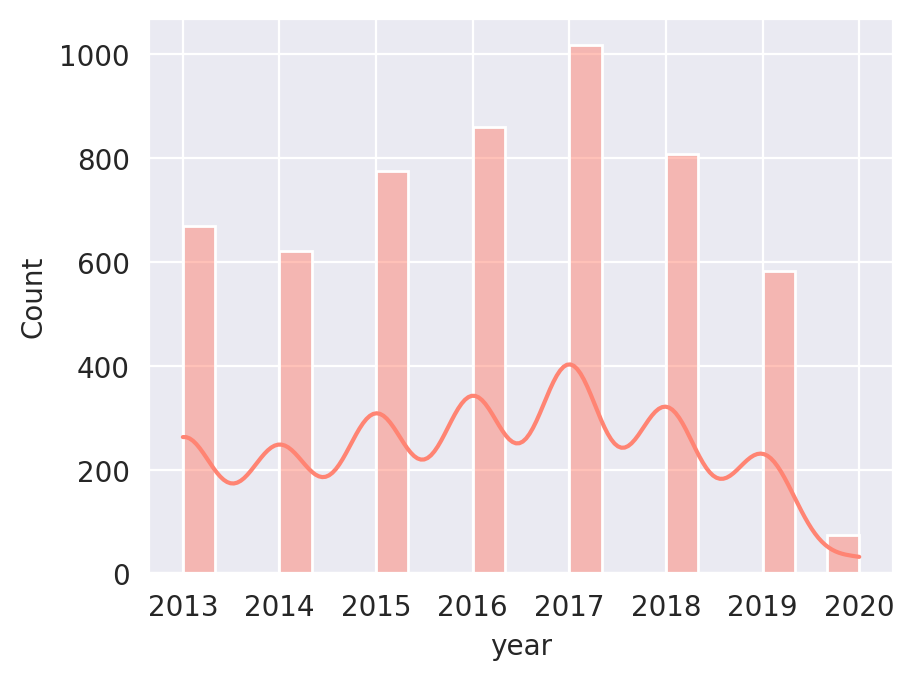

In [ ]:
sns.histplot(data=df,
             x='year',
             kde=True,
             color='#FF8473')

<AxesSubplot:xlabel='km_driven', ylabel='Count'>

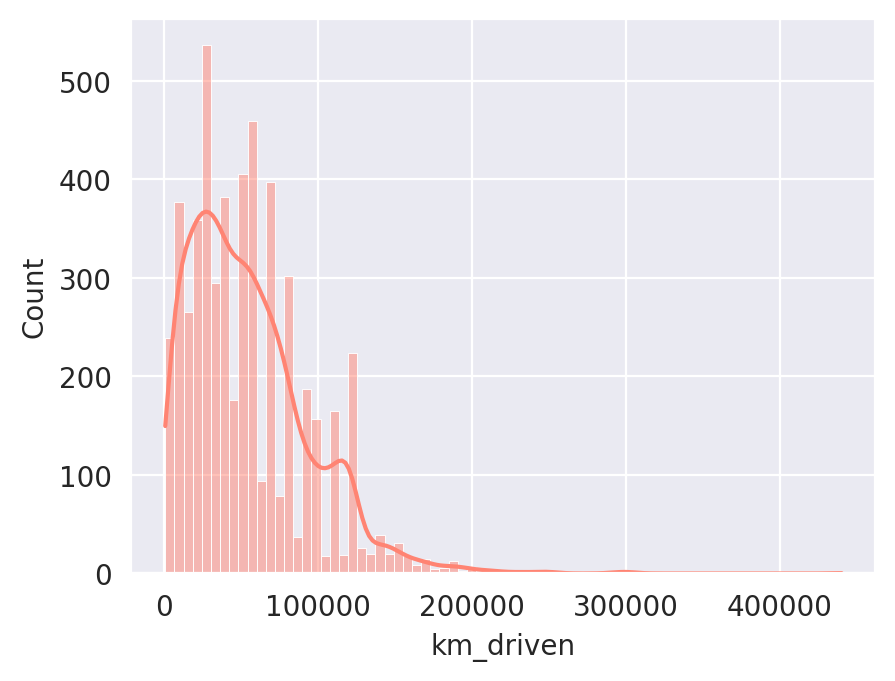

In [ ]:
sns.histplot(data=df,
             x='km_driven',
             kde=True,
             color='#FF8473')

<AxesSubplot:xlabel='engine(CC)', ylabel='Count'>

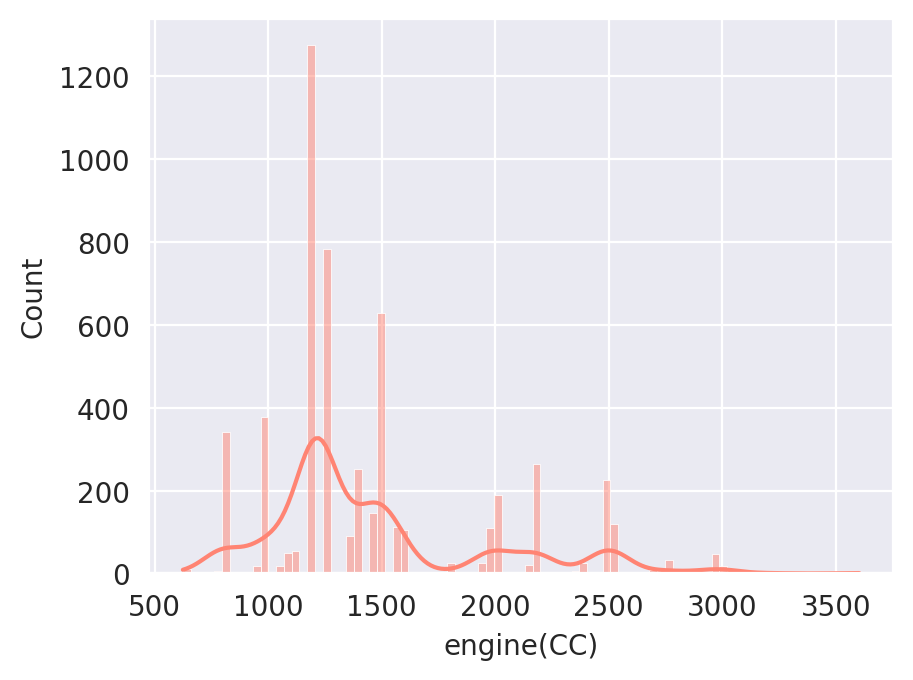

In [ ]:
sns.histplot(data=df,
             x='engine(CC)',
             kde=True,
             color='#FF8473')

<AxesSubplot:xlabel='max_power(bhp)', ylabel='Count'>

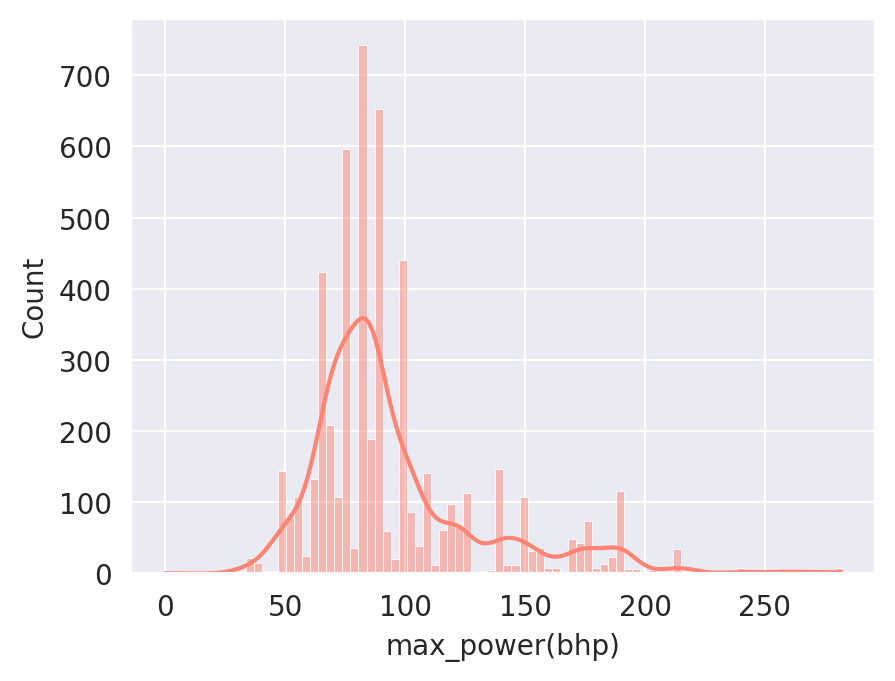

In [ ]:
sns.histplot(data=df,
             x='max_power(bhp)',
             kde=True,
             color='#FF8473')

<AxesSubplot:xlabel='engine(CC)', ylabel='year'>

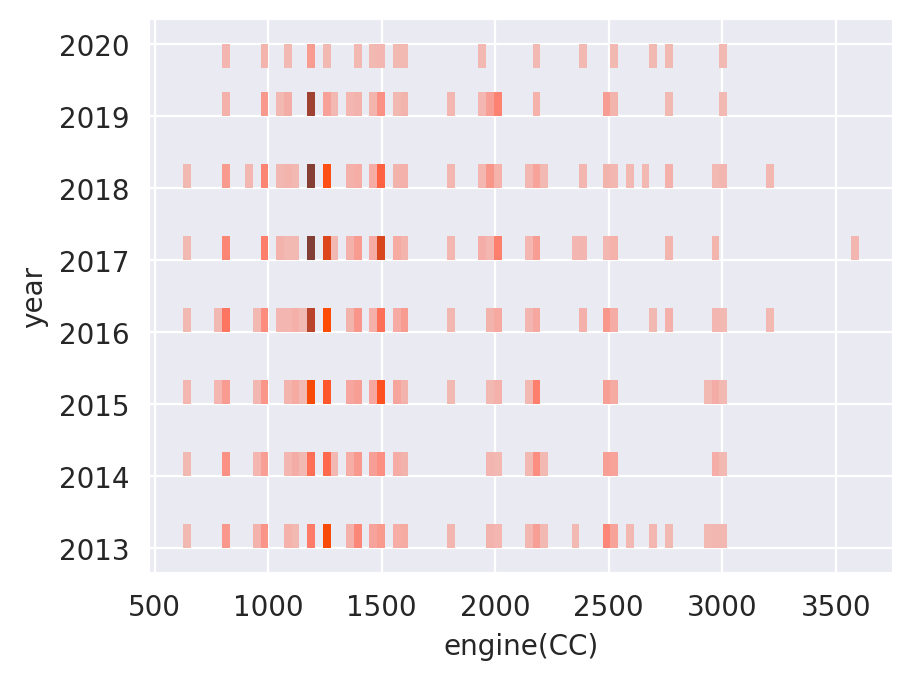

In [ ]:
sns.histplot(data=df,
             x='engine(CC)',
             y='year',
             kde=True,
             color='#FF8473')

# KdePlot

<AxesSubplot:xlabel='mileage(kmpl)', ylabel='Density'>

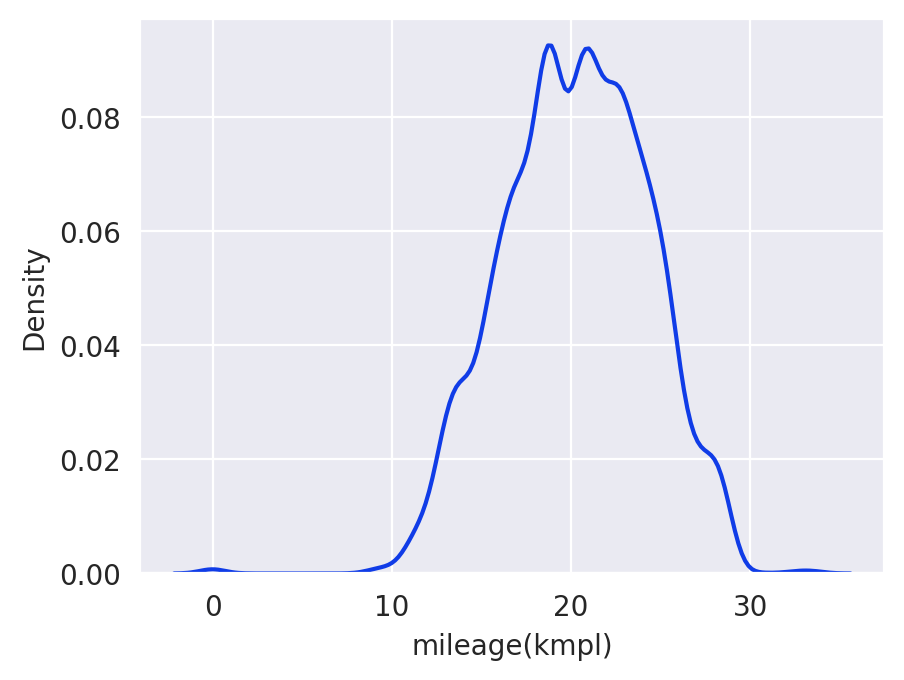

In [ ]:
sns.kdeplot(data=df,
            x='mileage(kmpl)',
            color='#103CE7')

# RugPlot

**rugplot(data=None, x=None, y=None, hue=None, height=0.025, expand_margins=True, palette=None, hue_order=None, hue_nourm=None, legend=True, ax=None, kwargs)**
    
    Plot marginal distributions by drawing ticks along the x and y axes.
    
    This function is intended to complement other plots by showing the location of individual observations in an unobtrusive way.

<AxesSubplot:xlabel='mileage(kmpl)', ylabel='Density'>

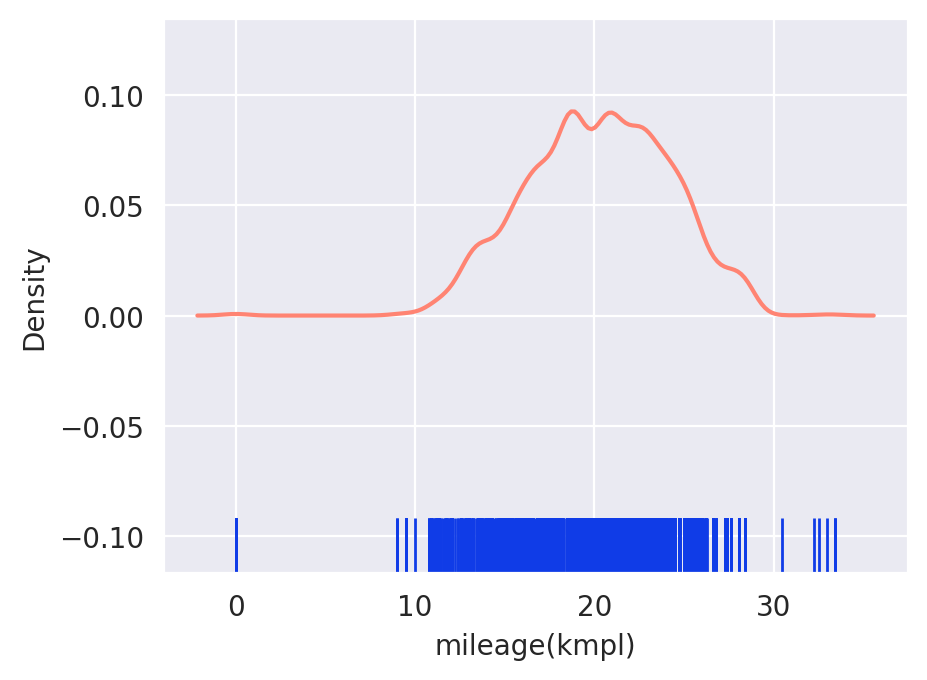

In [ ]:
sns.rugplot(data=df,
            x='mileage(kmpl)',
            color='#103CE7',
            height=0.1)
sns.kdeplot(data=df,
            x='mileage(kmpl)',
            color='#FF8473')

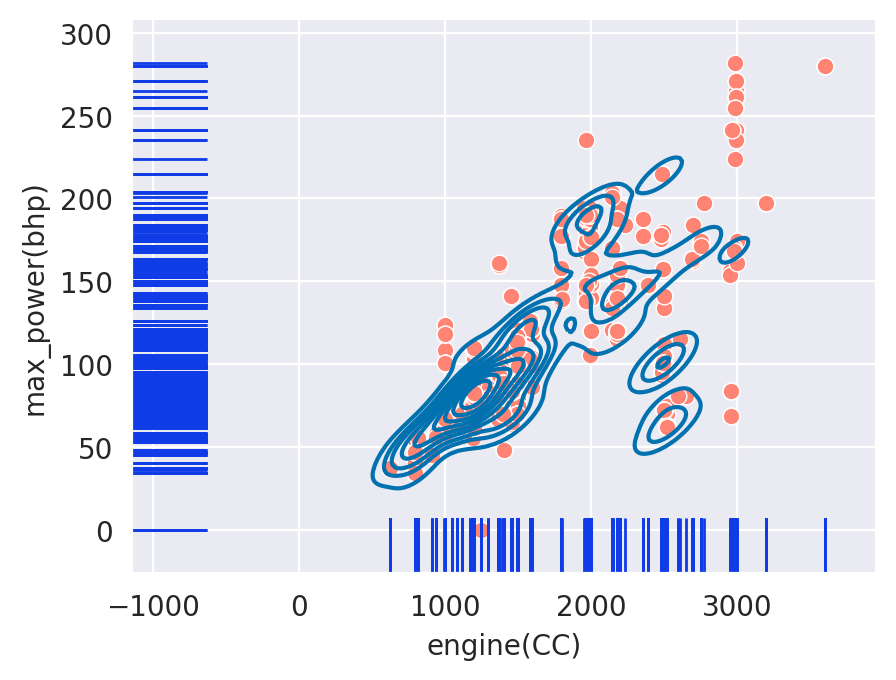

In [ ]:
sns.rugplot(data=df,
            x="engine(CC)",
            y="max_power(bhp)",
            color='#103CE7',
            height=0.1)

sns.scatterplot(data=df,
                x='engine(CC)',
                y='max_power(bhp)',
                color="#FF8473")

sns.kdeplot(data=df,
            x='engine(CC)',
            y='max_power(bhp)',
            color='#0172AF')

plt.show()

# HeatMap

**heatmap(data, vmin=None, vmax=None, cmap=None, center=None, robust=False, annot=None, fmt='.2g', annot_kws=None, linewidths=0, linecolor='white', cbar=True, cbar_kws=None, cbar_ax=None, square=False, xticklabels='auto', yticklabels='auto', mask=None, ax=None, kwargs)**
    
    Plot rectangular data as a color-encoded matrix.
    
    This is an Axes-level function and will draw the heatmap into the currently-active Axes if none is provided to the ``ax`` argument.  Part of this Axes space will be taken and used to plot a colormap, unless ``cbar``is False or a separate Axes is provided to ``cbar_ax``.

In [ ]:
a = df.corr()
a

<ipython-input-164-3efd745864d5>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  a = df.corr()


,year,selling_price,km_driven,mileage(kmpl),engine(CC),max_power(bhp),seats
year,1.000000,0.342802,-0.549185,0.091948,-0.066821,0.149911,-0.157223
selling_price,0.342802,1.000000,-0.224280,-0.281700,0.537379,0.810341,0.010687
km_driven,-0.549185,-0.224280,1.000000,-0.025806,0.196197,-0.055279,0.277661
mileage(kmpl),0.091948,-0.281700,-0.025806,1.000000,-0.620111,-0.481760,-0.474946
engine(CC),-0.066821,0.537379,0.196197,-0.620111,1.000000,0.728127,0.546663
max_power(bhp),0.149911,0.810341,-0.055279,-0.481760,0.728127,1.000000,0.137935
seats,-0.157223,0.010687,0.277661,-0.474946,0.546663,0.137935,1.000000


<Figure size 1000x1000 with 0 Axes>

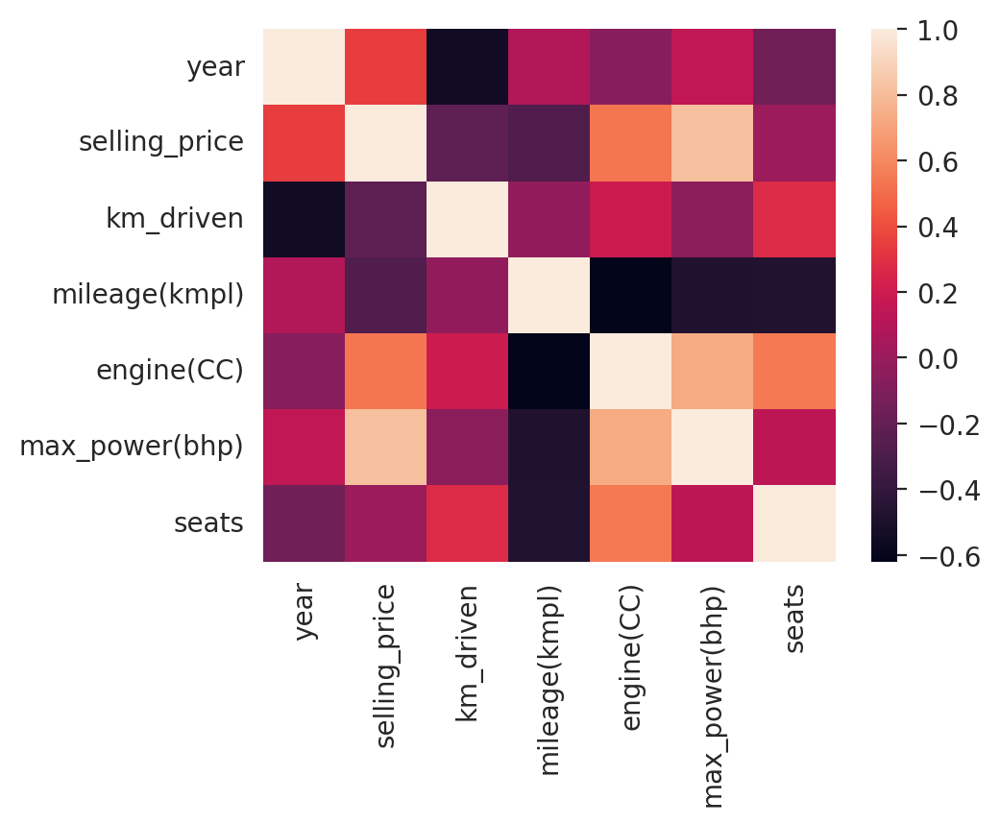

<Figure size 1000x1000 with 0 Axes>

In [ ]:
sns.heatmap(a)
plt.figure(figsize=(10,10))

<Figure size 1000x1000 with 0 Axes>

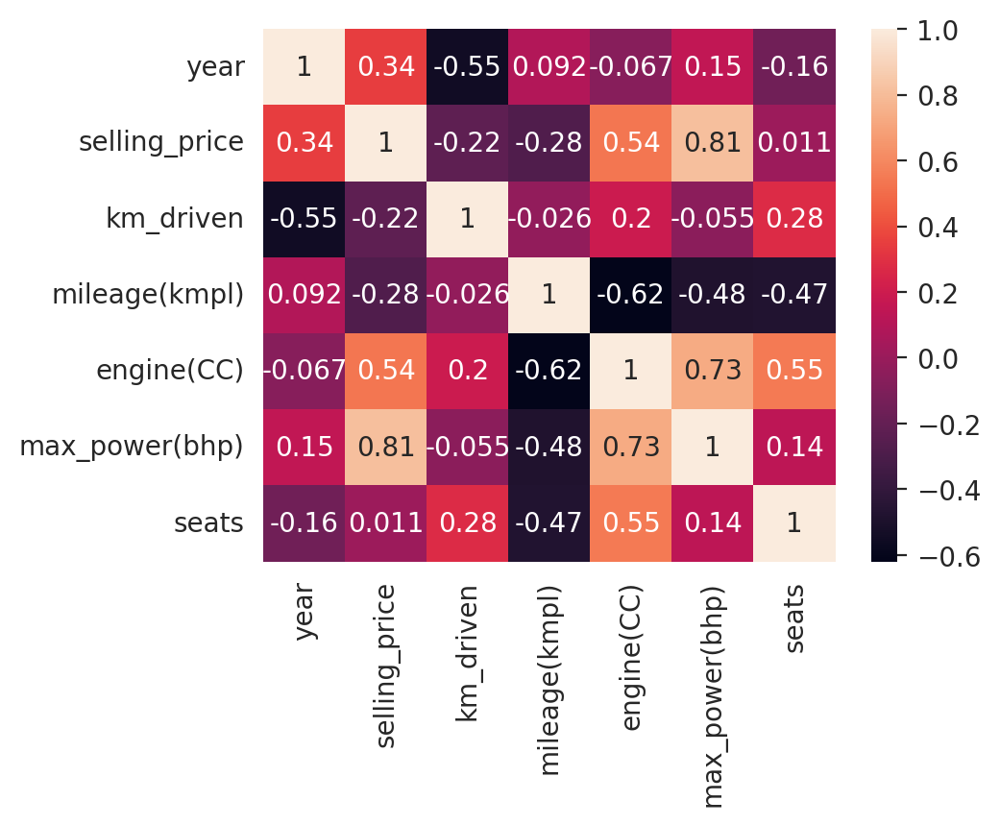

<Figure size 1000x1000 with 0 Axes>

In [ ]:
sns.heatmap(a, annot=True)
plt.figure(figsize=(10,10))

<Figure size 1000x1000 with 0 Axes>

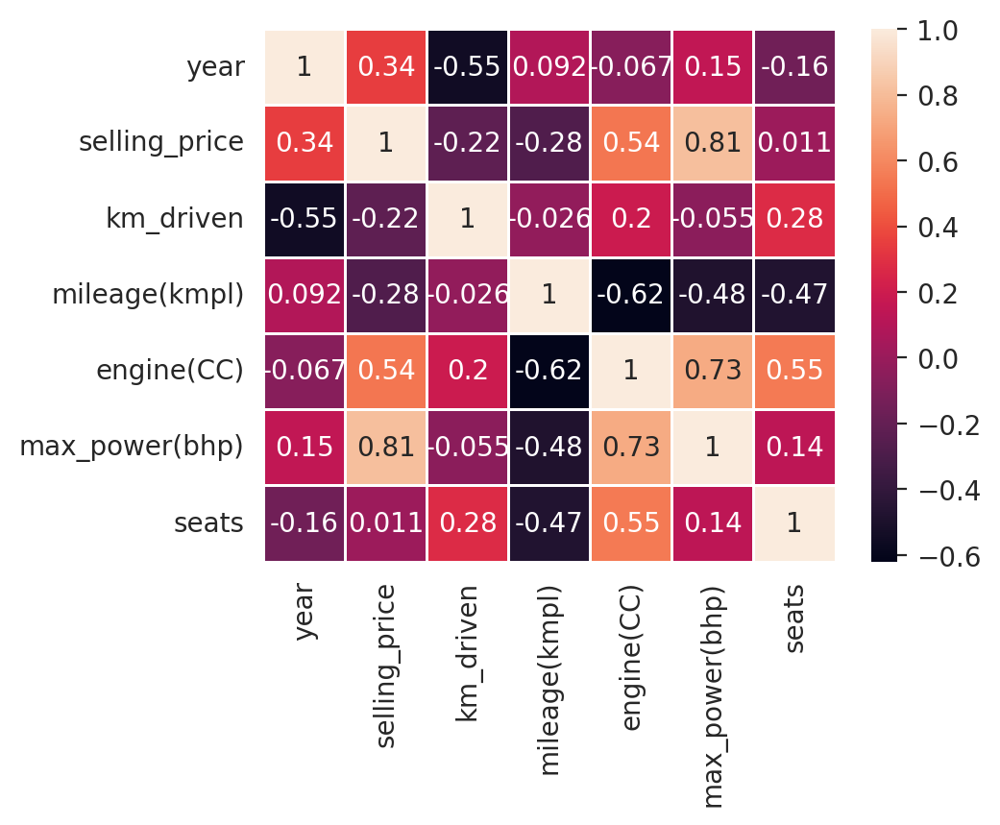

<Figure size 1000x1000 with 0 Axes>

In [ ]:
sns.heatmap(a,
            annot=True,
            linewidths=0.5)
plt.figure(figsize=(10,10))

<Figure size 1000x1000 with 0 Axes>

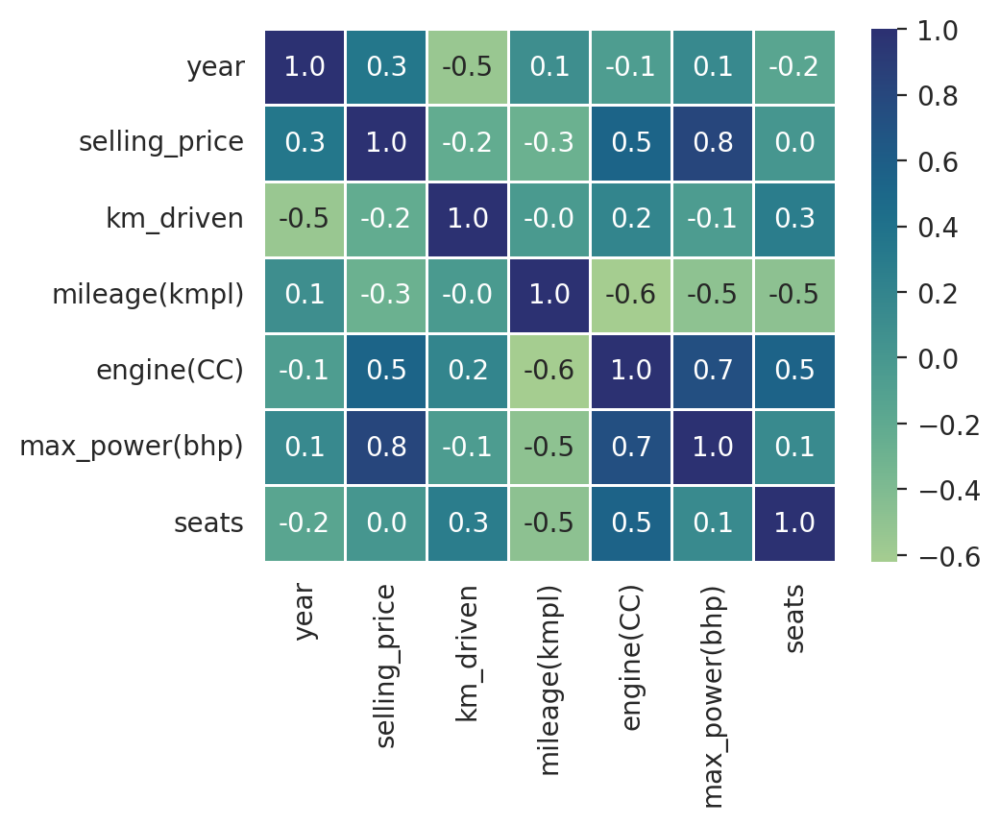

<Figure size 1000x1000 with 0 Axes>

In [ ]:
sns.heatmap(a,
            annot=True,
            linewidths=0.5,
            cmap='crest',
            fmt='.1f')
plt.figure(figsize=(10,10))

In [ ]:
b = df.head(15)
b

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,5.0
10,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,5.0
15,Mahindra KUV 100 mFALCON G80 K8 5str,2016,400000,40000,Petrol,Individual,Manual,First Owner,18.15,1198.0,82.00,5.0
16,Maruti Ertiga SHVS VDI,2016,778000,70000,Diesel,Individual,Manual,Second Owner,24.52,1248.0,88.50,7.0
19,Hyundai i20 2015-2017 Asta 1.4 CRDi,2016,680000,100000,Diesel,Individual,Manual,First Owner,22.54,1396.0,88.73,5.0
21,Honda WR-V i-DTEC VX,2017,950000,50000,Diesel,Individual,Manual,First Owner,25.50,1498.0,98.60,5.0
22,Maruti Swift Dzire ZDI,2015,525000,40000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,5.0


In [ ]:
g_df = b.pivot(index='name',
               columns='year',
               values='mileage(kmpl)')
g_df

year,2013,2014,2015,2016,2017,2018
name,,,,,,
Chevrolet Enjoy TCDi LTZ 7 Seater,18.2,NaN,NaN,NaN,NaN,NaN
Ford Figo Diesel Celebration Edition,20.0,NaN,NaN,NaN,NaN,NaN
Honda WR-V i-DTEC VX,NaN,NaN,NaN,NaN,25.50,NaN
Hyundai Xcent 1.2 VTVT E Plus,NaN,NaN,NaN,NaN,20.14,NaN
Hyundai i20 2015-2017 Asta 1.4 CRDi,NaN,NaN,NaN,22.54,NaN,NaN
Mahindra KUV 100 mFALCON G80 K8 5str,NaN,NaN,NaN,18.15,NaN,NaN
Maruti Alto 800 LXI,NaN,NaN,NaN,NaN,24.70,NaN
Maruti Baleno Delta 1.2,NaN,NaN,NaN,21.40,NaN,NaN
Maruti Ertiga SHVS VDI,NaN,NaN,NaN,24.52,NaN,NaN


<Figure size 1200x1200 with 0 Axes>

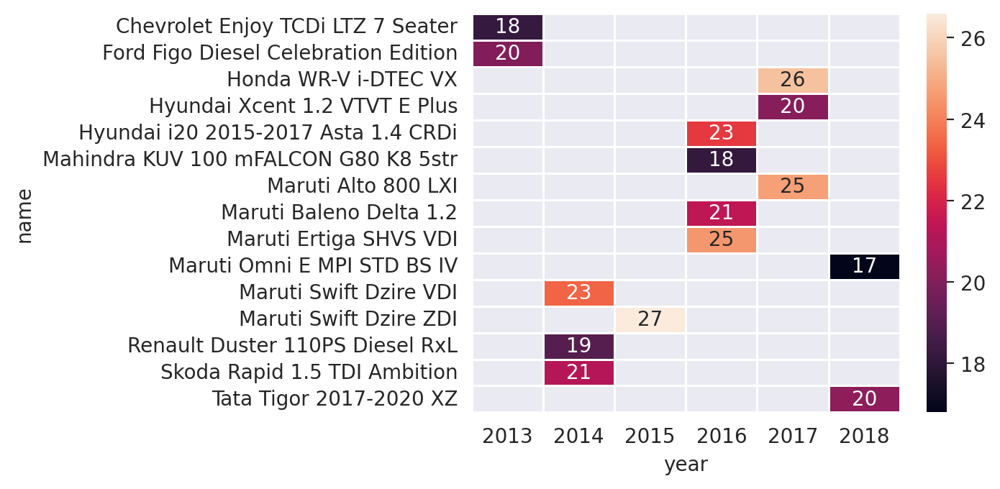

<Figure size 1200x1200 with 0 Axes>

In [ ]:
sns.heatmap(data=g_df,
            annot=True,
            linewidths=0.5, )
plt.figure(figsize=(12, 12))

<AxesSubplot:xlabel='year', ylabel='name'>

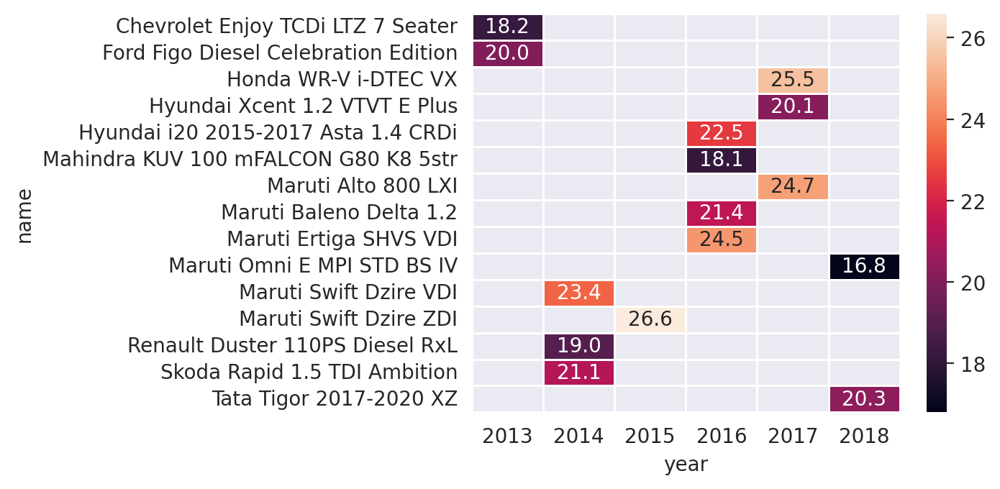

In [ ]:
sns.heatmap(data=g_df,
            annot=True,
            linewidths=0.5,
            fmt='.1f')

# PairPlot

**pairplot(data, hue=None, hue_order=None, palette=None, vars=None, x_vars=None, y_vars=None, kind='scatter', diag_kind='auto', markers=None, height=2.5, aspect=1, corner=False, dropna=False, plot_kws=None, diag_kws=None, grid_kws=None, size=None)**
    
    
    Plot pairwise relationships in a dataset.
      By default, this function will create a grid of Axes such that each numeric variable in ``data`` will by shared across the y-axes across a single row and the x-axes across a single column. The diagonal plots are treated differently: a univariate distribution plot is drawn to show the marginal distribution of the data in each column.
    
    It is also possible to show a subset of variables or plot different variables on the rows and columns. This is a high-level interface for :class:`PairGrid` that is intended to make it easy to draw a few common styles. You should use :class:`PairGrid` directly if you need more flexibility.
    

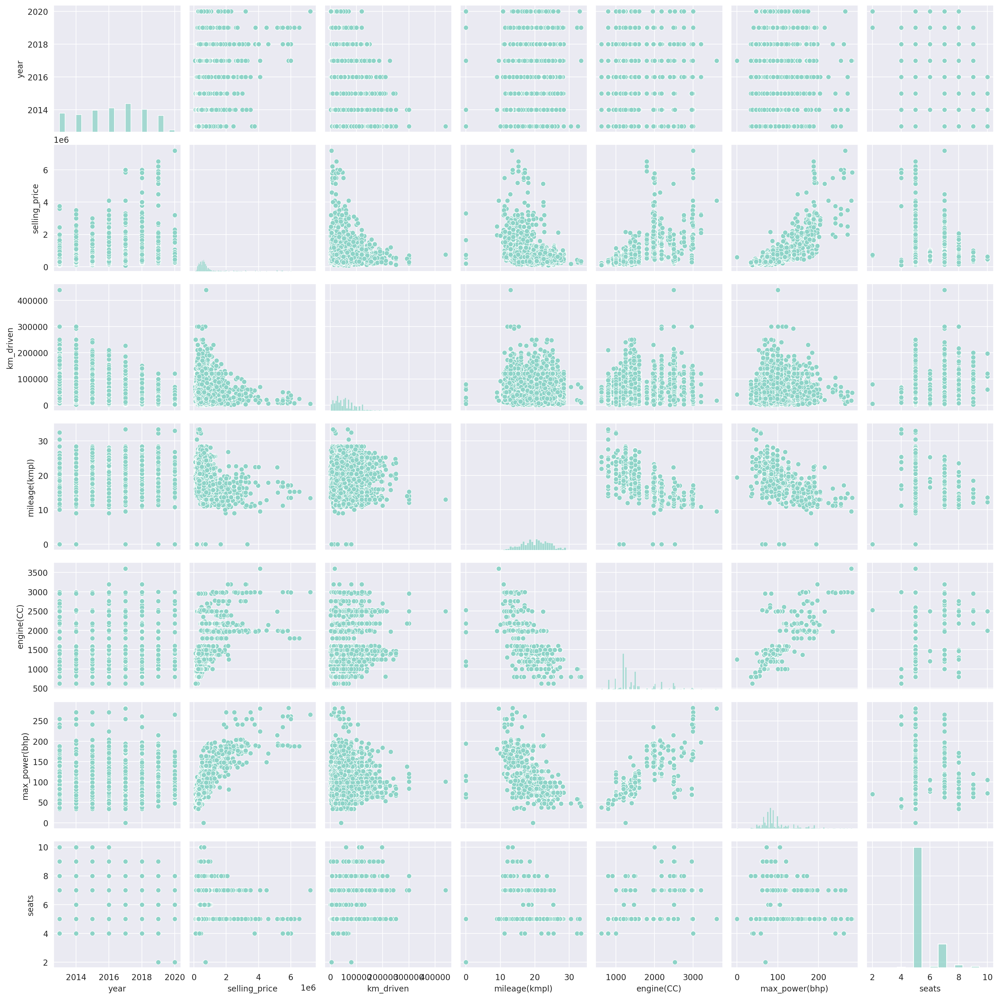

In [ ]:
sns.pairplot(data=df)

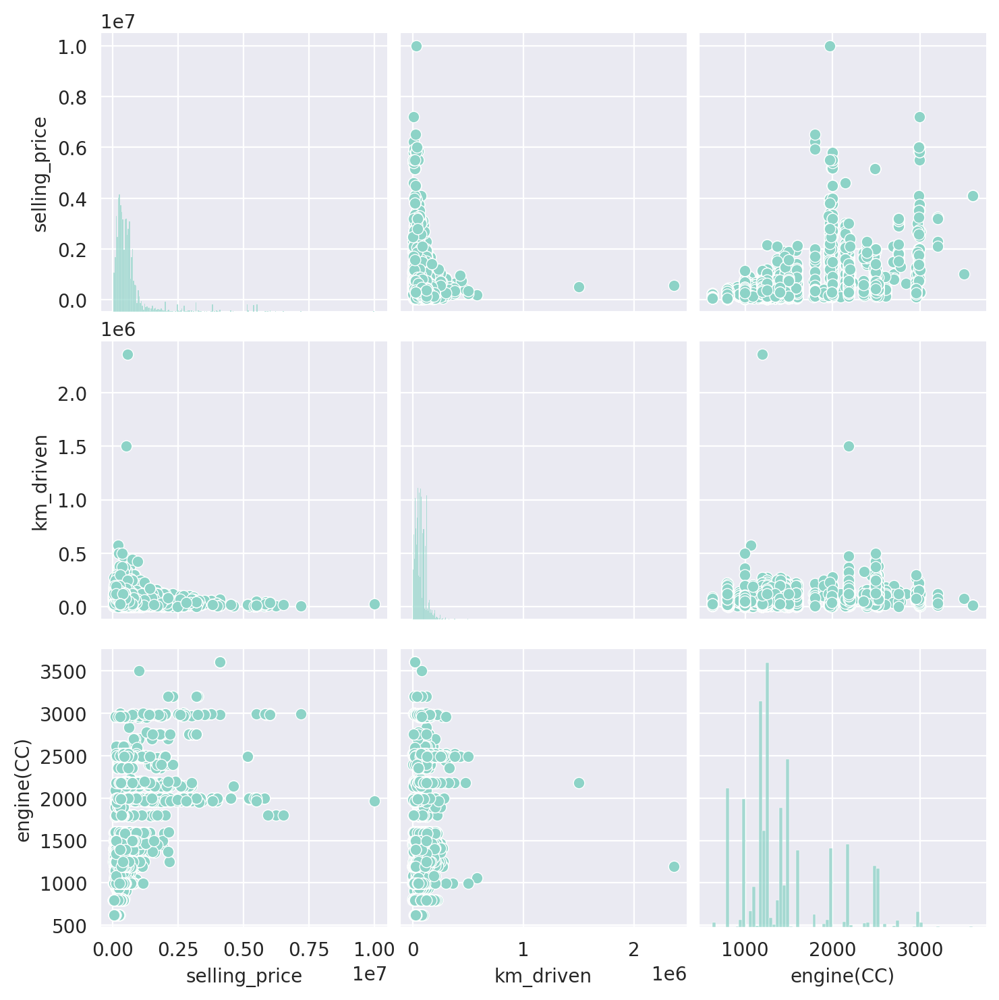

In [ ]:
sns.pairplot(data=num_df)

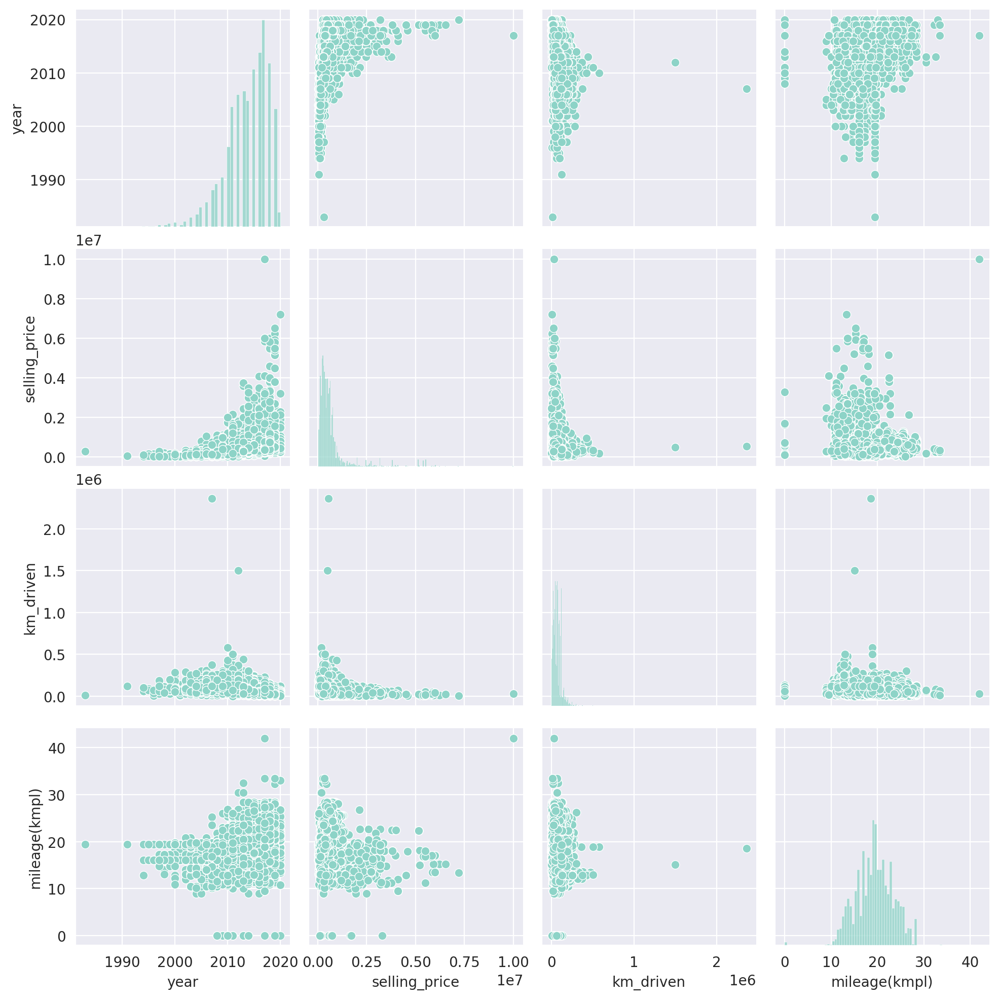

In [ ]:
sns.pairplot(main_df)

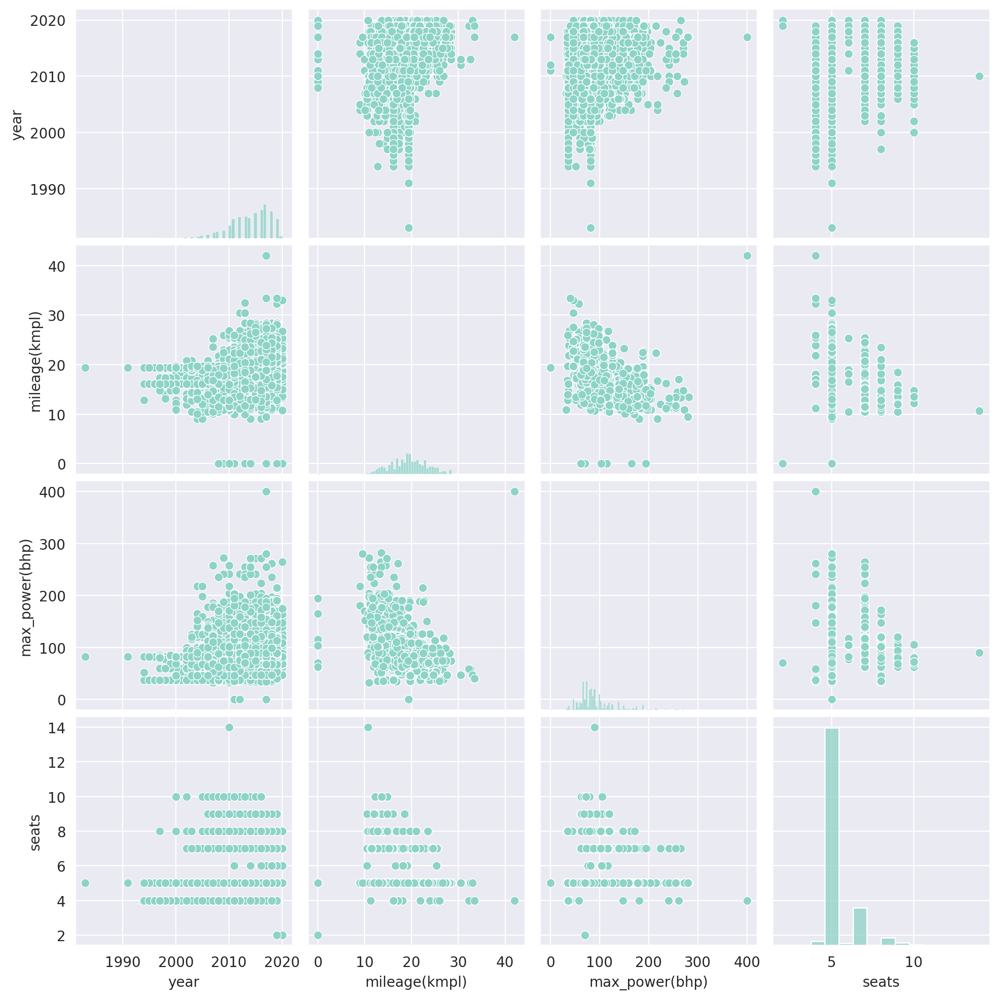

In [ ]:
sns.pairplot(v_df)

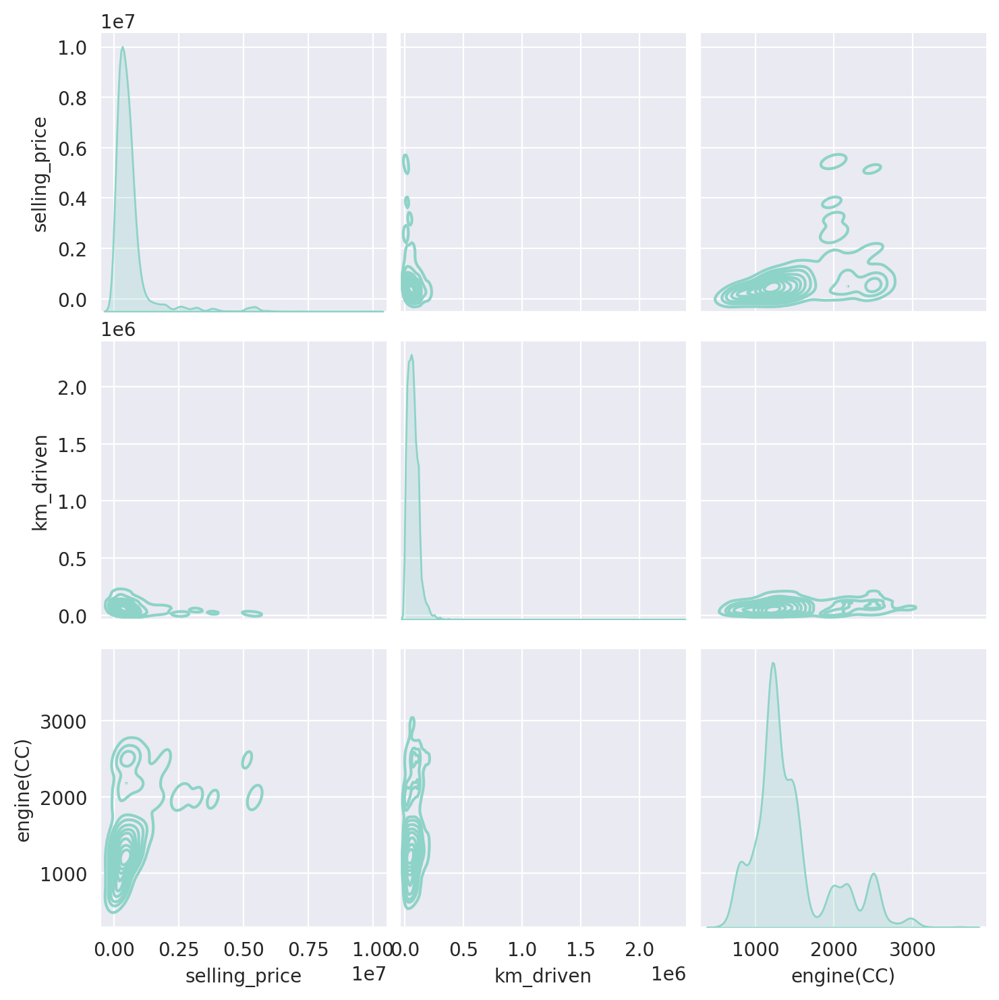

In [ ]:
sns.pairplot(data=num_df, kind='kde')

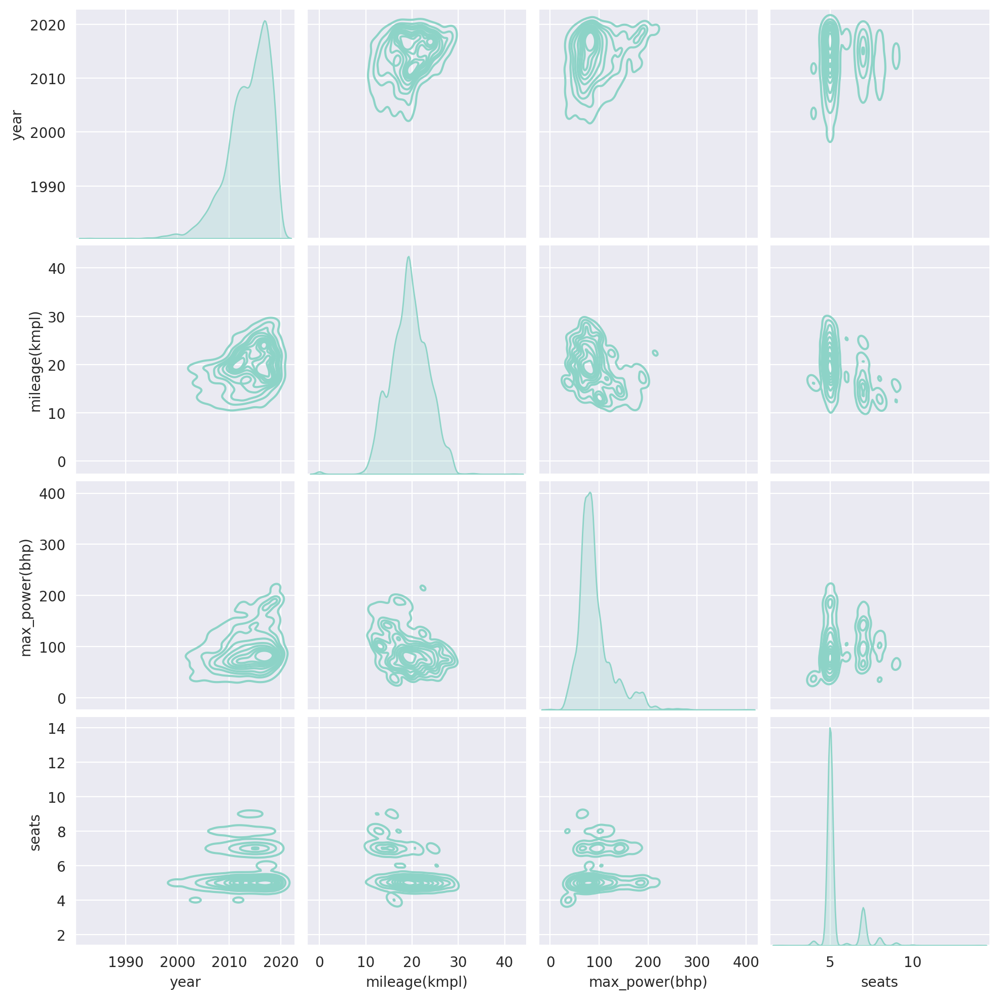

In [ ]:
sns.pairplot(data=v_df, kind='kde',)

# PointPlot

**pointplot(data=None, x=None, y=None, hue=None, order=None, hue_order=None, estimator='mean', errorbar=('ci', 95), n_boot=1000, units=None, seed=None, markers='o', linestyles='-', dodge=False, join=True, scale=1, orient=None, color=None, palette=None, errwidth=None, ci='deprecated', capsize=None, label=None, ax=None)**
    
    Show point estimates and errors using dot marks.
    
    A point plot represents an estimate of central tendency for a numeric variable by the position of the dot and provides some indication of the uncertainty around that estimate using error bars.
    
    Point plots can be more useful than bar plots for focusing comparisons between different levels of one or more categorical variables. They are particularly adept at showing interactions: how the relationship between levels of one categorical variable changes across levels of a second categorical variable. The lines that join each point from the same `hue` level allow interactions to be judged by differences in slope, which is easier for the eyes than comparing the heights of several groups of points or bars.
    
    It is important to keep in mind that a point plot shows only the mean (or other estimator) value, but in many cases it may be more informative to show the distribution of values at each level of the categorical variables.
    In that case, other approaches such as a box or violin plot may be more
    appropriate.
    
    .. note::
        This function always treats one of the variables as categorical and
        draws data at ordinal positions (0, 1, ... n) on the relevant axis,
        even when the data has a numeric or date type.
    

<AxesSubplot:xlabel='selling_price', ylabel='km_driven'>

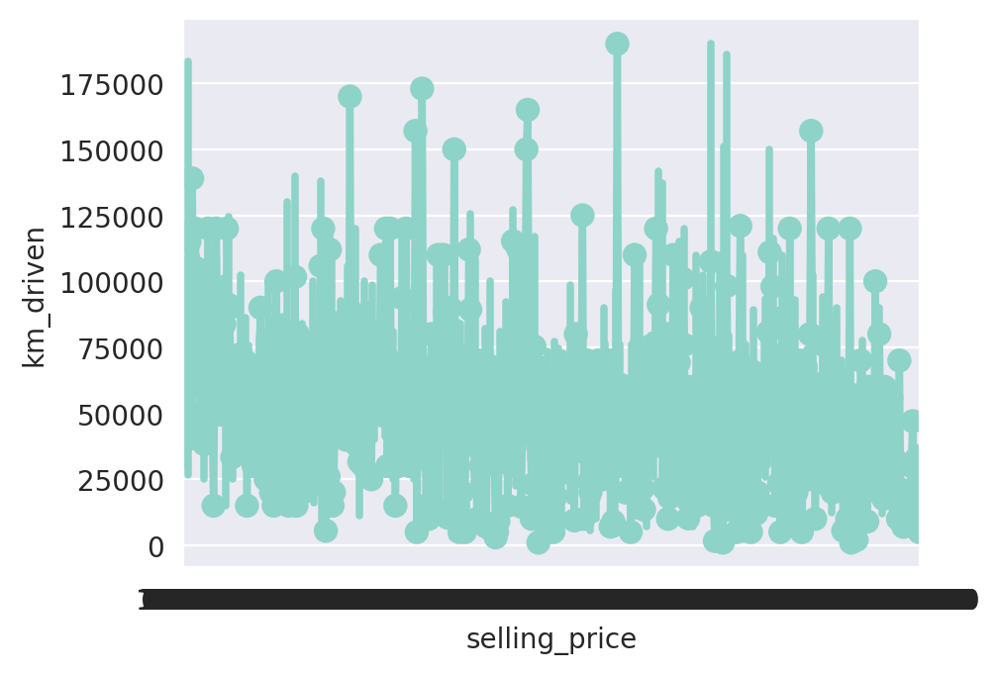

In [ ]:
sns.pointplot(data=df,
              x='selling_price',
              y='km_driven')


<AxesSubplot:xlabel='mileage(kmpl)', ylabel='max_power(bhp)'>

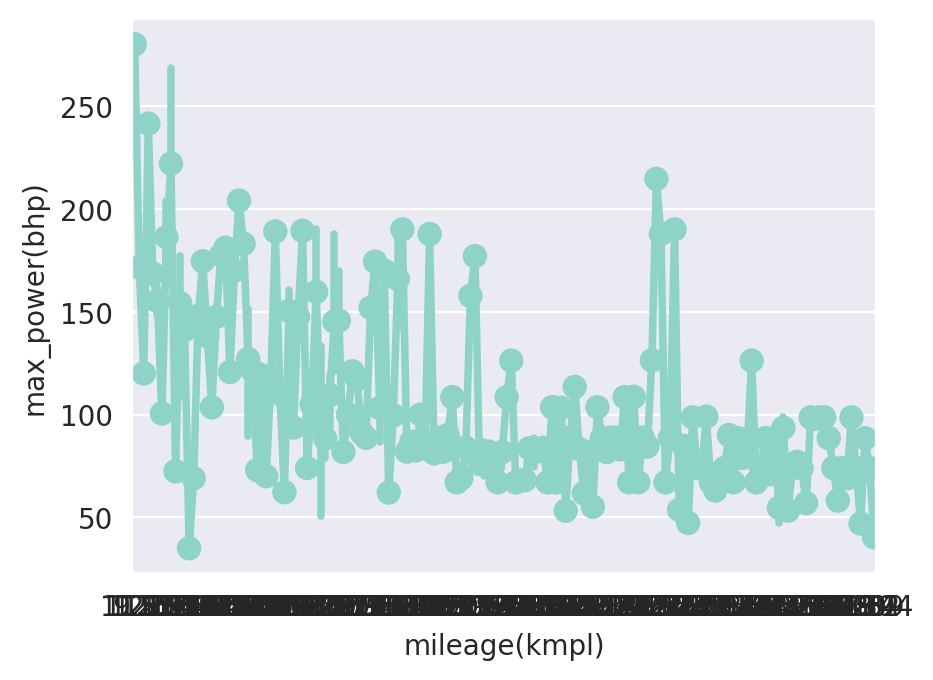

In [ ]:
sns.pointplot(data=df.head(500),
              x='mileage(kmpl)',
              y='max_power(bhp)')

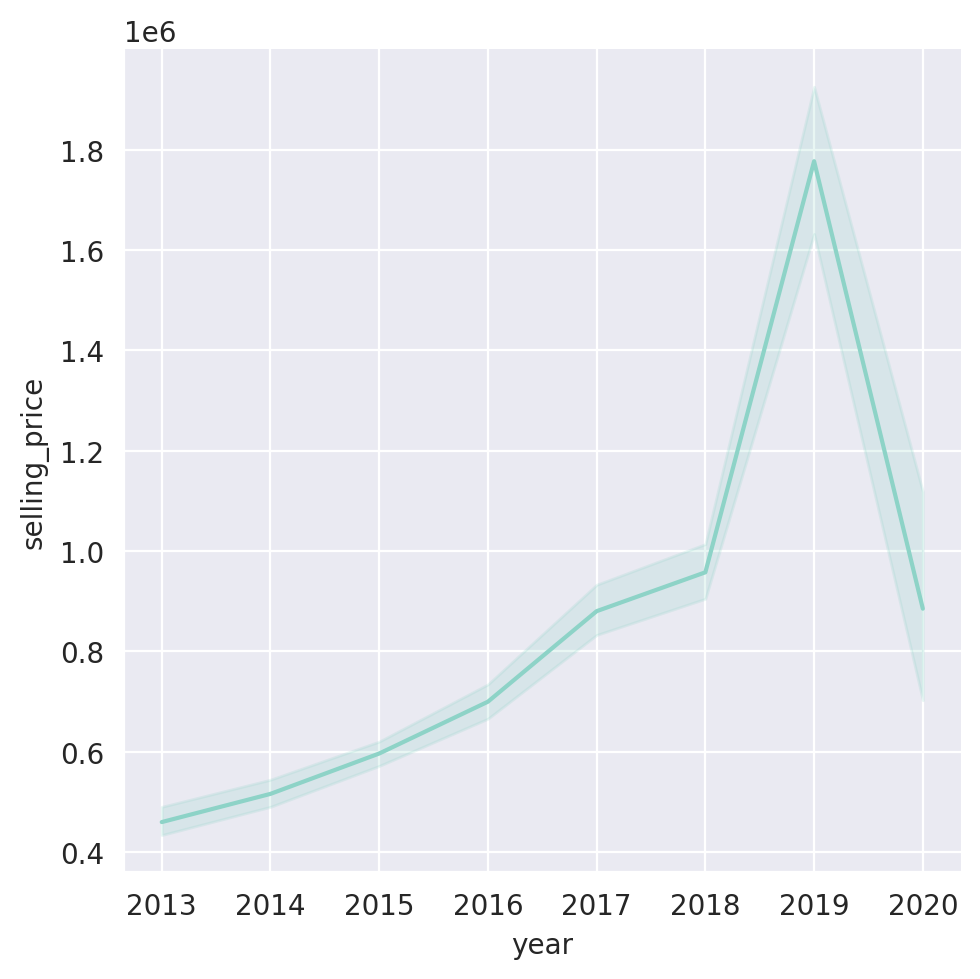

In [ ]:
sns.relplot(data=df,
            x='year',
            y='selling_price',
            kind='line')

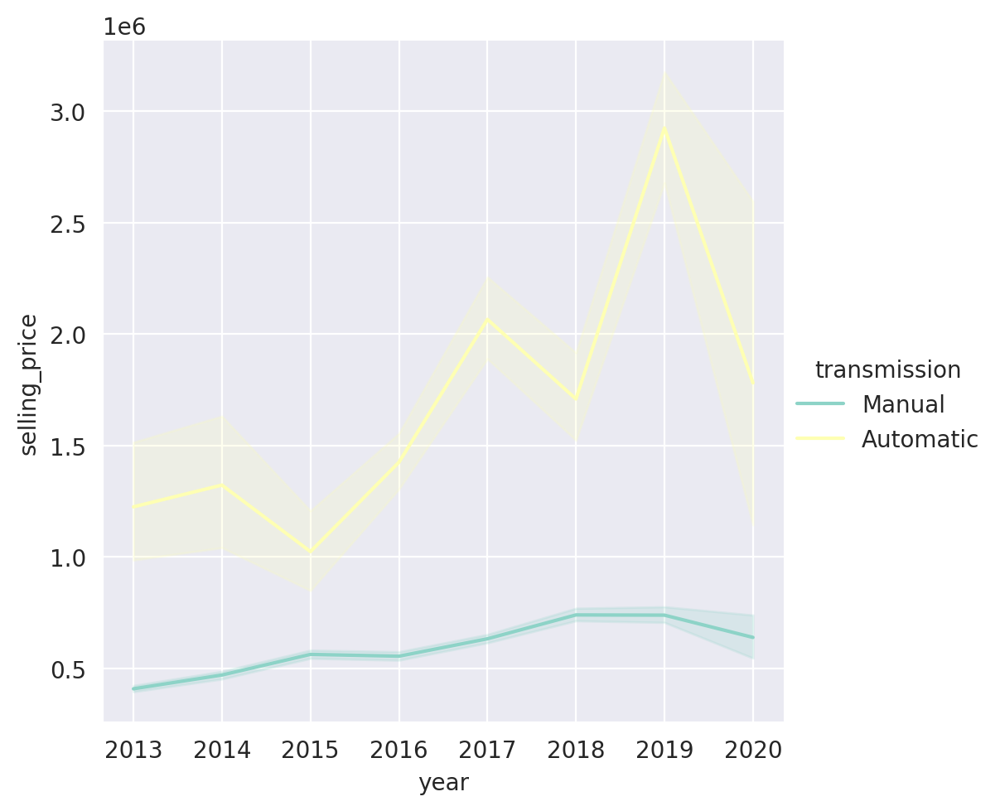

In [ ]:
sns.relplot(data=df,
            x='year',
            y='selling_price',
            kind='line',
            hue='transmission')

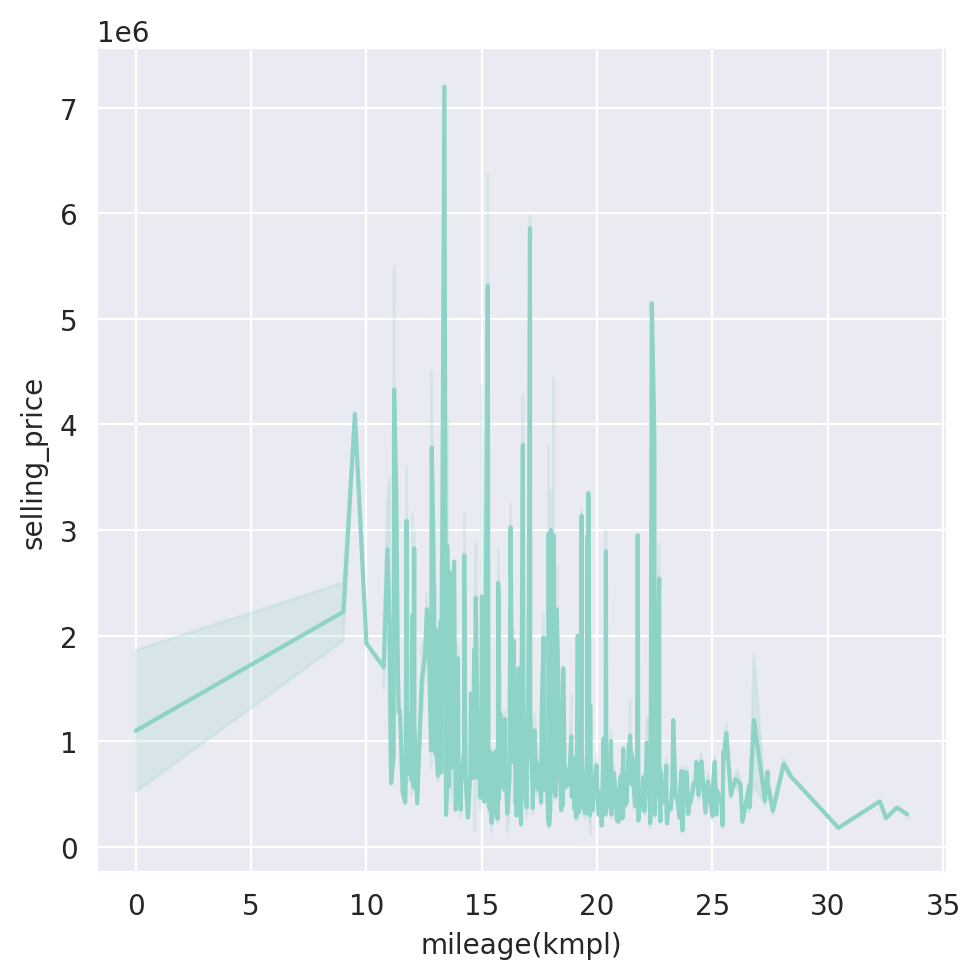

In [ ]:
sns.relplot(data=df,
            x='mileage(kmpl)',
            y='selling_price',
            kind='line')

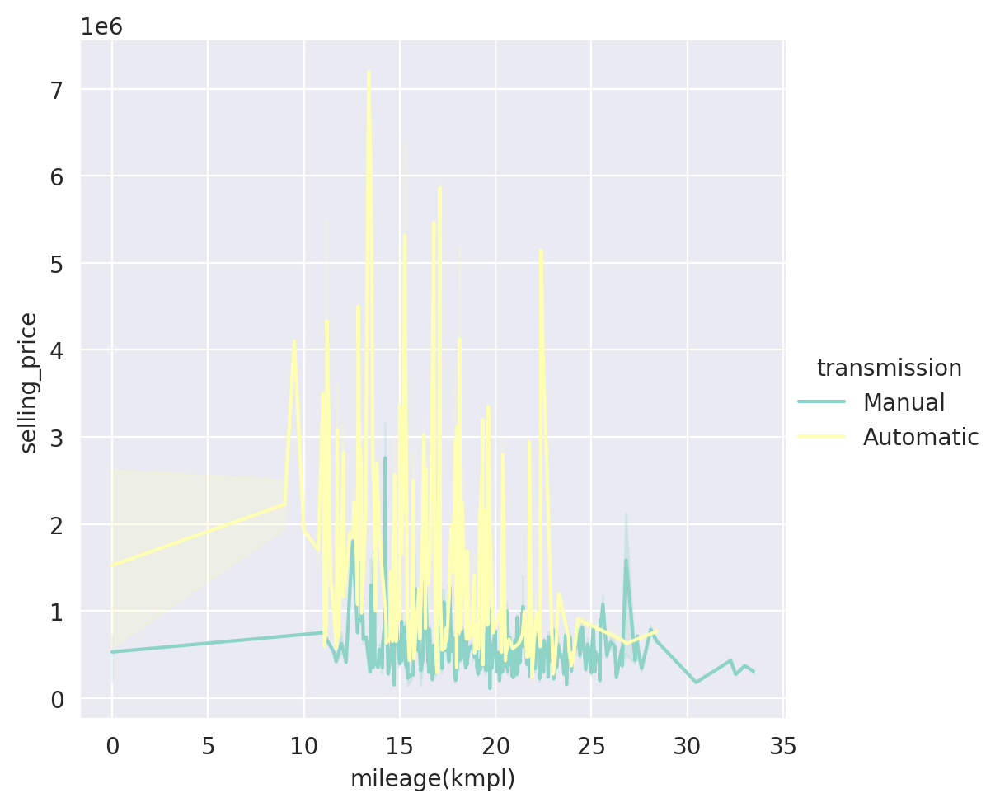

In [ ]:
sns.relplot(data=df,
            x='mileage(kmpl)',
            y='selling_price',
            kind='line',
            hue='transmission')

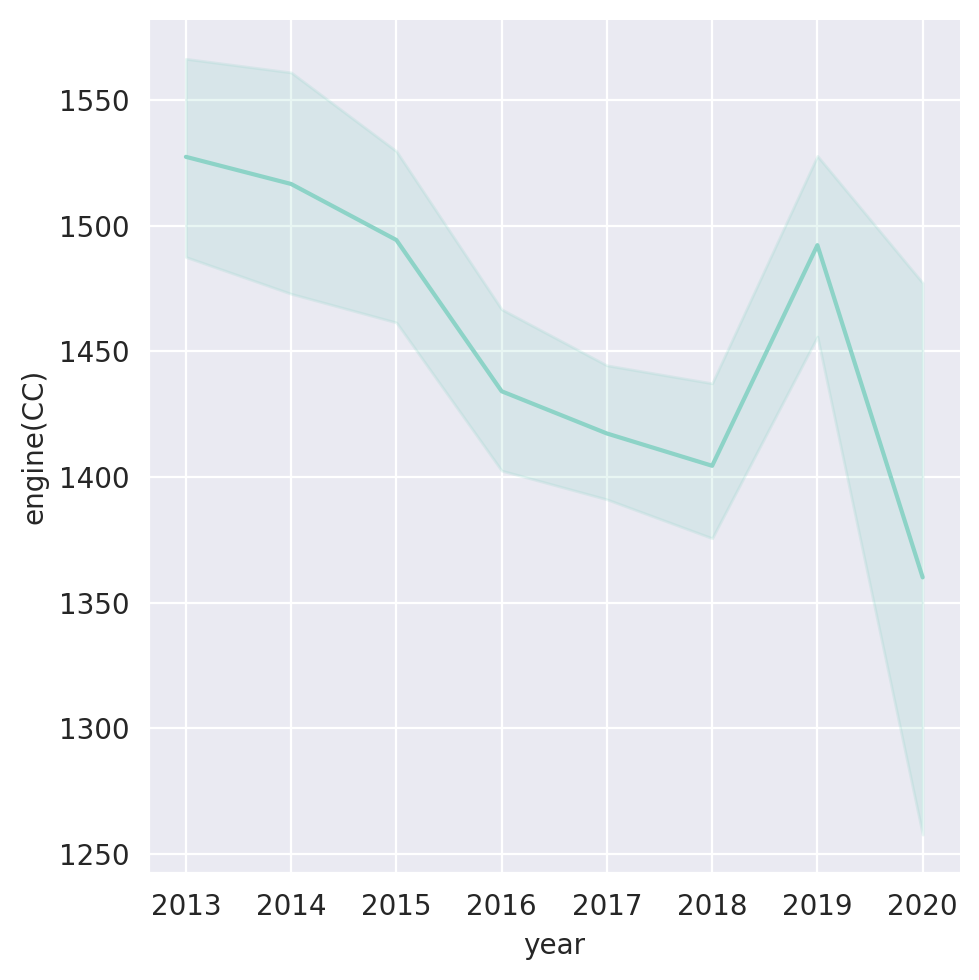

In [ ]:
sns.relplot(data=df,
            x='year',
            y='engine(CC)',
            kind='line', )

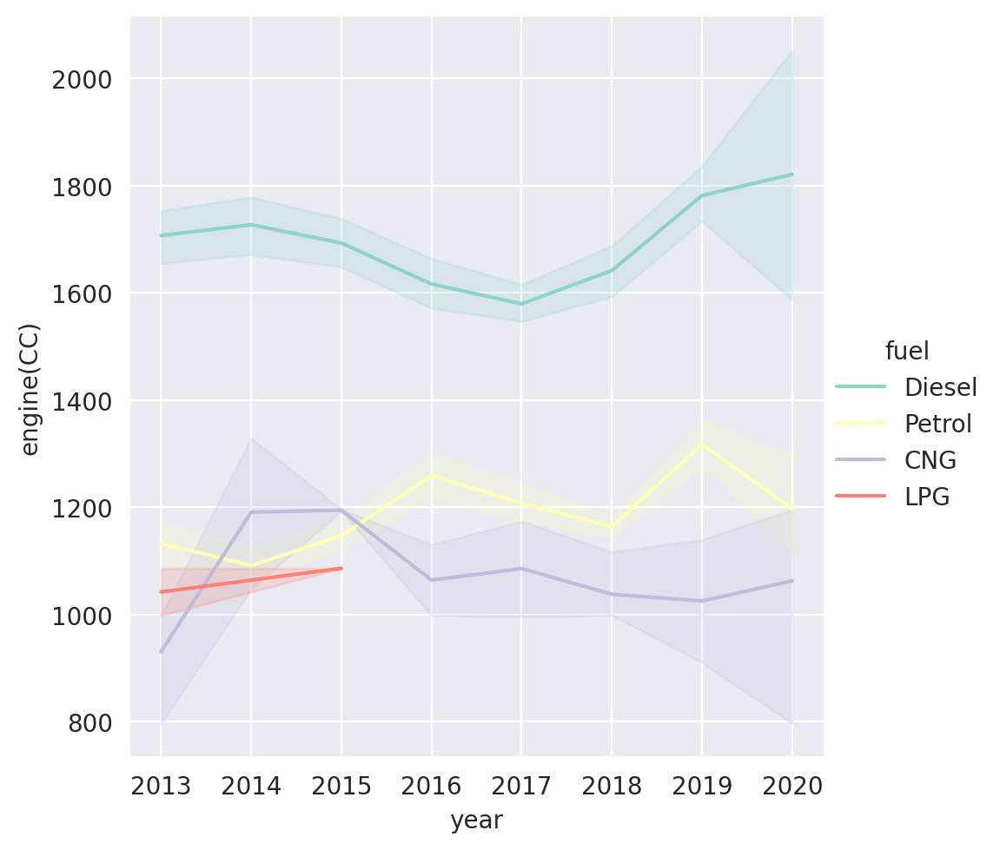

In [ ]:
sns.relplot(data=df,
            x='year',
            y='engine(CC)',
            kind='line',
            hue='fuel')

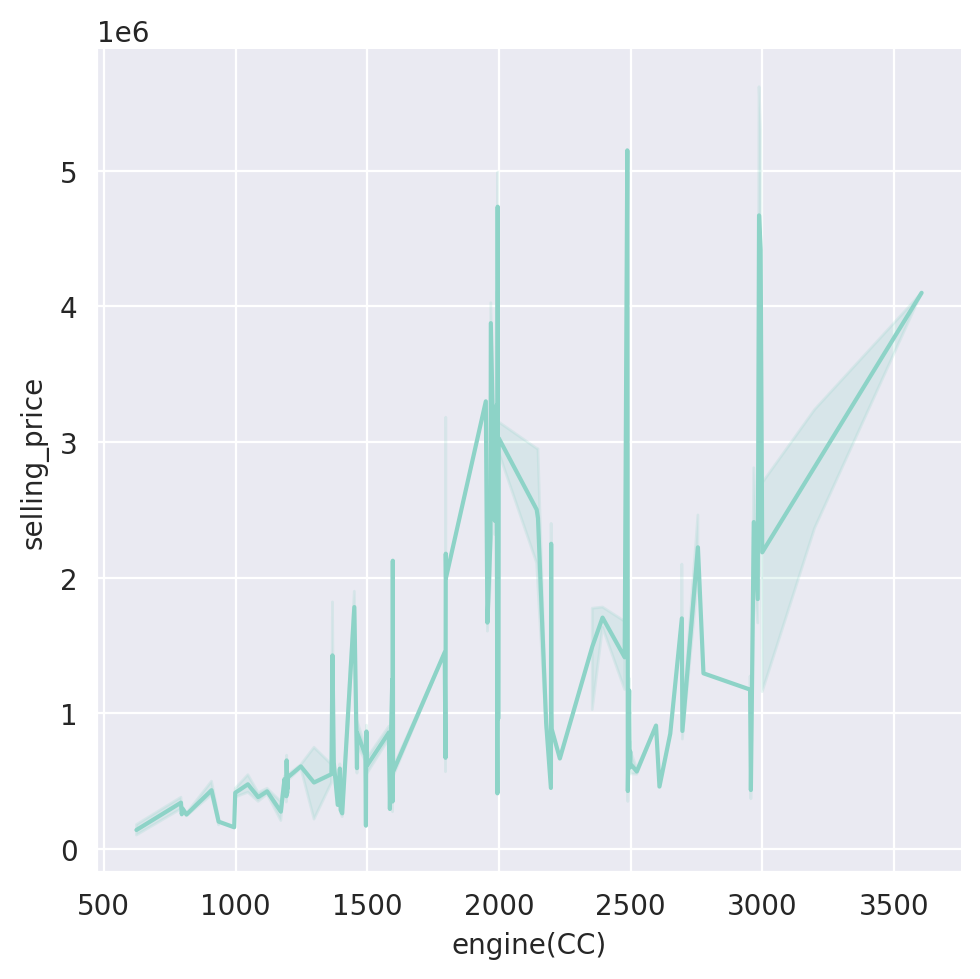

In [ ]:
sns.relplot(data=df,
            x='engine(CC)',
            y='selling_price',
            kind='line')

# Grouping

In [ ]:
copy_df = df.copy()
copy_df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage(kmpl),engine(CC),max_power(bhp),seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.10,5.0
10,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.45,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8121,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
8122,Hyundai i20 Magna 1.4 CRDi,2014,475000,80000,Diesel,Individual,Manual,Second Owner,22.54,1396.0,88.73,5.0
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [ ]:
copy_df = copy_df.groupby([
    "seats",'transmission']).agg(
    mean_price=('selling_price','mean'))
copy_df = copy_df.reindex()
copy_df

mean_price
seats transmission              
2.0   Manual        7.005000e+05
4.0   Automatic     3.943636e+06
      Manual        1.749286e+05
5.0   Automatic     2.007358e+06
      Manual        5.283602e+05
6.0   Manual        5.808852e+05
7.0   Automatic     1.930247e+06
      Manual        7.960317e+05
8.0   Automatic     1.391111e+06
      Manual        7.159489e+05
9.0   Manual        5.777221e+05
10.0  Manual        5.284998e+05

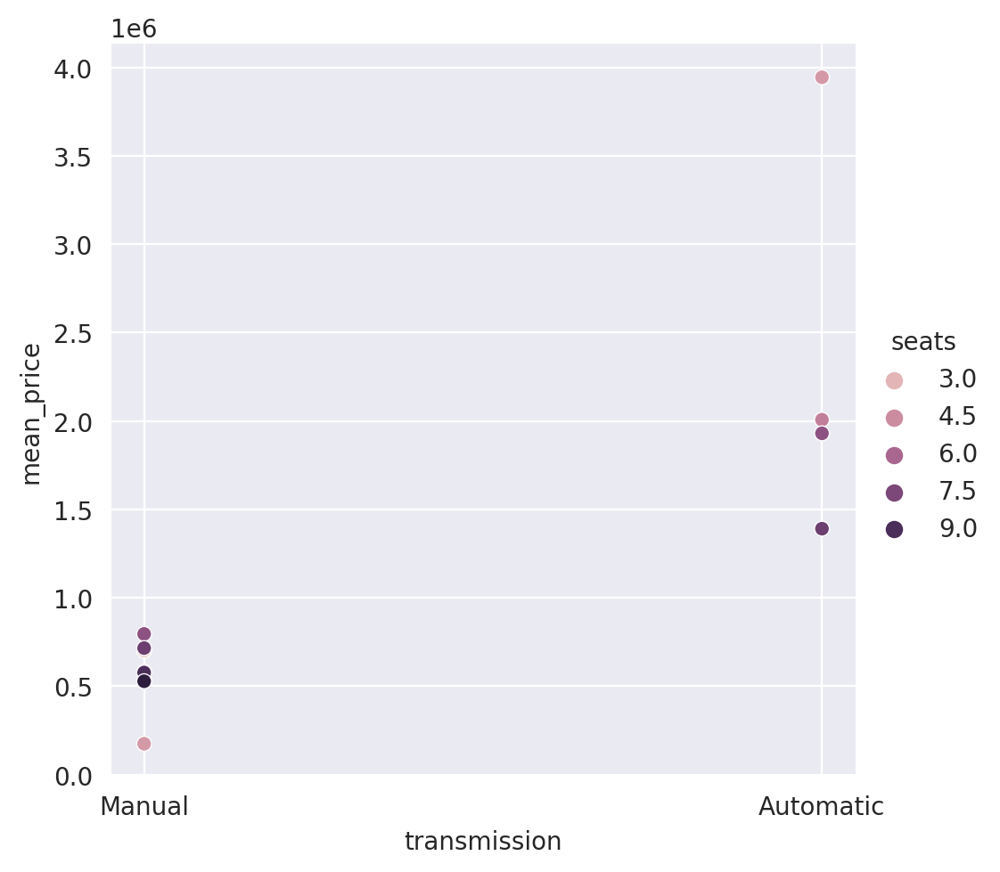

In [ ]:
sns.relplot(data=copy_df,
            x='transmission',
            y='mean_price',
            hue='seats')